# ANNDL Second Homework - DATA PROCESSING

## Set Environment

### Import libraries

In [ ]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [ ]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

### Connect to Drive

In [ ]:
# Add ANNDL_Homework_2 folder to My Drive shortcuts!
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/ANNDL_Homework_2

Mounted at /gdrive
/gdrive/.shortcut-targets-by-id/1tcMbhyBCx-7dmzBj9T-8FHrJWAsrKbEn/ANNDL_Homework_2


## Load Data

In [ ]:
training_data = np.load('training_dataset/training_data.npy')
valid_periods = np.load('training_dataset/valid_periods.npy')
categories = np.load('training_dataset/categories.npy')

## Data Exploration

In [ ]:
print("Training data shape:", training_data.shape)
print("Valid periods:", valid_periods.shape)
print("Categories:", categories.shape)

Training data shape: (48000, 2776)
Valid periods: (48000, 2)
Categories: (48000,)


In [ ]:
data_type = training_data.dtype

print(f"The data type of the training data is: {data_type}")

The data type of the training data is: float64


In [ ]:
training_data = training_data.astype("float32")

data_type = training_data.dtype

print(f"The data type of the training data is: {data_type}")

The data type of the training data is: float32


Convert training data into float32.

Inspect the first row of the training data.

In [ ]:
print("Timestamps:", training_data[0])
print("Valid period:", valid_periods[0])
print("Category:", categories[0])

Timestamps: [0.        0.        0.        ... 0.6027778 0.3675926 0.3314815]
Valid period: [2325 2776]
Category: D


Plot the first time serie in its entirety and in its valid period.

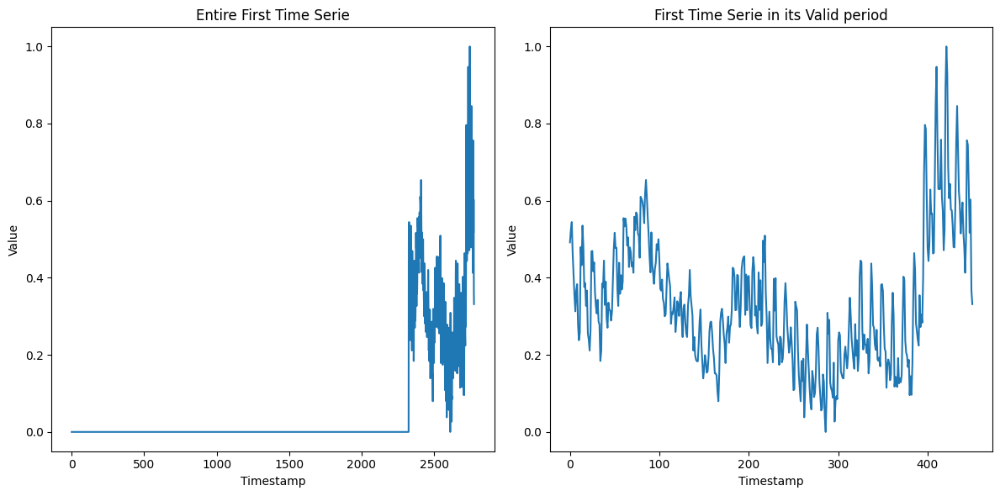

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot the first plot
axs[0].plot(training_data[0])
axs[0].set_xlabel('Timestamp')
axs[0].set_ylabel('Value')
axs[0].set_title('Entire First Time Serie')

# Plot the second plot
axs[1].plot(training_data[0][valid_periods[0][0]:valid_periods[0][1]])
axs[1].set_xlabel('Timestamp')
axs[1].set_ylabel('Value')
axs[1].set_title('First Time Serie in its Valid period')

plt.tight_layout()
plt.show()

Plotting random time series of the training data using different colors per each category.

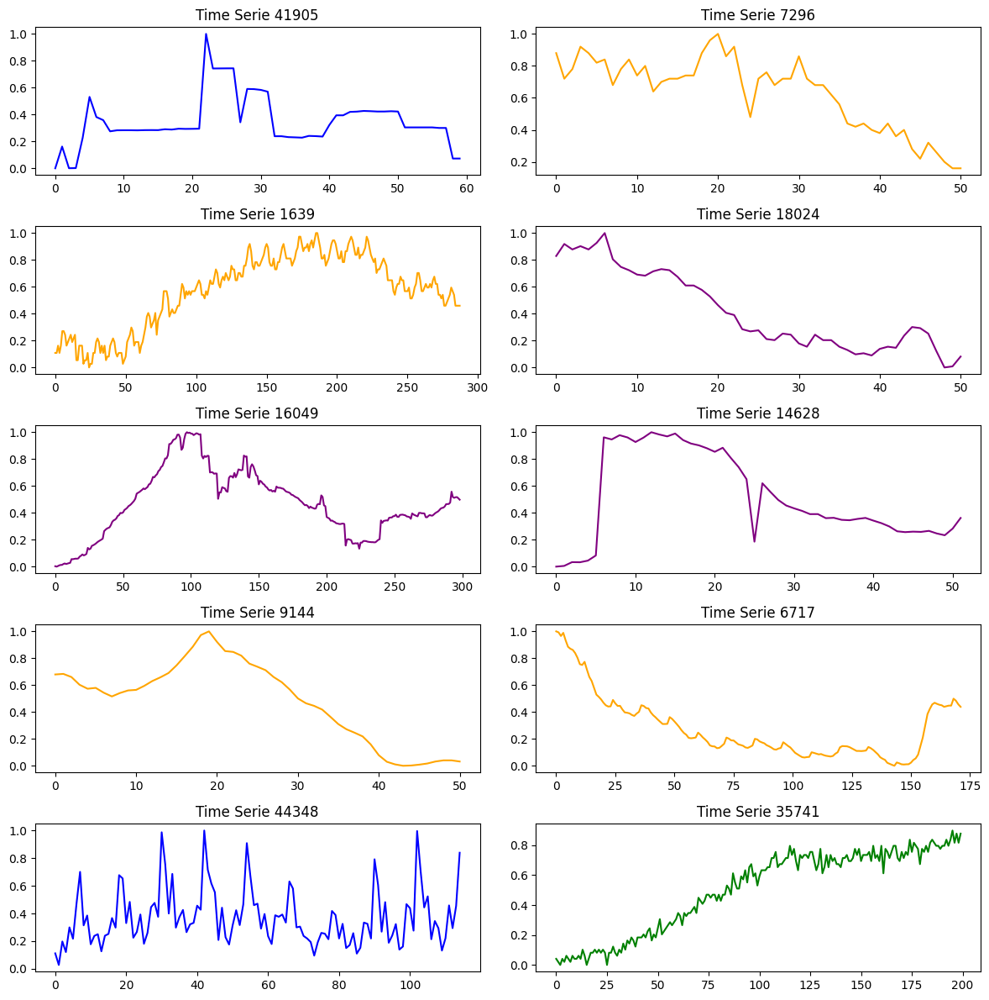

In [ ]:
# Define the colors for each category
category_colors = {
    'A': 'red',
    'B': 'blue',
    'C': 'green',
    'D': 'orange',
    'E': 'purple',
    'F': 'yellow'
}

fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(training_data.shape[0]), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(training_data[row_index][valid_periods[row_index][0]:valid_periods[row_index][1]], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Looking for the maximum and minimum value in the training data in order to decide wheter or not normalization is required.

In [ ]:
print("Maximum value in the training data:", np.max(training_data))
print("Minimum value in the training data:", np.min(training_data))

Maximum value in the training data: 1.0
Minimum value in the training data: 0.0


Data is already normalized so we don't need to go any further with normalization.

Analyse the lenght of the valid time periods.

In [ ]:
min_period = 2776
for period in valid_periods:
  temp = period[1] - period[0]
  if temp < min_period:
    min_period = temp

print("The shortes valid time period is:", min_period)

The shortes valid time period is: 24


In [ ]:
max_period = 0
for period in valid_periods:
  temp = period[1] - period[0]
  if temp > max_period:
    max_period = temp

print("The longest valid time period is:", max_period)

The longest valid time period is: 2776


# Various Data Processing Used

Here's a list of the various techniques used for processing the training data.

Note that the sections below are not intended to be run all together but one for each time the training data has been loaded before (since in each section it gets modified).

# First Data Processing

We tested different strides in order to generate the most performant model training, in the end we decided to use a stride of 218 to split the data in order to have more "uncorrelated" time series since there aren't same timestamps in different time series when splitting longer ones.

We didn't remove zero padding, we just took all (excpet for all 0 sequences obviously).

## Test Set

Generating a test set using time series having length around 218 or little more (from codalab test set lenght is 200 + 9 for phase 1 and 200 + 18 for phase 2).

In [ ]:
standard_length = 200 + 18

In [ ]:
test_series = []
for i,period in enumerate(valid_periods):
  temp = period[1] - period[0]
  if temp >= standard_length and temp <= 286:
    test_series.append(i)

test_samples = len(test_series)
print("Number of time series with 218 or little more timestamps:", test_samples)

Number of time series with 218 or little more timestamps: 5234


In [ ]:
test_raw_data = training_data[test_series]
test_periods = valid_periods[test_series]
test_categories = categories[test_series]

In [ ]:
test_raw_data.shape

(5234, 2776)

Generated 5234 time series for testing purpose (over the initial 48000).

Plotting these test time series.

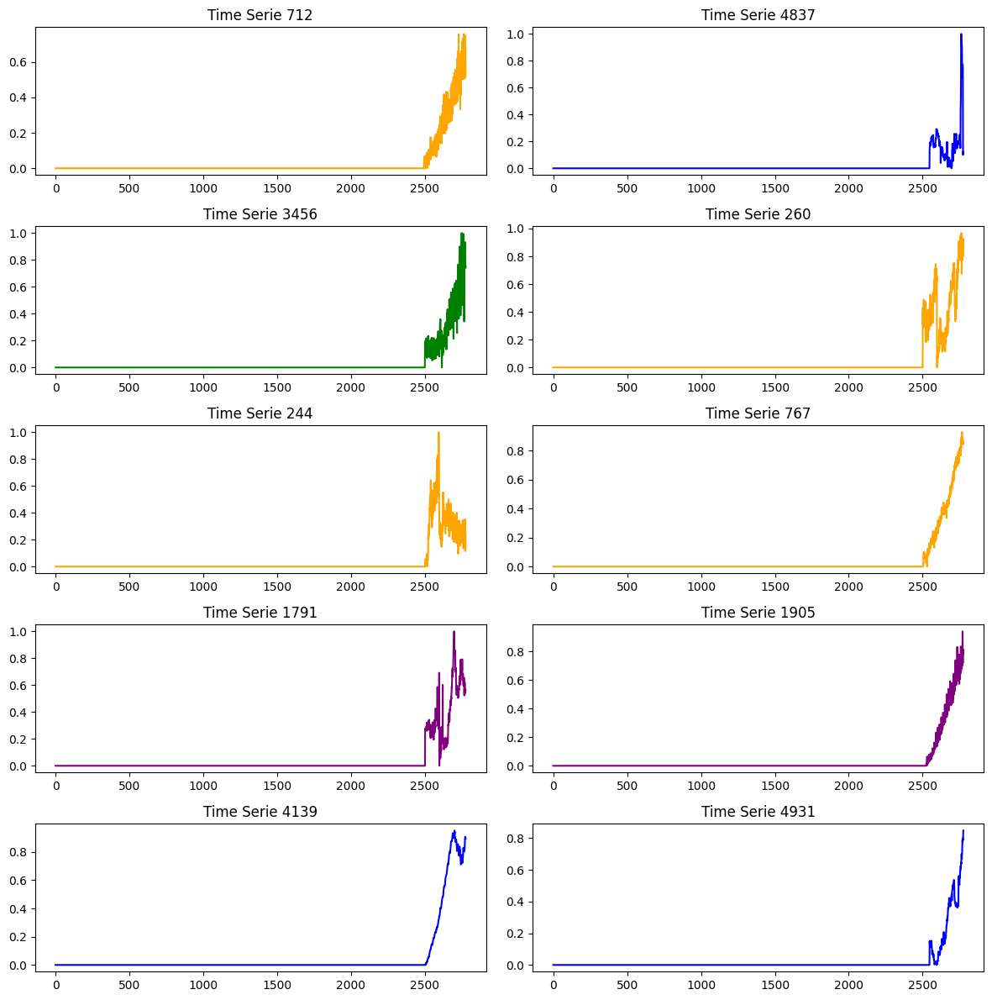

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_raw_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Reducing test series lenght to 218 as standard length for testing.

In [ ]:
test_data = np.zeros((test_samples, standard_length))
for i in range(test_samples):
  test_data[i] = test_raw_data[i, range(test_periods[i][0],test_periods[i][1])[:standard_length]]

Plotting the reshaped test time series.

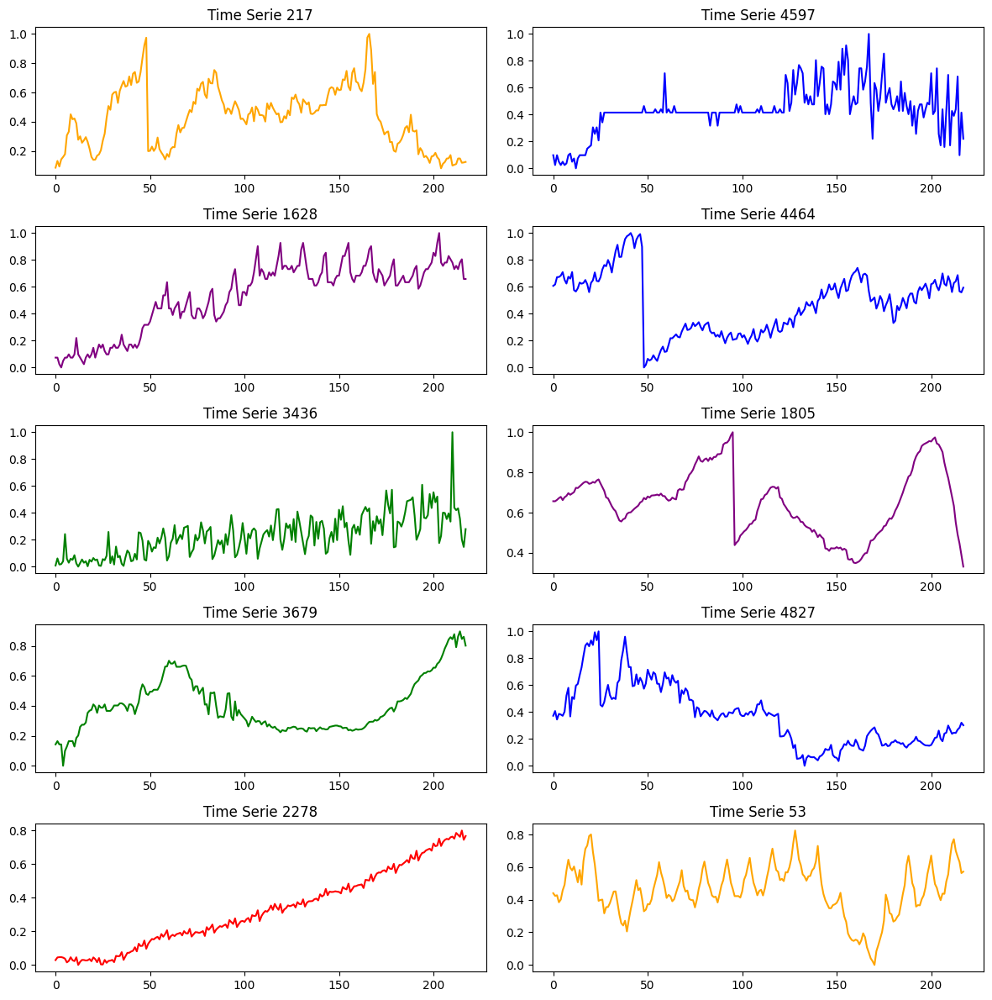

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Split the test and the predictions into 2 numpy arrays.

In [ ]:
prediction_length = 18
input_length = 200

x_test = np.zeros((test_samples, input_length))
y_test = np.zeros((test_samples, prediction_length))
for i in range(test_samples):
  x_test[i] = test_data[i, range(0,standard_length)[:input_length]]
  y_test[i] = test_data[i, range(0,standard_length)[-prediction_length:]]

In [ ]:
x_test.shape, y_test.shape

((5234, 200), (5234, 18))

Plot the test set with predictions in orange (x_test and y_test).

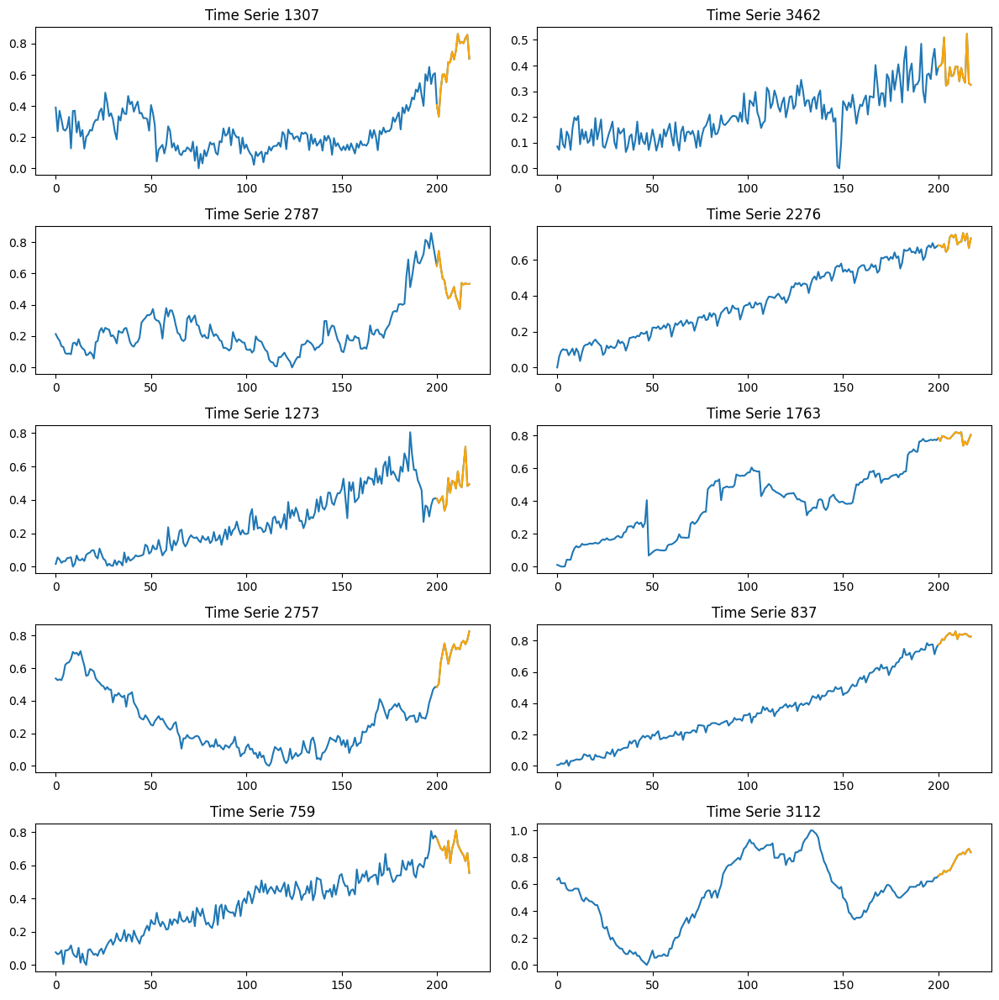

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([test_samples, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(test_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_test[row_index], y_test[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_test[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

## Training Set

In [ ]:
x_train_data = training_data[~np.isin(np.arange(len(training_data)), test_series)]
x_train_periods = valid_periods[~np.isin(np.arange(len(training_data)), test_series)]
x_train_categories = categories[~np.isin(np.arange(len(training_data)), test_series)]

In [ ]:
short_train_series = []
long_train_series = []

for i,period in enumerate(x_train_periods):
  temp = period[1] - period[0]
  if temp <= standard_length:
    short_train_series.append(i)
  else:
    long_train_series.append(i)


short_samples = len(short_train_series)
long_samples = len(long_train_series)
print("Number of time series shorter than 218 timestamps:", short_samples)
print("Number of time series longer than 218 timestamps:", long_samples)

Number of time series shorter than 218 timestamps: 28174
Number of time series longer than 218 timestamps: 14592


#### Shorter Time Series

In [ ]:
train_short_series = np.zeros((short_samples, standard_length))
for i,j in enumerate(short_train_series):
  train_short_series[i] = x_train_data[j, range(0,max_period)[-standard_length:]]
train_short_categories = x_train_categories[short_train_series]

In [ ]:
train_short_series.shape

(28174, 218)

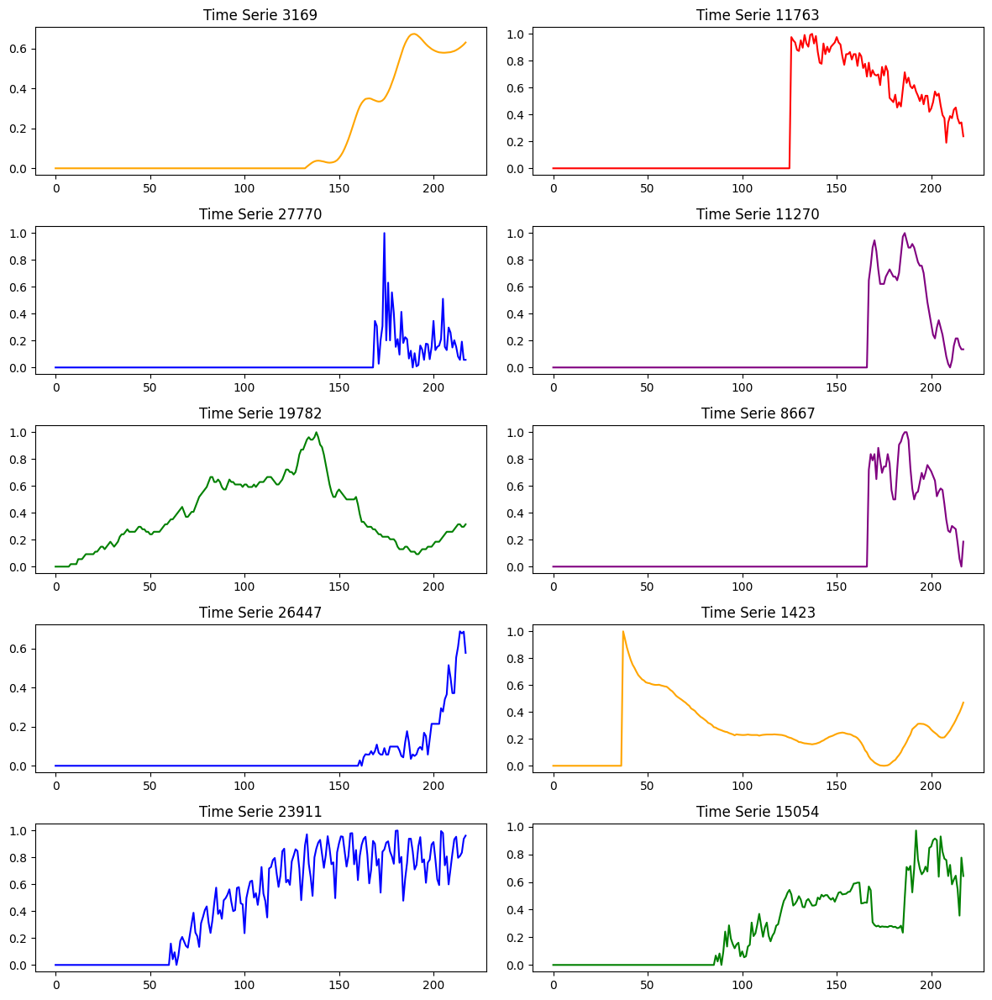

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(short_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_short_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(train_short_series[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

#### Longer Time Series

In [ ]:
stride = 218

In [ ]:
counter = 0
for i in long_train_series:
  j = 1
  for j in range(max_period):
    if x_train_periods[i][0] < max_period - standard_length - j * stride:
      counter += 1
    else:
      break
print(counter)

17076


In [ ]:
train_long_series = np.zeros((counter, standard_length))
train_long_categories = np.zeros((counter)).astype('str')

count = 0

for i in long_train_series:
  j = 1
  for j in range(max_period):
    if x_train_periods[i][0] < max_period - standard_length - j * stride:
      train_long_series[count] = x_train_data[i, range(0,max_period - j * stride)[-standard_length:]]
      train_long_categories[count] = x_train_categories[i]
      count += 1
    else:
      break

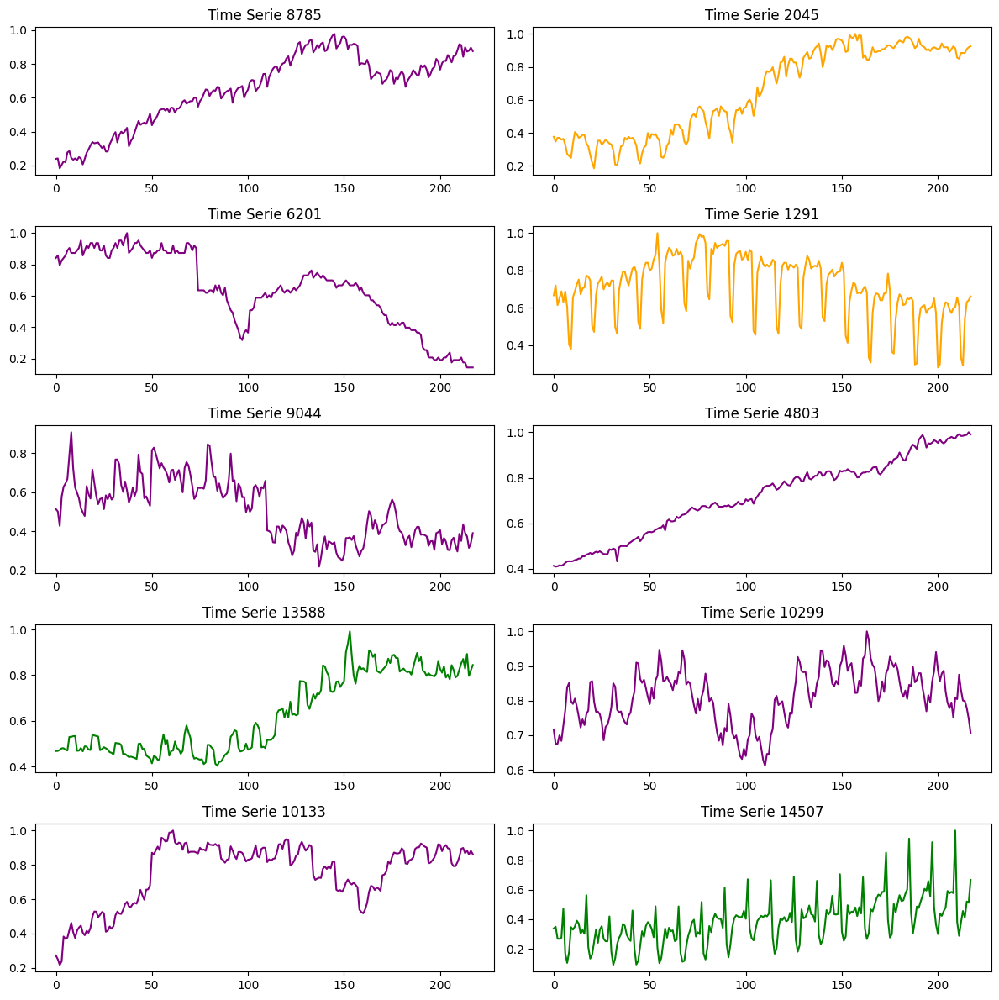

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(long_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_short_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(train_long_series[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

#### Combine in Train Set

In [ ]:
combined_train_data = np.concatenate((train_short_series,train_long_series))
combined_train_categories = np.concatenate((train_short_categories,train_long_categories))

## Train and Validation Split

Split the initial data into training, test and validation sets.

In [ ]:
# Split the data and labels into train and validation sets
train_data, val_data, train_categories, val_categories = train_test_split(combined_train_data, combined_train_categories, test_size=0.15, random_state=42)
train_shape = train_data.shape[0]
test_shape = x_test.shape[0]
val_shape = val_data.shape[0]
print("Shapes:")
print(f" Train: {train_shape} \n Test: {test_shape} \n Validation: {val_shape}")

Shapes:
 Train: 38462 
 Test: 5234 
 Validation: 6788


Analyse the distribution of category in the sets.

In [ ]:
# Count the occurrences of the categories
train_category_values, train_category_counts = np.unique(train_categories, return_counts=True)
test_category_values, test_category_counts = np.unique(test_categories, return_counts=True)
val_category_values, val_category_counts = np.unique(val_categories, return_counts=True)

# Print the counts
print("TRAIN:")
for value, count in zip(train_category_values, train_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("VALIDATION:")
for value, count in zip(val_category_values, val_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("TEST:")
for value, count in zip(test_category_values, test_category_counts):
    print(f"Train category: {value}, Count: {count}")

TRAIN:
Train category: A, Count: 4503
Train category: B, Count: 8699
Train category: C, Count: 8082
Train category: D, Count: 7848
Train category: E, Count: 9081
Train category: F, Count: 249
VALIDATION:
Train category: A, Count: 806
Train category: B, Count: 1586
Train category: C, Count: 1433
Train category: D, Count: 1408
Train category: E, Count: 1511
Train category: F, Count: 44
TEST:
Train category: A, Count: 658
Train category: B, Count: 1097
Train category: C, Count: 1333
Train category: D, Count: 1473
Train category: E, Count: 656
Train category: F, Count: 17


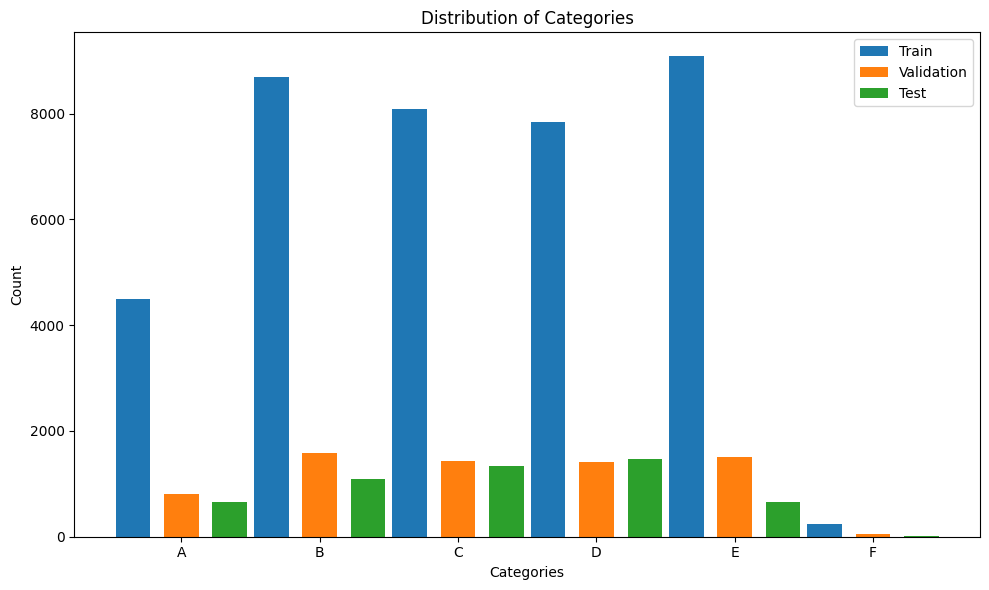

In [ ]:
# Calculate the width and spacing for the bars
bar_width = 0.25
spacing = 0.1

# Calculate the x-axis positions for each category
train_x = np.arange(len(train_category_values))
val_x = train_x + bar_width + spacing
test_x = val_x + bar_width + spacing

# Plot the distribution of categories
plt.figure(figsize=(10, 6))
plt.bar(train_x, train_category_counts, width=bar_width, label='Train')
plt.bar(val_x, val_category_counts, width=bar_width, label='Validation')
plt.bar(test_x, test_category_counts, width=bar_width, label='Test')
plt.xlabel('Categories')
plt.ylabel('Count')
plt.title('Distribution of Categories')
plt.xticks(val_x, train_category_values)  # Set x-axis labels
plt.legend()
plt.tight_layout()  # Adjust spacing between subplots
plt.show()

Categories looks evenly splitted between training, test and validation sets.

#### Split in Prediction and Train/Validation Set

In [ ]:
x_train = np.zeros((train_shape, input_length))
y_train = np.zeros((train_shape, prediction_length))
x_val = np.zeros((val_shape, input_length))
y_val = np.zeros((val_shape, prediction_length))
for i in range(train_shape):
  x_train[i] = train_data[i, range(0,standard_length)[:input_length]]
  y_train[i] = train_data[i, range(0,standard_length)[-prediction_length:]]
for i in range(val_shape):
  x_val[i] = val_data[i, range(0,standard_length)[:input_length]]
  y_val[i] = val_data[i, range(0,standard_length)[-prediction_length:]]

In [ ]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape

((38462, 200), (38462, 18), (6788, 200), (6788, 18))

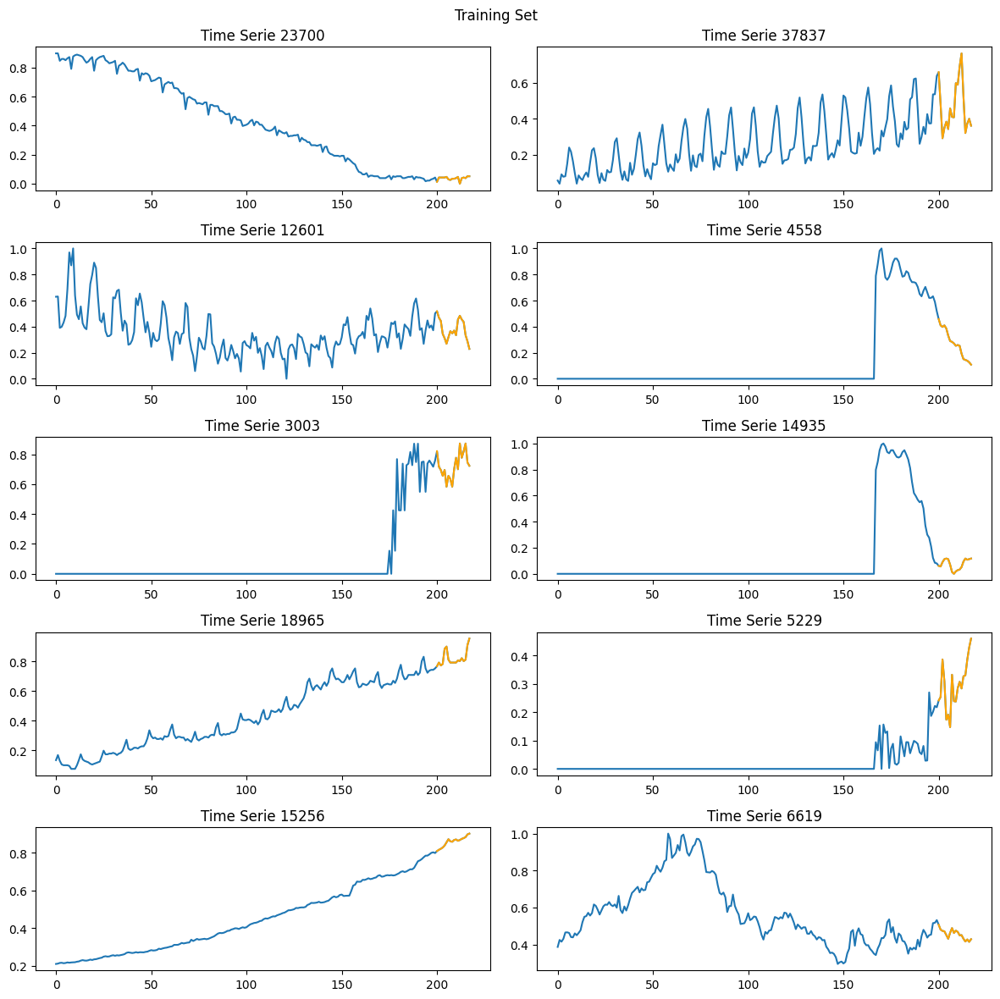

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([train_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(train_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_train[row_index], y_train[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_train[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Training Set")
plt.tight_layout()
plt.show()

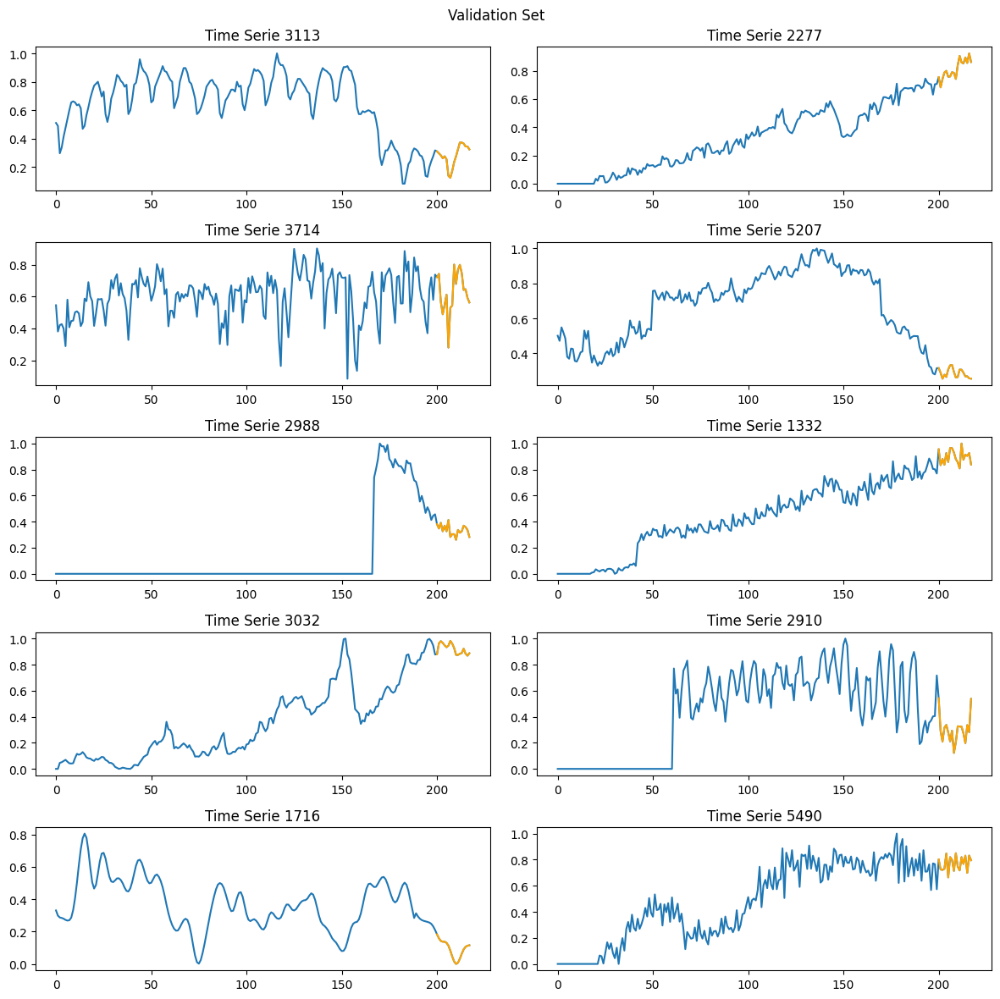

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([val_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(val_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_val[row_index], y_val[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_val[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Validation Set")
plt.tight_layout()
plt.show()

## Save Data

In [ ]:
# Save arrays to file
np.savez('Stride_218_float32.npz', x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val, x_test=x_test, y_test=y_test)

# Data in Categories
Next we tried to exploit the categories associated to the training data (A,B,C,D,E and F).

We stored the indexes, for each category, of the training data in a numpy array and used this to train our models (refer to "Category_splitted_Models.ipynb" for the training part).

We even tried to do data augmentation to the time series associated to category F using a smaller stride.

Here we also tried to replicate a more similar test set to the one provided in CodaLab by redimensioning it to 100 samples per category.

## Data Exploration

In [ ]:
print("Training data shape:", training_data.shape)
print("Valid periods:", valid_periods.shape)
print("Categories:", categories.shape)

Training data shape: (48000, 2776)
Valid periods: (48000, 2)
Categories: (48000,)


Converting Training Data type.

In [ ]:
data_type = training_data.dtype

print(f"The data type of the training data is: {data_type}")

The data type of the training data is: float64


In [ ]:
training_data = training_data.astype("float32")

data_type = training_data.dtype

print(f"The data type of the training data is: {data_type}")

The data type of the training data is: float32


Converted training data to float32.

Inspect the first row of the training data.

In [ ]:
print("Timestamps:", training_data[0])
print("Valid period:", valid_periods[0])
print("Category:", categories[0])

Timestamps: [0.        0.        0.        ... 0.6027778 0.3675926 0.3314815]
Valid period: [2325 2776]
Category: D


Plot the first time serie in its entirety and in its valid period.

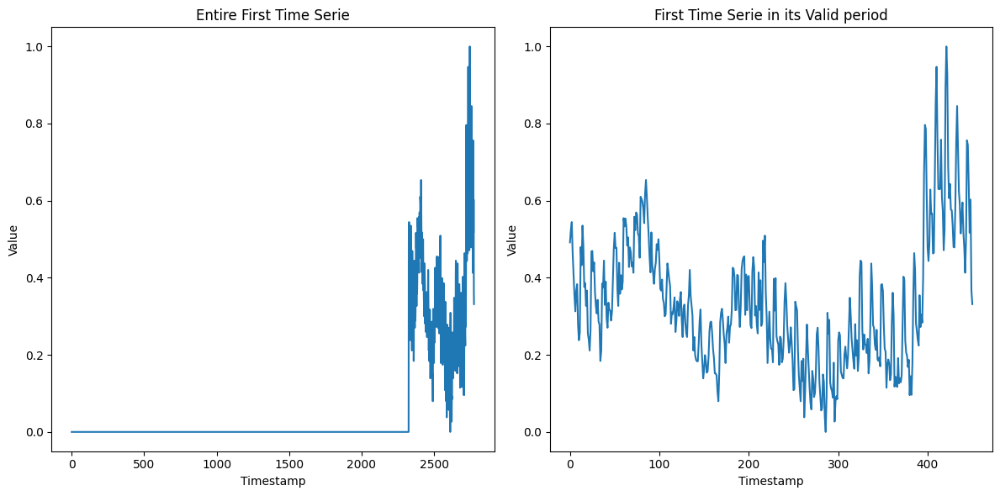

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot the first plot
axs[0].plot(training_data[0])
axs[0].set_xlabel('Timestamp')
axs[0].set_ylabel('Value')
axs[0].set_title('Entire First Time Serie')

# Plot the second plot
axs[1].plot(training_data[0][valid_periods[0][0]:valid_periods[0][1]])
axs[1].set_xlabel('Timestamp')
axs[1].set_ylabel('Value')
axs[1].set_title('First Time Serie in its Valid period')

plt.tight_layout()
plt.show()

Plotting random time series of the training data using different colors per each category.

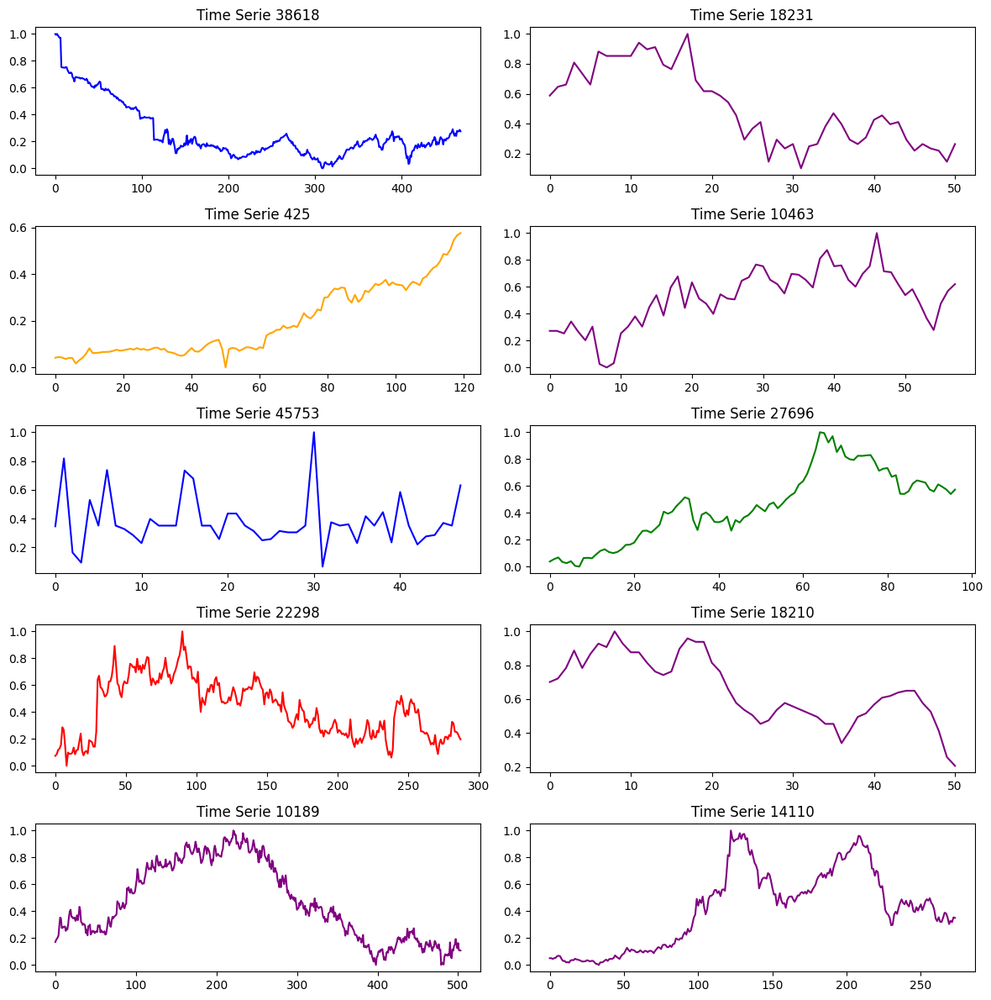

In [ ]:
# Define the colors for each category
category_colors = {
    'A': 'red',
    'B': 'blue',
    'C': 'green',
    'D': 'orange',
    'E': 'purple',
    'F': 'yellow'
}

fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(training_data.shape[0]), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(training_data[row_index][valid_periods[row_index][0]:valid_periods[row_index][1]], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Looking for the maximum and minimum value in the training data in order to decide wheter or not normalization is required.

In [ ]:
print("Maximum value in the training data:", np.max(training_data))
print("Minimum value in the training data:", np.min(training_data))

Maximum value in the training data: 1.0
Minimum value in the training data: 0.0


Data is already normalized so we don't need to go any further with normalization.

Analyse the length of the valid time periods.

In [ ]:
max_period = 0
for period in valid_periods:
  temp = period[1] - period[0]
  if temp > max_period:
    max_period = temp

print("The longest valid time period is:", max_period)

The longest valid time period is: 2776


In [ ]:
min_period = max_period
for period in valid_periods:
  temp = period[1] - period[0]
  if temp < min_period:
    min_period = temp

print("The shortes valid time period is:", min_period)

The shortes valid time period is: 24


In [ ]:
category_names, category_indexes, category_counts = np.unique(categories, return_index=True, return_counts=True)
for name, count in zip(category_names, category_counts):
    print(f"Category {name} has {count} Time Series")
print("\n")
for name, index in zip(category_names, category_indexes):
    print(f"Category {name} starts at position {index}")

Category A has 5728 Time Series
Category B has 10987 Time Series
Category C has 10017 Time Series
Category D has 10016 Time Series
Category E has 10975 Time Series
Category F has 277 Time Series


Category A starts at position 20991
Category B starts at position 36736
Category C starts at position 26719
Category D starts at position 0
Category E starts at position 10016
Category F starts at position 47723


Analyse the length of the time serie.

In [ ]:
short_series = []
long_series = []

for i,period in enumerate(valid_periods):
  val_period = period[1] - period[0]
  if val_period < stride:
    short_series.append(i)
  else:
    long_series.append(i)

short_series_categories = categories[short_series]
long_series_categories = categories[long_series]

num_of_short_series = len(short_series)
num_of_long_series = len(long_series)
print("Number of time series shorter than 218 timestamps:", num_of_short_series)
print("Number of time series longer than 218 timestamps:", num_of_long_series)

Number of time series shorter than 218 timestamps: 28174
Number of time series longer than 218 timestamps: 19826


In [ ]:
# Count the occurrences of the categories
short_category_name, short_category_counts = np.unique(short_series_categories, return_counts=True)

for name, count in zip(short_category_name, short_category_counts):
    print(f"Train category {name} has {count} short Time Series")

Train category A has 1897 short Time Series
Train category B has 8150 short Time Series
Train category C has 6351 short Time Series
Train category D has 4670 short Time Series
Train category E has 6894 short Time Series
Train category F has 212 short Time Series


In [ ]:
# Count the occurrences of the categories
long_category_name, long_category_counts = np.unique(long_series_categories, return_counts=True)

for name, count in zip(long_category_name, long_category_counts):
    print(f"Train category {name} has {count} long Time Series")

Train category A has 3831 long Time Series
Train category B has 2837 long Time Series
Train category C has 3666 long Time Series
Train category D has 5346 long Time Series
Train category E has 4081 long Time Series
Train category F has 65 long Time Series


## Data Processing

### Data Augmentation (F)

Augmenting the number of time series for category F.

In [ ]:
counter = 0
for i in range(category_indexes[-1],training_size):
  j = 1
  for j in range(max_period):
    if valid_periods[i][0] < max_period - input - j * stride_F:
      counter += 1
    else:
      break
print(counter)

2792


In [ ]:
train_series_augmented = np.zeros((counter, stride))
train_categories_augmented = np.zeros((counter)).astype('str')

count = 0
for i in range(category_indexes[-1],training_size):
  j = 1
  for j in range(max_period):
    if valid_periods[i][0] < max_period - input - j * stride_F:
      train_series_augmented[count] = training_data[i, range(0,max_period - j * stride_F)[-stride:]]
      train_categories_augmented[count] = categories[i]
      count += 1
    else:
      break

In [ ]:
train_series_augmented.shape

(2792, 218)

We augmented the training data by generating 100 time series from the F category.

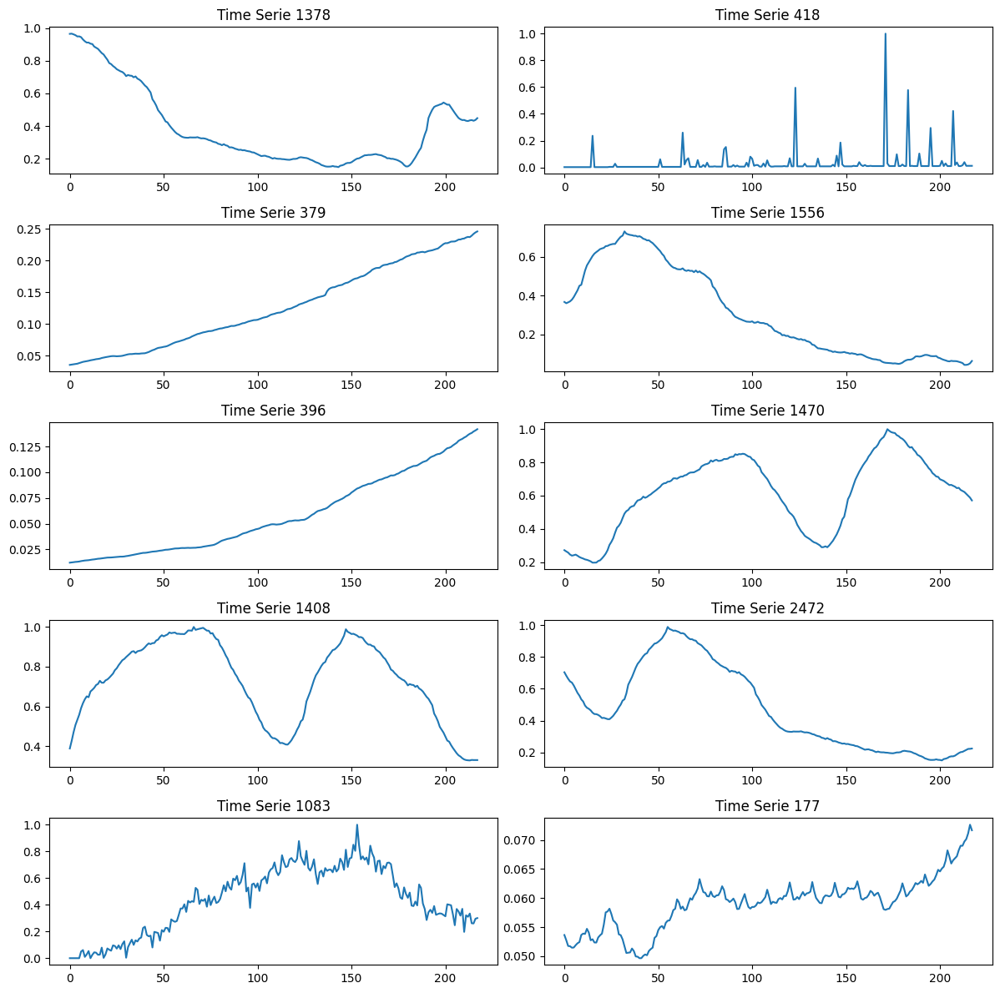

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(train_series_augmented.shape[0]), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(train_series_augmented[row_index])
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

### Data Reshaping

Reshaping data to match input and output from CodaLab.

In [ ]:
training_data = training_data[:,-218:]

In [ ]:
training_data.shape

(48000, 218)

Adding the augmented data of category F.

In [ ]:
training_data = np.concatenate((training_data,train_series_augmented))
categories = np.concatenate((categories,train_categories_augmented))

In [ ]:
training_data.shape

(50792, 218)

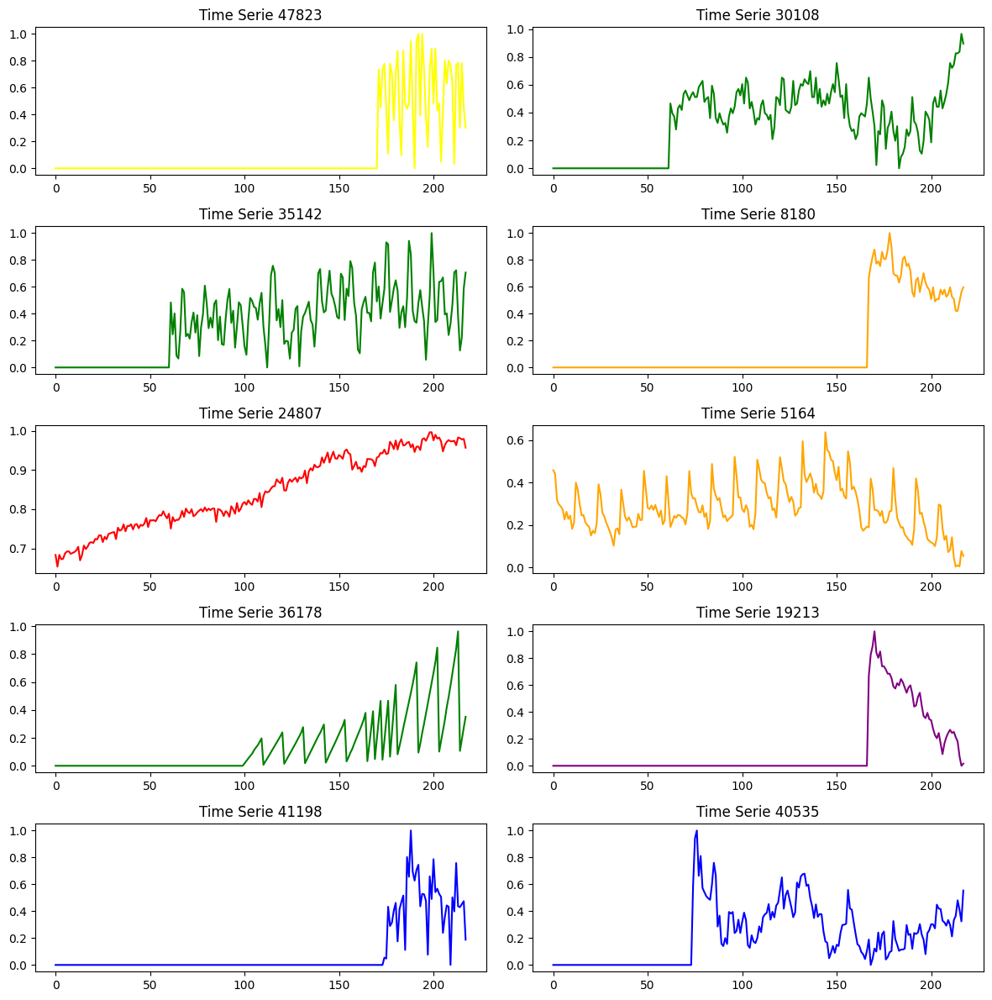

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(48000), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(training_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

### Test Set

In [ ]:
tests_per_category = 800 # test set will have dimension around 10% w.r.t. training and validation sets

In [ ]:
test_indexes = []
for index in category_indexes:
    test_indexes.extend(list(range(index, tests_per_category + index)))

In [ ]:
training_data[test_indexes].shape

(4800, 218)

In [ ]:
test_data = training_data[test_indexes]
test_categories = categories[test_indexes]

In [ ]:
test_data.shape

(4800, 218)

In [ ]:
test_size = test_data.shape[0]
print("The test size will be:", test_size)

The test size will be: 4800


In [ ]:
# Count the occurrences of the categories
test_category_name, test_category_counts = np.unique(test_categories, return_counts=True)

for name, count in zip(test_category_name, test_category_counts):
    print(f"Test category {name} has {count} Time Series")

Test category A has 800 Time Series
Test category B has 800 Time Series
Test category C has 800 Time Series
Test category D has 800 Time Series
Test category E has 800 Time Series
Test category F has 800 Time Series


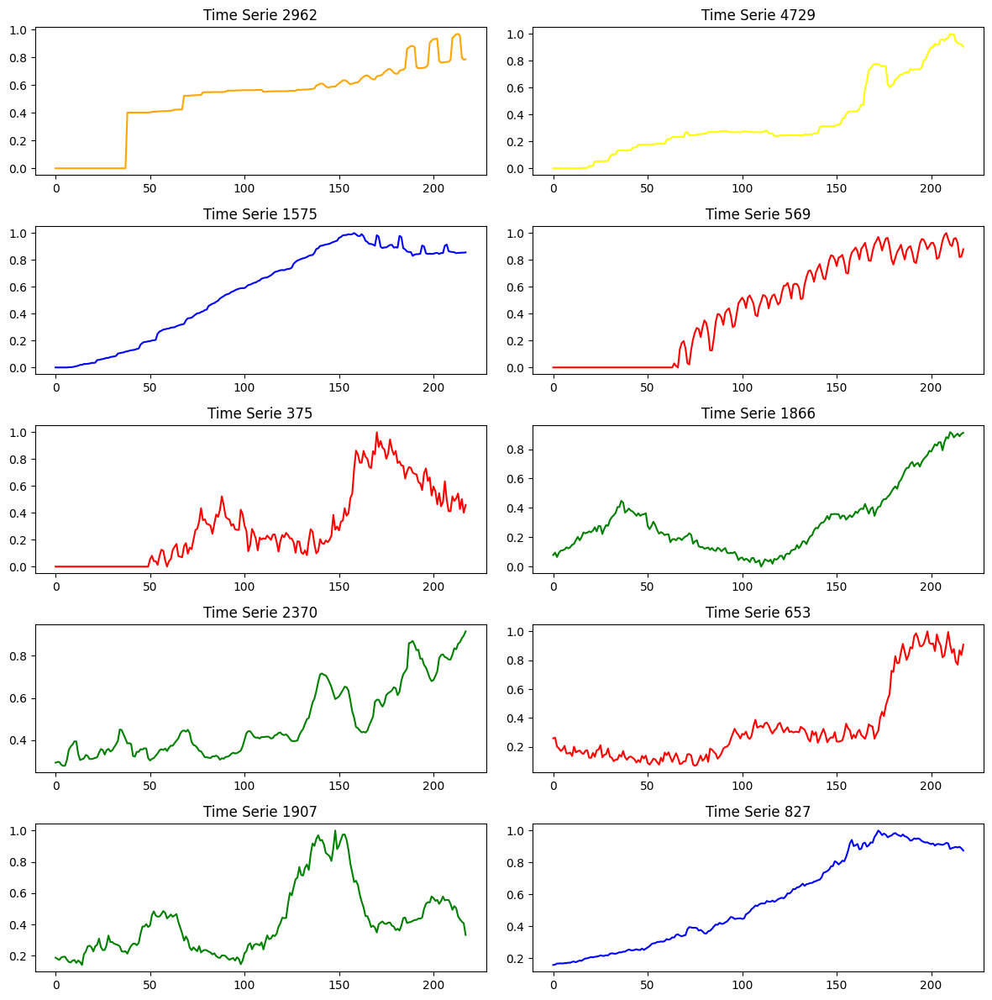

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

#### Split in x_test and y_test

In [ ]:
x_test = np.zeros((test_size, input))
y_test = np.zeros((test_size, output))
for i in range(test_size):
  x_test[i] = test_data[i, range(0,stride)[:input]]
  y_test[i] = test_data[i, range(0,stride)[-output:]]

In [ ]:
x_test.shape, y_test.shape

((4800, 200), (4800, 18))

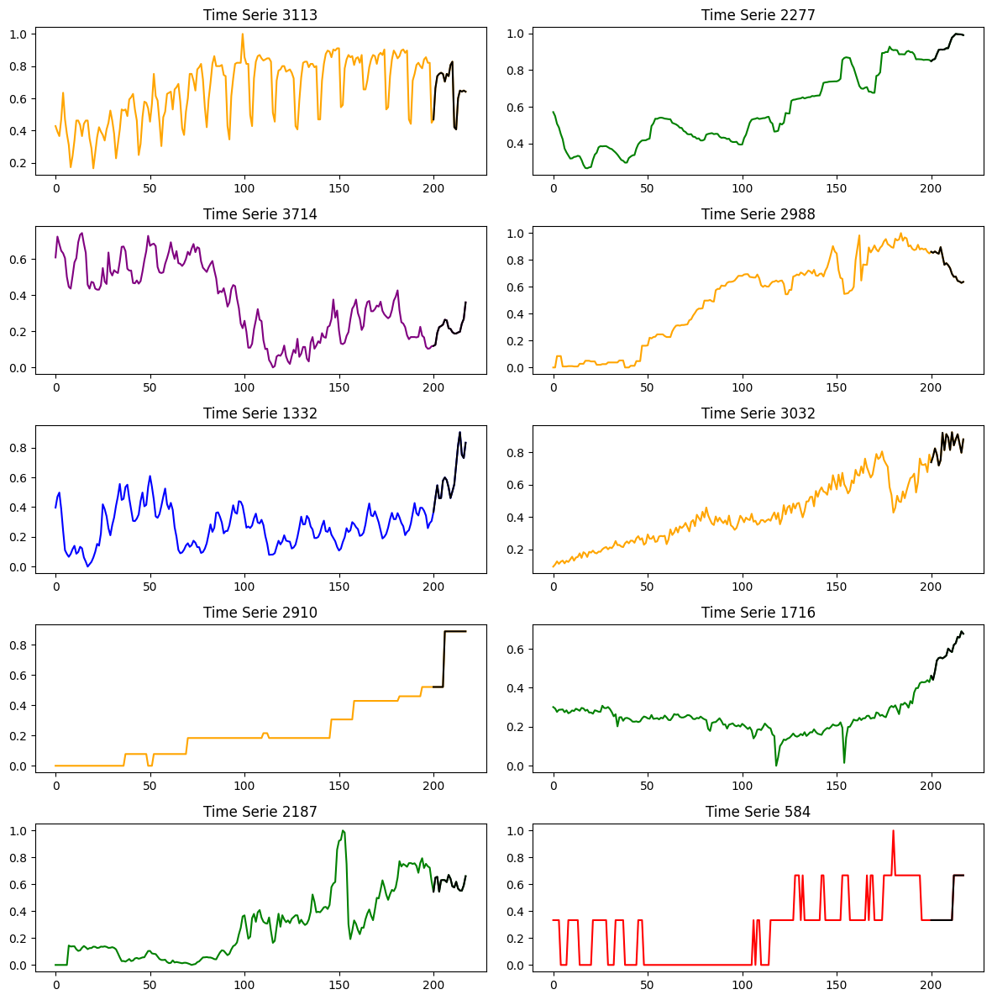

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([test_size, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(np.concatenate((x_test[row_index], y_test[row_index])), color=color)
    axs[row, col].plot(np.concatenate((empty[row_index], y_test[row_index])), color='black')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

### Train and Validation Sets

In [ ]:
train_val_data = np.delete(training_data, test_indexes, axis=0)
train_val_categories = np.delete(categories, test_indexes, axis=0)

In [ ]:
train_val_size = train_val_data.shape[0]

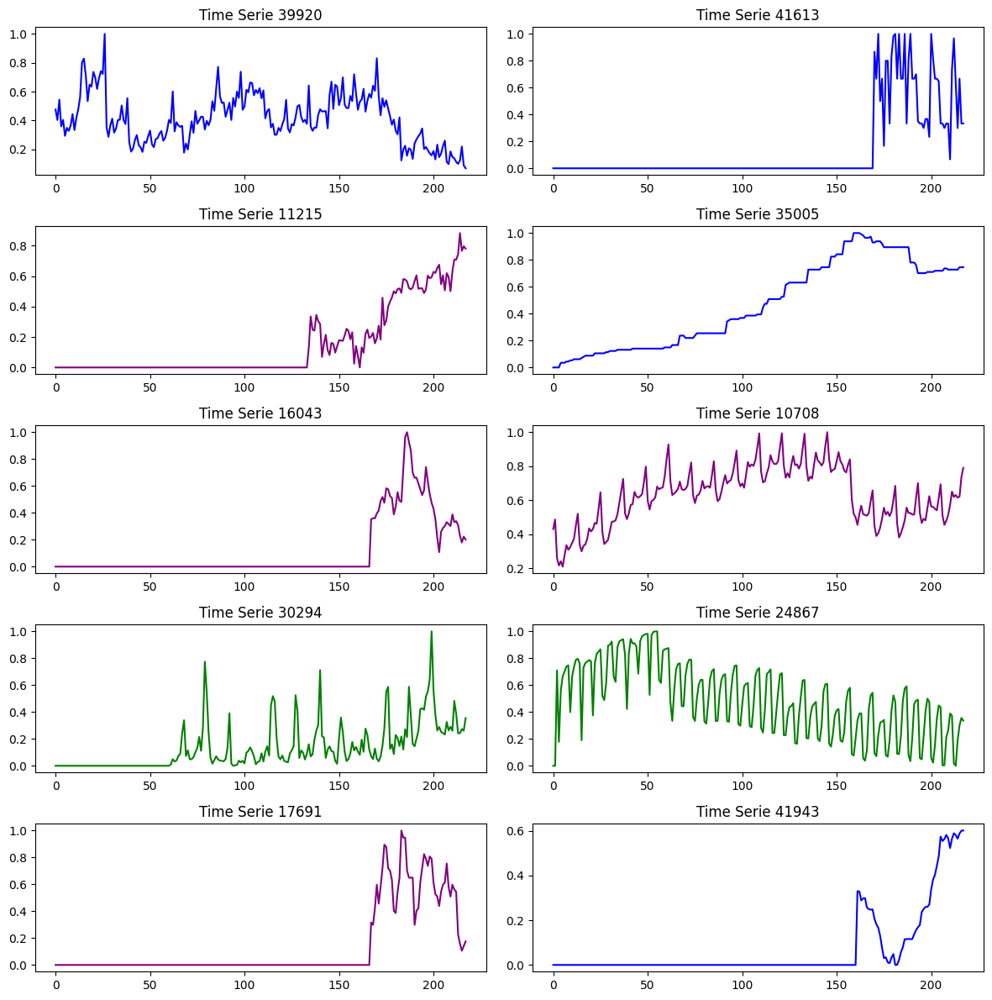

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(train_val_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_val_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(train_val_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

#### Split in x and y

In [ ]:
x_train_val = np.zeros((train_val_size, input))
y_train_val = np.zeros((train_val_size, output))
for i in range(train_val_size):
  x_train_val[i] = train_val_data[i, range(0,stride)[:input]]
  y_train_val[i] = train_val_data[i, range(0,stride)[-output:]]

In [ ]:
x_train_val.shape, y_train_val.shape

((45992, 200), (45992, 18))

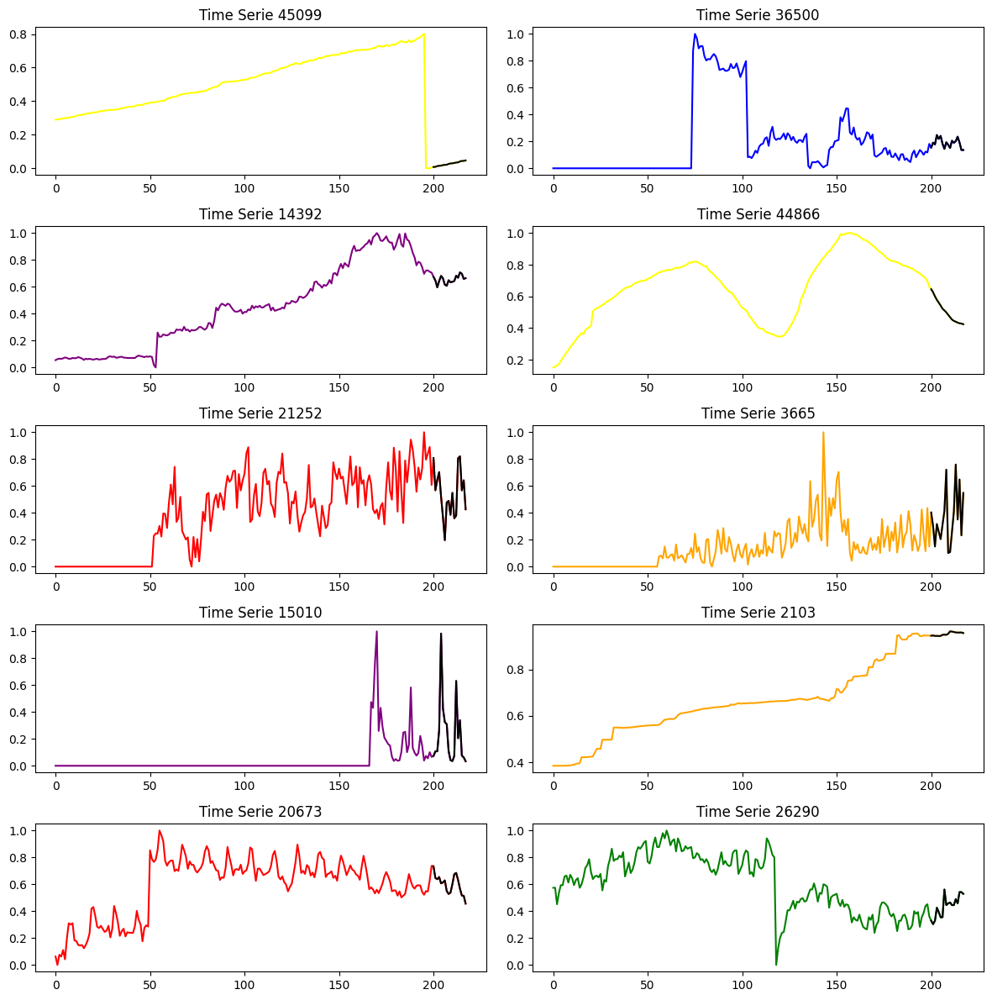

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([train_val_size, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(train_val_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_val_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(np.concatenate((x_train_val[row_index], y_train_val[row_index])), color=color)
    axs[row, col].plot(np.concatenate((empty[row_index], y_train_val[row_index])), color='black')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

#### Training and Validation Split

In [ ]:
# Split the data and categories into train and validation sets
x_train, x_val, y_train, y_val, train_categories, val_categories = train_test_split(x_train_val,
                                                                                    y_train_val,
                                                                                    train_val_categories,
                                                                                    test_size=0.2,
                                                                                    random_state=42)

In [ ]:
train_shape = x_train.shape[0]
val_shape = x_val.shape[0]
print("Shapes:")
print(f" Train: {train_shape} \n Validation: {val_shape}")

Shapes:
 Train: 36793 
 Validation: 9199


## Data Summary

Train:

In [ ]:
x_train.shape, y_train.shape, train_categories.shape

((36793, 200), (36793, 18), (36793,))

Validation:

In [ ]:
x_val.shape, y_val.shape, val_categories.shape

((9199, 200), (9199, 18), (9199,))

Test:

In [ ]:
x_test.shape, y_test.shape, test_categories.shape

((4800, 200), (4800, 18), (4800,))

## Save Data

In [ ]:
train_category_names, train_category_counts = np.unique(train_categories, return_counts=True)
for name, count in zip(train_category_names, train_category_counts):
    print(f"Category {name} has {count} Time Series")

Category A has 3936 Time Series
Category B has 8183 Time Series
Category C has 7306 Time Series
Category D has 7338 Time Series
Category E has 8196 Time Series
Category F has 1834 Time Series


Store indexes of each category in the sets.

In [ ]:
A = np.where(train_categories == 'A')[0]
B = np.where(train_categories == 'B')[0]
C = np.where(train_categories == 'C')[0]
D = np.where(train_categories == 'D')[0]
E = np.where(train_categories == 'E')[0]
F = np.where(train_categories == 'F')[0]

train_category_indexes = [A, B, C, D, E, F]

A = np.where(val_categories == 'A')[0]
B = np.where(val_categories == 'B')[0]
C = np.where(val_categories == 'C')[0]
D = np.where(val_categories == 'D')[0]
E = np.where(val_categories == 'E')[0]
F = np.where(val_categories == 'F')[0]

val_category_indexes = [A, B, C, D, E, F]

A = np.where(test_categories == 'A')[0]
B = np.where(test_categories == 'B')[0]
C = np.where(test_categories == 'C')[0]
D = np.where(test_categories == 'D')[0]
E = np.where(test_categories == 'E')[0]
F = np.where(test_categories == 'F')[0]

test_category_indexes = [A, B, C, D, E, F]

In [ ]:
# Save arrays to file
np.savez('Category_Splitted_Data_F800.npz', x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val, x_test=x_test, y_test=y_test, train_category_indexes=train_category_indexes, val_category_indexes=val_category_indexes, test_category_indexes=test_category_indexes)

# Improved Test Data

We simply dropped the idea to use categories for the training and replicated the previous concept of smaller and balanced test set used in the category data.

Parameters of the data (taken from CodaLab).

In [ ]:
window = 200 + 18
stride = int(window / 2)
prediction_length = 18
input_length = 200

In [ ]:
# Get the unique categories
unique_categories = np.unique(categories)
unique_categories

array(['A', 'B', 'C', 'D', 'E', 'F'], dtype='<U1')

### Test Set

The number of time series per category used for testing (except for F category that is underrepresented).

In [ ]:
test_dimension = 100

For testing purpose we preferred to consider only those time series without zero padding, so all those containing more than 218 timestamps.

We also preferred to avoid using too long time series because we are going to amplify the data by using a certain stride and we tought that maybe it will create some correlation with the training data.

So test data contains all those time series that are complete and that are not going to be amplified.

In [ ]:
test_series = []
for i,period in enumerate(valid_periods):
  temp = period[1] - period[0]
  if temp >= window and temp <= window*2:
    test_series.append(i)

test_samples = len(test_series)
print(f"Uncorrelated and complete data are {test_samples} time series")

Uncorrelated and complete data are 18000 time series


In [ ]:
# Initialize an empty list to store the concatenated arrays
test_series_reduced = []

# Iterate over each unique category
for cat in unique_categories:
    # Get the indices where the category matches in the 'test_series' array
    indices = np.where(cat == categories[test_series])[0][:test_dimension].astype(int)

    # Append the obtained array to the 'concatenated_array'
    test_series_reduced.extend(indices)

# Convert the list to a numpy array if needed
test_series_reduced = np.array(test_series_reduced)

In [ ]:
# Access values from test_series at indices in test_series_reduced
selected_test_series = np.array([test_series[index] for index in test_series_reduced])

In [ ]:
test_size = selected_test_series.shape[0]
print(test_size)

539


We obtained 539 test time series (100 per each category from A to E and 39 for category F).

In [ ]:
test_raw_data = training_data[selected_test_series]
test_periods = valid_periods[selected_test_series]
test_categories = categories[selected_test_series]

In [ ]:
test_raw_data.shape

(539, 2776)

Generated 539 time series for testing purpose (over the initial 48000).

Plotting these test time series.

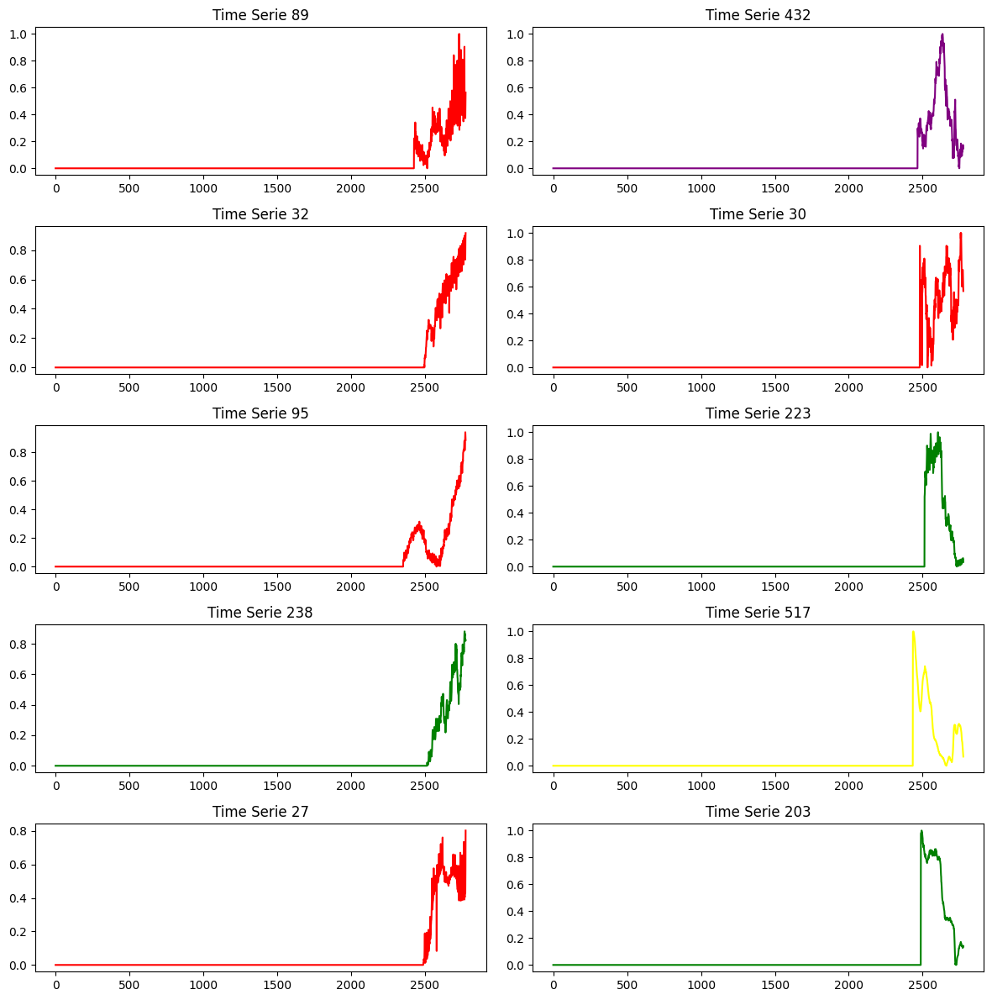

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_raw_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Reducing test series lenght to 218 as standard length for testing.

In [ ]:
test_data = np.zeros((test_size, window))
for i in range(test_size):
  test_data[i] = test_raw_data[i,-window:]

Plotting the reshaped test time series.

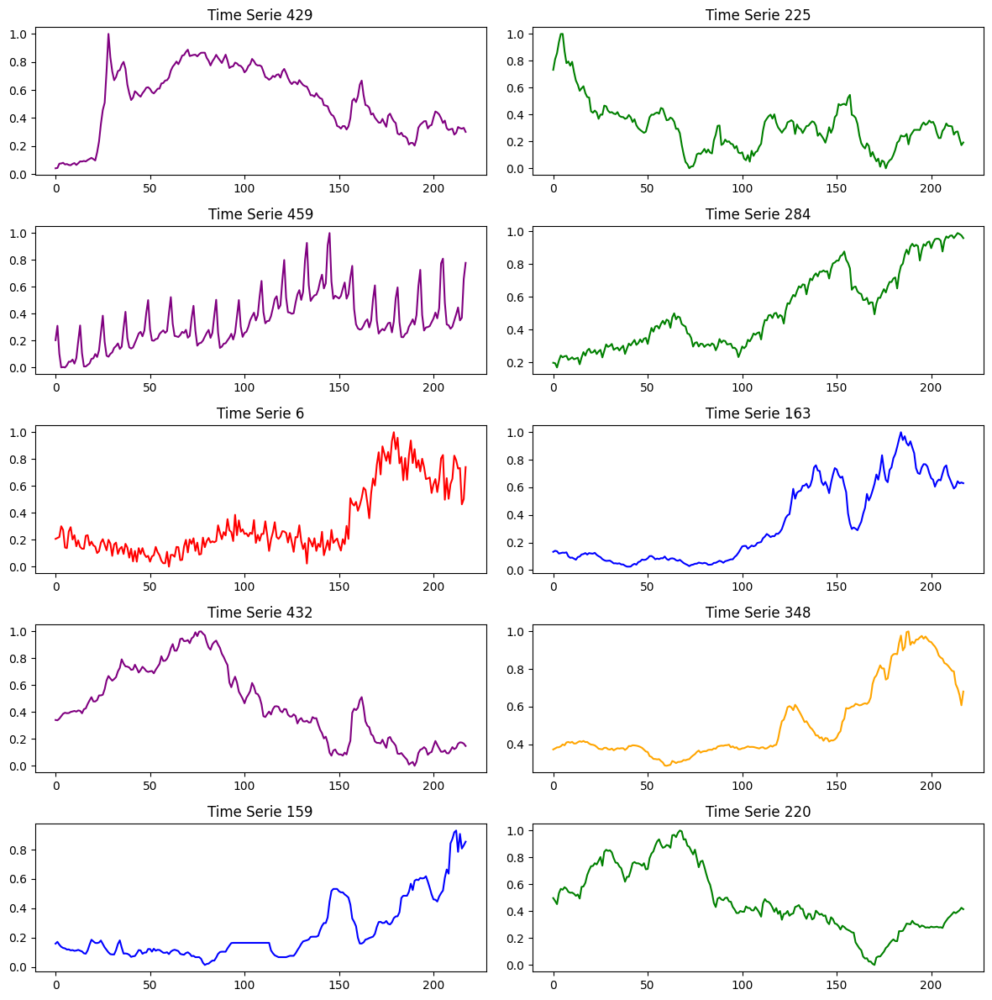

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Split the test and the predictions into 2 numpy arrays.

In [ ]:
x_test = np.zeros((test_size, input_length))
y_test = np.zeros((test_size, prediction_length))
for i in range(test_size):
  x_test[i] = test_data[i, range(0,window)[:input_length]]
  y_test[i] = test_data[i, range(0,window)[-prediction_length:]]

In [ ]:
x_test.shape, y_test.shape

((539, 200), (539, 18))

Plot the test set with predictions in orange (x_test and y_test).

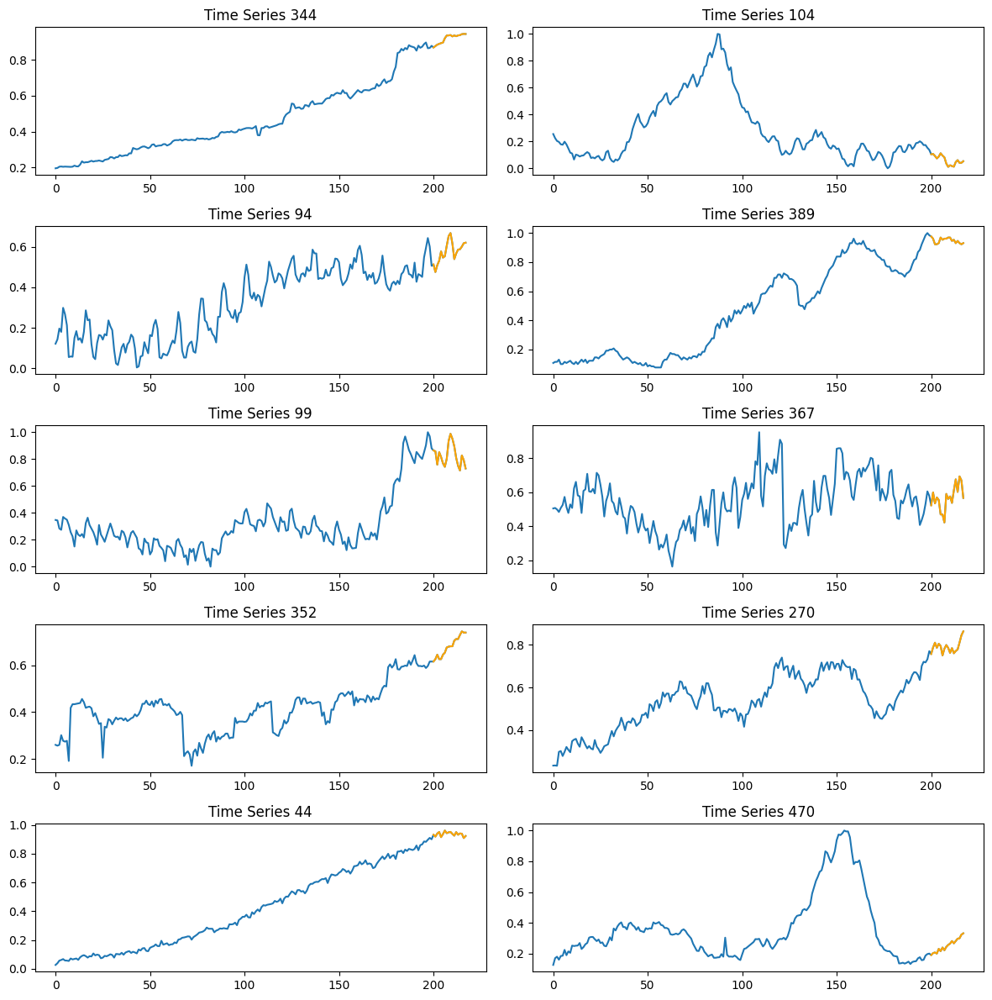

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.full((test_size, 200), np.nan)

random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row, col = divmod(i, 2)
    x_concat = np.concatenate((x_test[row_index], y_test[row_index]))
    y_concat = np.concatenate((empty[row_index], y_test[row_index]))

    axs[row, col].plot(x_concat)
    axs[row, col].plot(y_concat, color='orange')
    axs[row, col].set_title(f'Time Series {row_index}')

plt.tight_layout()
plt.show()

### Training Set

In [ ]:
x_train_data = training_data[~np.isin(np.arange(len(training_data)), test_series_reduced)]
x_train_periods = valid_periods[~np.isin(np.arange(len(training_data)), test_series_reduced)]
x_train_categories = categories[~np.isin(np.arange(len(training_data)), test_series_reduced)]

In [ ]:
short_train_series = []
long_train_series = []

for i,period in enumerate(x_train_periods):
  temp = period[1] - period[0]
  if temp <= window:
    short_train_series.append(i)
  else:
    long_train_series.append(i)


short_samples = len(short_train_series)
long_samples = len(long_train_series)
print("Number of time series shorter than 218 timestamps:", short_samples)
print("Number of time series longer than 218 timestamps:", long_samples)

Number of time series shorter than 218 timestamps: 27888
Number of time series longer than 218 timestamps: 19573


#### Shorter Time Series

In [ ]:
train_short_series = np.zeros((short_samples, window))
for i,j in enumerate(short_train_series):
  train_short_series[i] = x_train_data[j, range(0,max_period)[-window:]]
train_short_categories = x_train_categories[short_train_series]

In [ ]:
train_short_series.shape

(27888, 218)

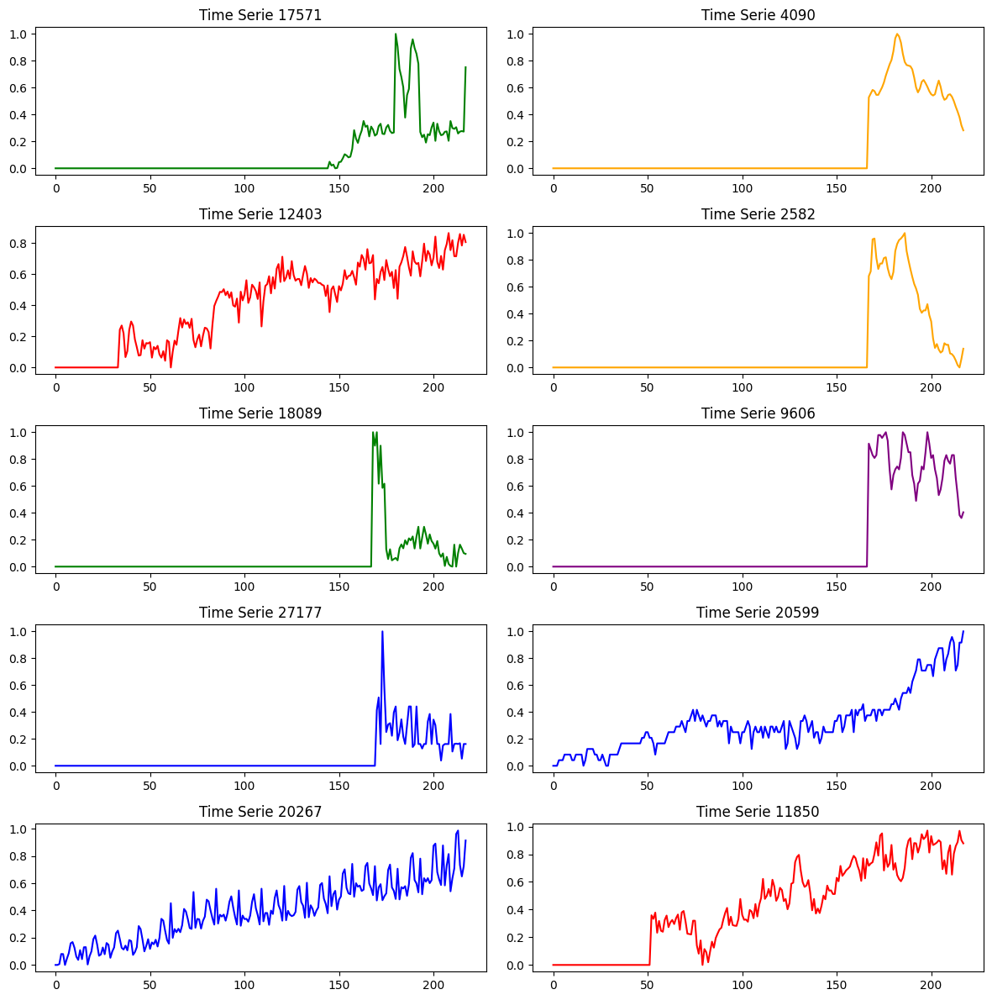

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(short_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_short_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(train_short_series[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

#### Longer Time Series

In [ ]:
counter = 0
for i in long_train_series:
  j = 1
  for j in range(5): # split original time series at most 5 times
    if max_period - x_train_periods[i,0] > window + j * stride:
      counter += 1
    else:
      break
print(counter)

27812


In [ ]:
train_long_series = np.zeros((counter, window))
train_long_categories = np.zeros((counter)).astype('str')

count = 0

for i in long_train_series:
  j = 1
  for j in range(5): # split original time series at most 10 times
    if max_period - x_train_periods[i,0] > window + j * stride:
      train_long_series[count] = x_train_data[i, range(0,max_period - j * stride)[-window:]]
      train_long_categories[count] = x_train_categories[i]
      count += 1
    else:
      break

long_samples = train_long_series.shape[0]
print("Number of time series augmented:", long_samples)

Number of time series augmented: 27812


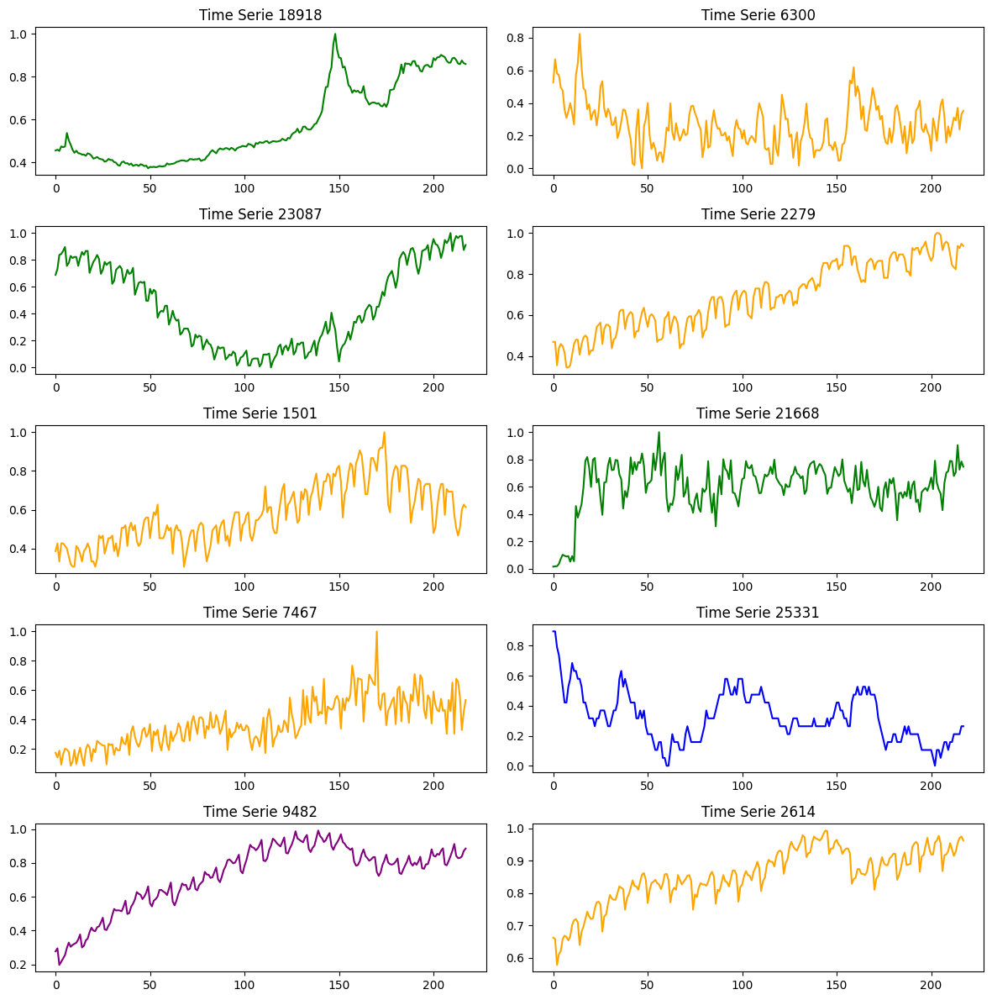

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(long_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_long_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(train_long_series[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

#### Combine in Train Set

In [ ]:
combined_train_data = np.concatenate((train_short_series,train_long_series))
combined_train_categories = np.concatenate((train_short_categories,train_long_categories))

### Train and Validation Split

Split the initial data into training, test and validation sets.

In [ ]:
# Split the data and labels into train and validation sets
train_data, val_data, train_categories, val_categories = train_test_split(combined_train_data, combined_train_categories, test_size=0.15, random_state=42)
train_shape = train_data.shape[0]
test_shape = x_test.shape[0]
val_shape = val_data.shape[0]
print("Shapes:")
print(f" Train: {train_shape} \n Test: {test_shape} \n Validation: {val_shape}")

Shapes:
 Train: 47345 
 Test: 539 
 Validation: 8355


Analyse the distribution of category in the sets.

In [ ]:
# Count the occurrences of the categories
train_category_values, train_category_counts = np.unique(train_categories, return_counts=True)
test_category_values, test_category_counts = np.unique(test_categories, return_counts=True)
val_category_values, val_category_counts = np.unique(val_categories, return_counts=True)

# Print the counts
print("TRAIN:")
for value, count in zip(train_category_values, train_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("\n")
print("VALIDATION:")
for value, count in zip(val_category_values, val_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("\n")
print("TEST:")
for value, count in zip(test_category_values, test_category_counts):
    print(f"Train category: {value}, Count: {count}")

TRAIN:
Train category: A, Count: 6131
Train category: B, Count: 10375
Train category: C, Count: 10471
Train category: D, Count: 10258
Train category: E, Count: 9811
Train category: F, Count: 299


VALIDATION:
Train category: A, Count: 1081
Train category: B, Count: 1797
Train category: C, Count: 1780
Train category: D, Count: 1916
Train category: E, Count: 1720
Train category: F, Count: 61


TEST:
Train category: A, Count: 100
Train category: B, Count: 100
Train category: C, Count: 100
Train category: D, Count: 100
Train category: E, Count: 100
Train category: F, Count: 39


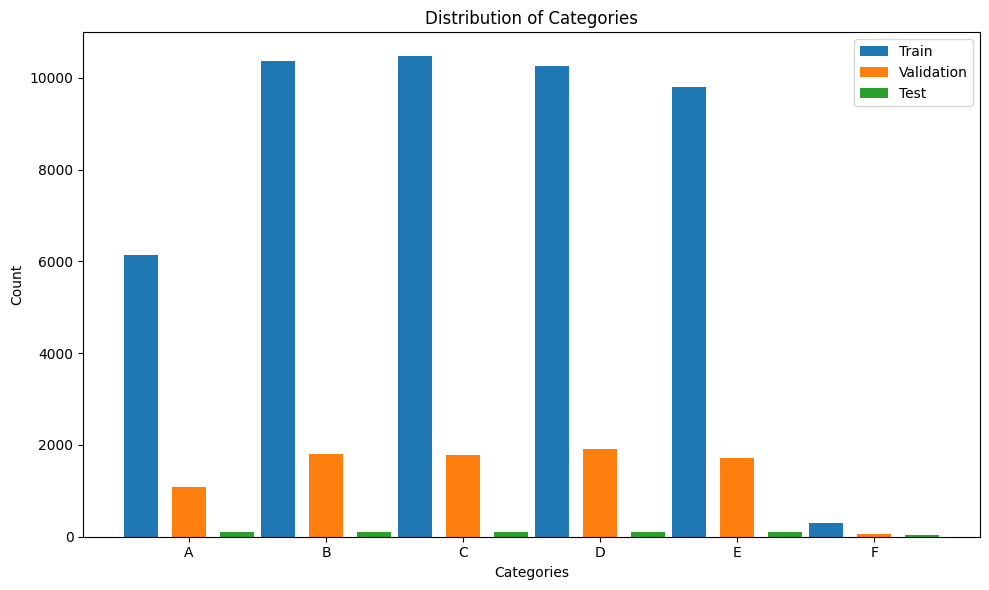

In [ ]:
# Calculate the width and spacing for the bars
bar_width = 0.25
spacing = 0.1

# Calculate the x-axis positions for each category
train_x = np.arange(len(train_category_values))
val_x = train_x + bar_width + spacing
test_x = val_x + bar_width + spacing

# Plot the distribution of categories
plt.figure(figsize=(10, 6))
plt.bar(train_x, train_category_counts, width=bar_width, label='Train')
plt.bar(val_x, val_category_counts, width=bar_width, label='Validation')
plt.bar(test_x, test_category_counts, width=bar_width, label='Test')
plt.xlabel('Categories')
plt.ylabel('Count')
plt.title('Distribution of Categories')
plt.xticks(val_x, train_category_values)  # Set x-axis labels
plt.legend()
plt.tight_layout()  # Adjust spacing between subplots
plt.show()

Categories looks evenly splitted between training, test and validation sets.

#### Split in Prediction and Train/Validation Set

In [ ]:
x_train = np.zeros((train_shape, input_length))
y_train = np.zeros((train_shape, prediction_length))
x_val = np.zeros((val_shape, input_length))
y_val = np.zeros((val_shape, prediction_length))
for i in range(train_shape):
  x_train[i] = train_data[i, range(0,window)[:input_length]]
  y_train[i] = train_data[i, range(0,window)[-prediction_length:]]
for i in range(val_shape):
  x_val[i] = val_data[i, range(0,window)[:input_length]]
  y_val[i] = val_data[i, range(0,window)[-prediction_length:]]

In [ ]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape

((47345, 200), (47345, 18), (8355, 200), (8355, 18))

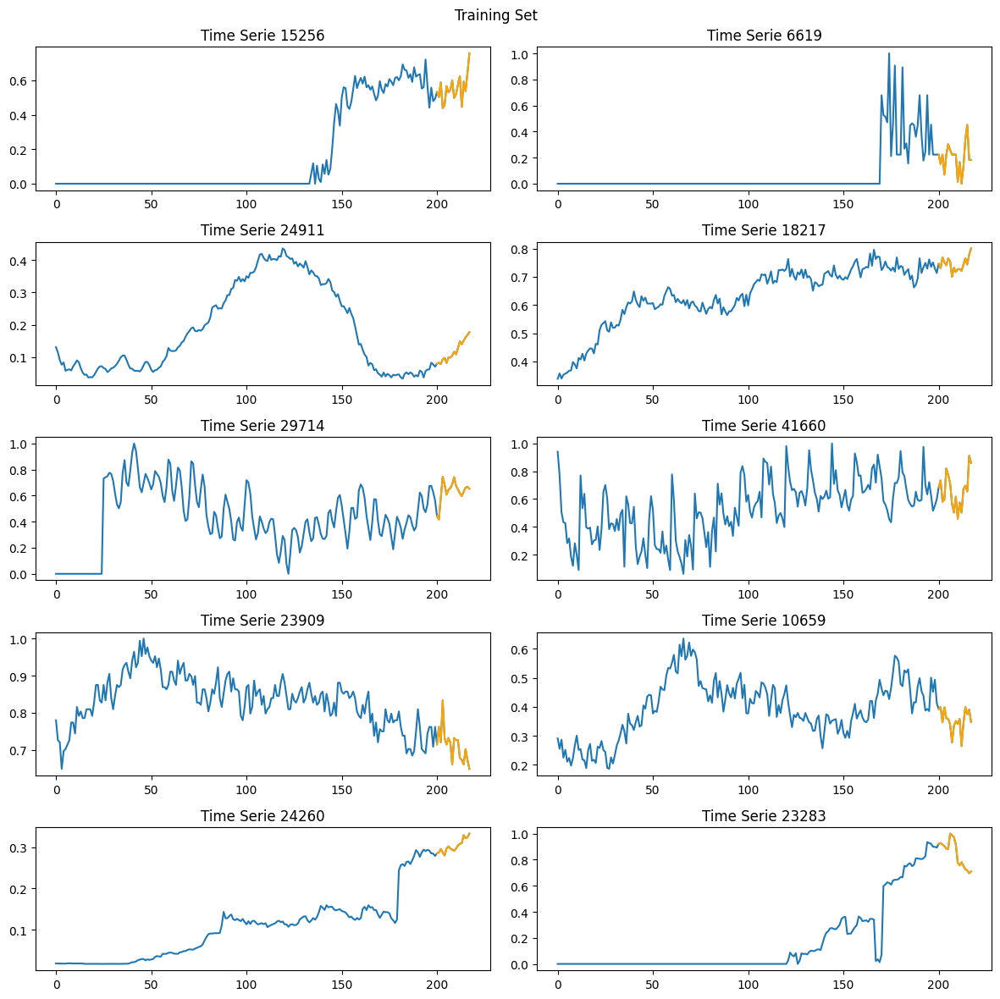

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([train_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(train_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_train[row_index], y_train[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_train[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Training Set")
plt.tight_layout()
plt.show()

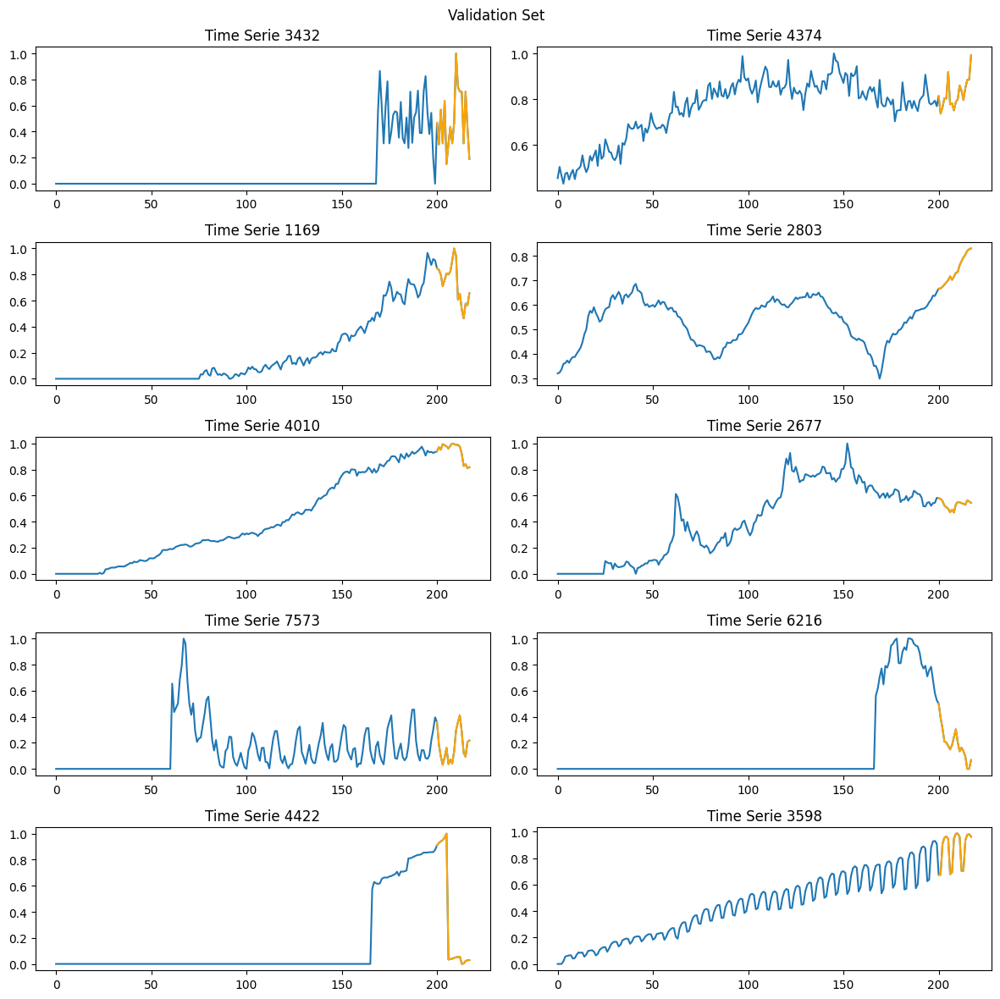

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([val_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(val_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_val[row_index], y_val[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_val[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Validation Set")
plt.tight_layout()
plt.show()

## Save Data

In [ ]:
# Save arrays to file
np.savez(f'Stride_{stride}_Data.npz', x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val, x_test=x_test, y_test=y_test)

# Robust Scaled Data
Another experiment with the training data using Robust Scaler.

We encountered some issues when denormalizing data for submissions so we dropped this.

Parameters of the data (taken from CodaLab).

In [ ]:
window = 200 + 18
stride = int(window / 1)
prediction_length = 18
input_length = 200

In [ ]:
# Get the unique categories
unique_categories = np.unique(categories)
unique_categories

array(['A', 'B', 'C', 'D', 'E', 'F'], dtype='<U1')

## Test Set

The number of time series per category used for testing (except for F category that is underrepresented).

In [ ]:
test_dimension = 100

For testing purpose we preferred to consider only those time series without zero padding, so all those containing more than 218 timestamps.

We also preferred to avoid using too long time series because we are going to amplify the data by using a certain stride and we tought that maybe it will create some correlation with the training data.

So test data contains all those time series that are complete and that are not going to be amplified.

In [ ]:
test_series = []
for i,period in enumerate(valid_periods):
  temp = period[1] - period[0]
  if temp >= window and temp <= window*2:
    test_series.append(i)

test_samples = len(test_series)
print(f"Uncorrelated and complete data are {test_samples} time series")

Uncorrelated and complete data are 18000 time series


In [ ]:
# Initialize an empty list to store the concatenated arrays
test_series_reduced = []

# Iterate over each unique category
for cat in unique_categories:
    # Get the indices where the category matches in the 'test_series' array
    indices = np.where(cat == categories[test_series])[0][:test_dimension].astype(int)

    # Append the obtained array to the 'concatenated_array'
    test_series_reduced.extend(indices)

# Convert the list to a numpy array if needed
test_series_reduced = np.array(test_series_reduced)

In [ ]:
# Access values from test_series at indices in test_series_reduced
selected_test_series = np.array([test_series[index] for index in test_series_reduced])

In [ ]:
test_size = selected_test_series.shape[0]
print(test_size)

539


We obtained 539 test time series (100 per each category from A to E and 39 for category F).

In [ ]:
test_raw_data = training_data[selected_test_series]
test_periods = valid_periods[selected_test_series]
test_categories = categories[selected_test_series]

In [ ]:
test_raw_data.shape

(539, 2776)

Generated 539 time series for testing purpose (over the initial 48000).

Plotting these test time series.

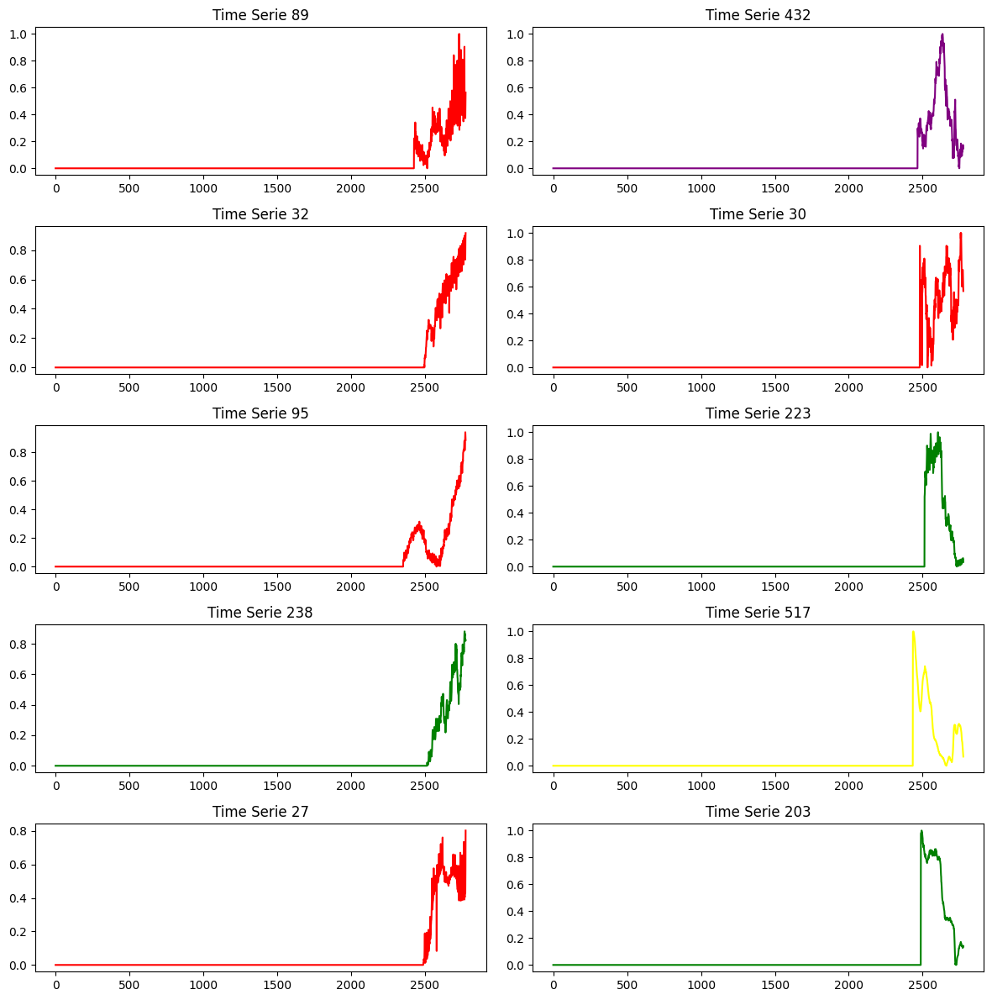

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_raw_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Reducing test series lenght to 218 as standard length for testing.

In [ ]:
test_data = np.zeros((test_size, window))
for i in range(test_size):
  test_data[i] = test_raw_data[i,-window:]

Plotting the reshaped test time series.

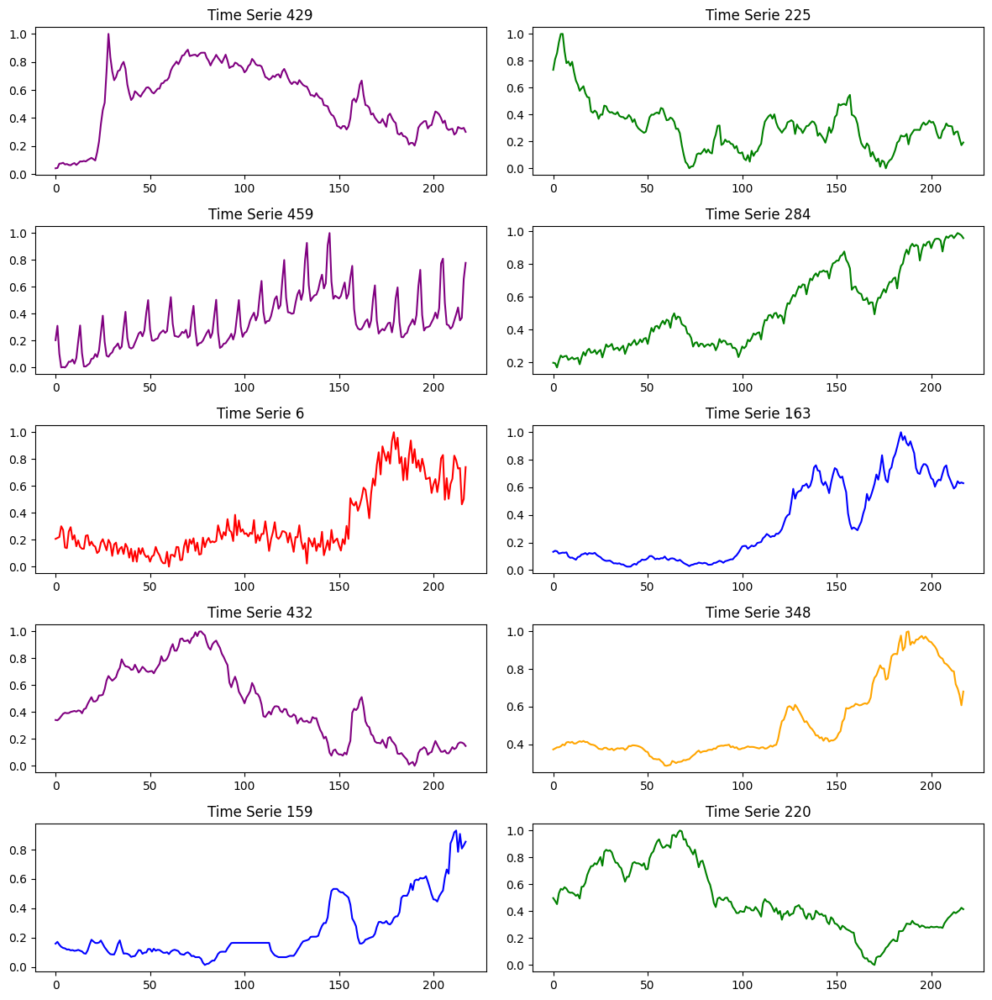

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Split the test and the predictions into 2 numpy arrays.

In [ ]:
x_test = np.zeros((test_size, input_length))
y_test = np.zeros((test_size, prediction_length))
for i in range(test_size):
  x_test[i] = test_data[i, range(0,window)[:input_length]]
  y_test[i] = test_data[i, range(0,window)[-prediction_length:]]

In [ ]:
x_test.shape, y_test.shape

((539, 200), (539, 18))

Plot the test set with predictions in orange (x_test and y_test).

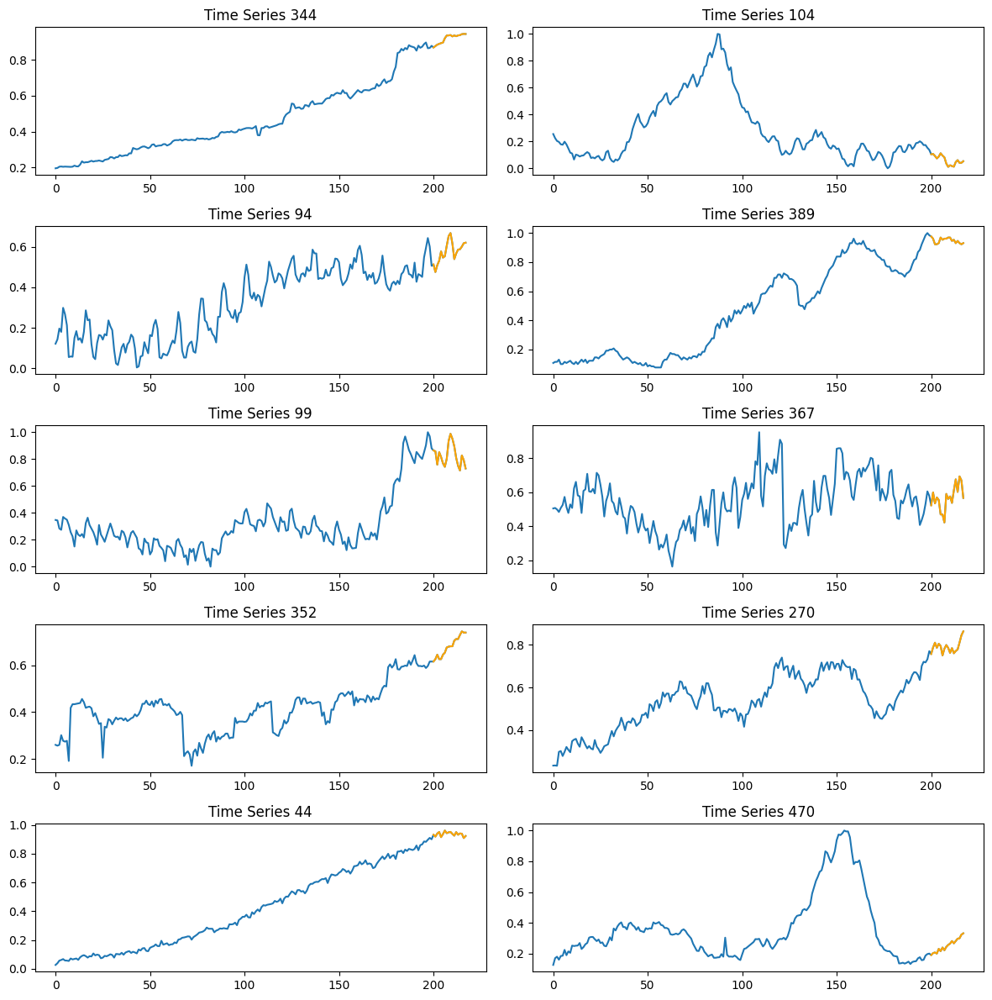

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.full((test_size, 200), np.nan)

random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row, col = divmod(i, 2)
    x_concat = np.concatenate((x_test[row_index], y_test[row_index]))
    y_concat = np.concatenate((empty[row_index], y_test[row_index]))

    axs[row, col].plot(x_concat)
    axs[row, col].plot(y_concat, color='orange')
    axs[row, col].set_title(f'Time Series {row_index}')

plt.tight_layout()
plt.show()

## Data Normalization

Looking for the maximum and minimum value in the training data in order to decide wheter or not normalization is required.

In [ ]:
print("Maximum value in the training data:", np.max(training_data))
print("Minimum value in the training data:", np.min(training_data))

Maximum value in the training data: 1.0
Minimum value in the training data: 0.0


Data is already normalized so we don't need to go any further with normalization, but it may be possible that trying other ways of normalizing improves performances of our models.

Normalize data with a robust scaler.

In [ ]:
# Apply robust scaling
robust_scaler = RobustScaler()
training_data = robust_scaler.fit_transform(training_data)

In [ ]:
print("Maximum value in the training data:", np.max(training_data))
print("Minimum value in the training data:", np.min(training_data))

Maximum value in the training data: 49.925774
Minimum value in the training data: -1.37263


## Training Set

In [ ]:
x_train_data = training_data[~np.isin(np.arange(len(training_data)), test_series_reduced)]
x_train_periods = valid_periods[~np.isin(np.arange(len(training_data)), test_series_reduced)]
x_train_categories = categories[~np.isin(np.arange(len(training_data)), test_series_reduced)]

In [ ]:
short_train_series = []
long_train_series = []

for i,period in enumerate(x_train_periods):
  temp = period[1] - period[0]
  if temp <= window:
    short_train_series.append(i)
  else:
    long_train_series.append(i)


short_samples = len(short_train_series)
long_samples = len(long_train_series)
print("Number of time series shorter than 218 timestamps:", short_samples)
print("Number of time series longer than 218 timestamps:", long_samples)

Number of time series shorter than 218 timestamps: 27888
Number of time series longer than 218 timestamps: 19573


#### Shorter Time Series

In [ ]:
train_short_series = np.zeros((short_samples, window))
for i,j in enumerate(short_train_series):
  train_short_series[i] = x_train_data[j, range(0,max_period)[-window:]]
train_short_categories = x_train_categories[short_train_series]

In [ ]:
train_short_series.shape

(27888, 218)

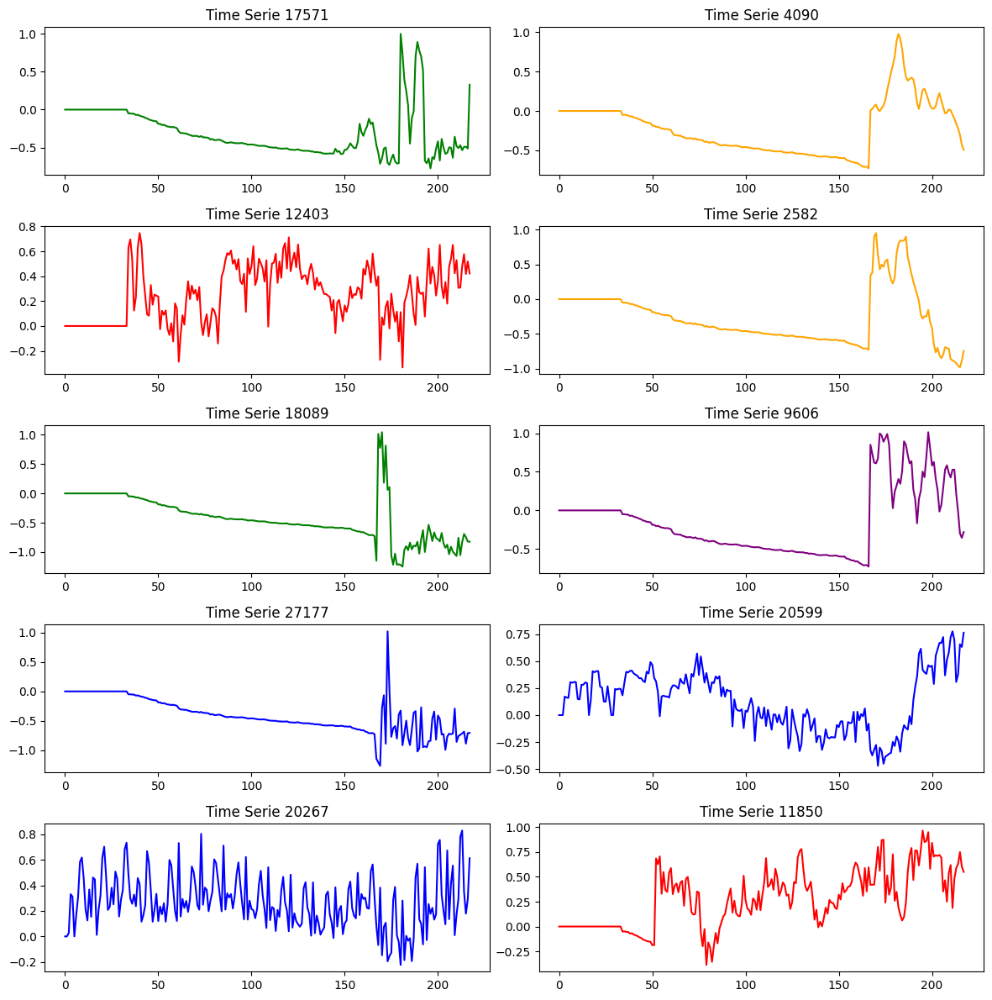

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(short_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_short_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(train_short_series[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

#### Longer Time Series

In [ ]:
counter = 0
for i in long_train_series:
  j = 1
  for j in range(5): # split original time series at most 5 times
    if max_period - x_train_periods[i,0] > window + j * stride:
      counter += 1
    else:
      break
print(counter)

21943


In [ ]:
train_long_series = np.zeros((counter, window))
train_long_categories = np.zeros((counter)).astype('str')

count = 0

for i in long_train_series:
  j = 1
  for j in range(5): # split original time series at most 10 times
    if max_period - x_train_periods[i,0] > window + j * stride:
      train_long_series[count] = x_train_data[i, range(0,max_period - j * stride)[-window:]]
      train_long_categories[count] = x_train_categories[i]
      count += 1
    else:
      break

long_samples = train_long_series.shape[0]
print("Number of time series augmented:", long_samples)

Number of time series augmented: 21943


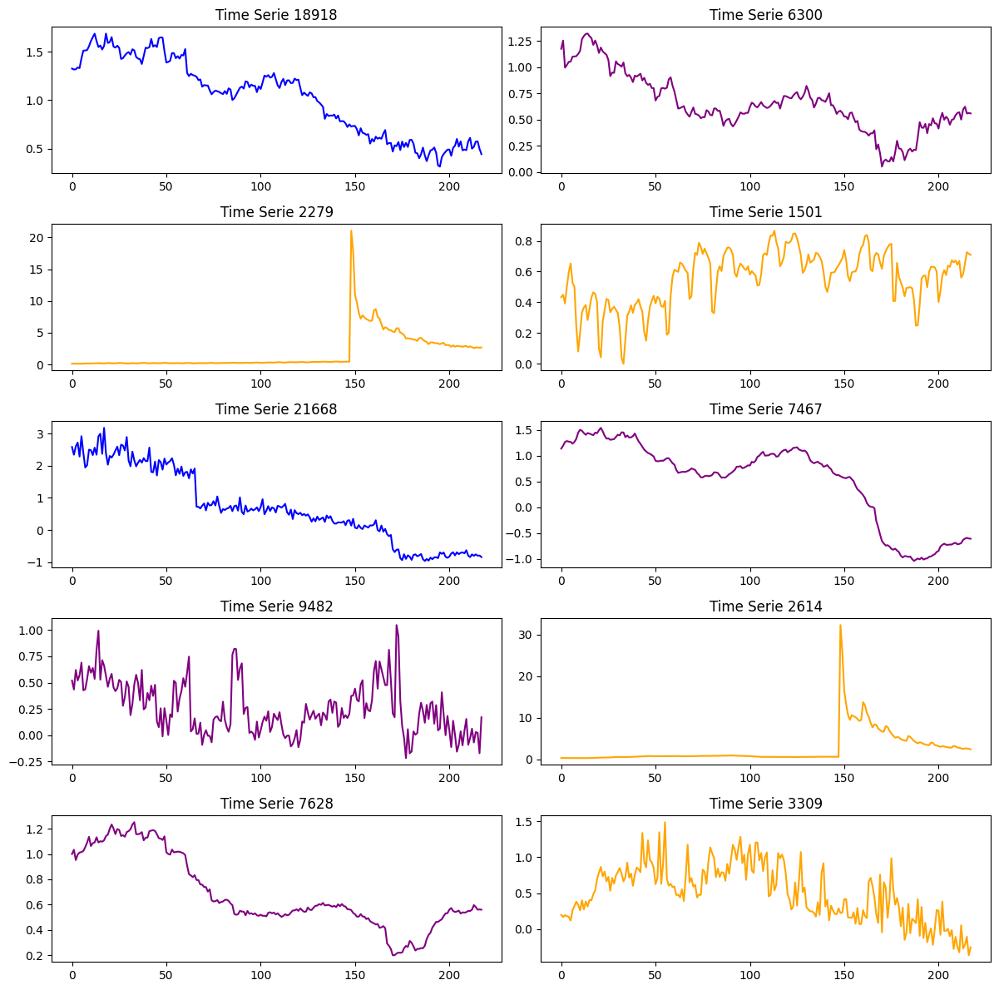

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(long_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_long_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(train_long_series[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

#### Combine in Train Set

In [ ]:
combined_train_data = np.concatenate((train_short_series,train_long_series))
combined_train_categories = np.concatenate((train_short_categories,train_long_categories))

## Train and Validation Split

Split the initial data into training, test and validation sets.

In [ ]:
# Split the data and labels into train and validation sets
train_data, val_data, train_categories, val_categories = train_test_split(combined_train_data, combined_train_categories, test_size=0.15, random_state=42)
train_shape = train_data.shape[0]
test_shape = x_test.shape[0]
val_shape = val_data.shape[0]
print("Shapes:")
print(f" Train: {train_shape} \n Test: {test_shape} \n Validation: {val_shape}")

Shapes:
 Train: 42356 
 Test: 539 
 Validation: 7475


Analyse the distribution of category in the sets.

In [ ]:
# Count the occurrences of the categories
train_category_values, train_category_counts = np.unique(train_categories, return_counts=True)
test_category_values, test_category_counts = np.unique(test_categories, return_counts=True)
val_category_values, val_category_counts = np.unique(val_categories, return_counts=True)

# Print the counts
print("TRAIN:")
for value, count in zip(train_category_values, train_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("\n")
print("VALIDATION:")
for value, count in zip(val_category_values, val_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("\n")
print("TEST:")
for value, count in zip(test_category_values, test_category_counts):
    print(f"Train category: {value}, Count: {count}")

TRAIN:
Train category: A, Count: 5066
Train category: B, Count: 9701
Train category: C, Count: 9127
Train category: D, Count: 8793
Train category: E, Count: 9408
Train category: F, Count: 261


VALIDATION:
Train category: A, Count: 898
Train category: B, Count: 1680
Train category: C, Count: 1696
Train category: D, Count: 1568
Train category: E, Count: 1584
Train category: F, Count: 49


TEST:
Train category: A, Count: 100
Train category: B, Count: 100
Train category: C, Count: 100
Train category: D, Count: 100
Train category: E, Count: 100
Train category: F, Count: 39


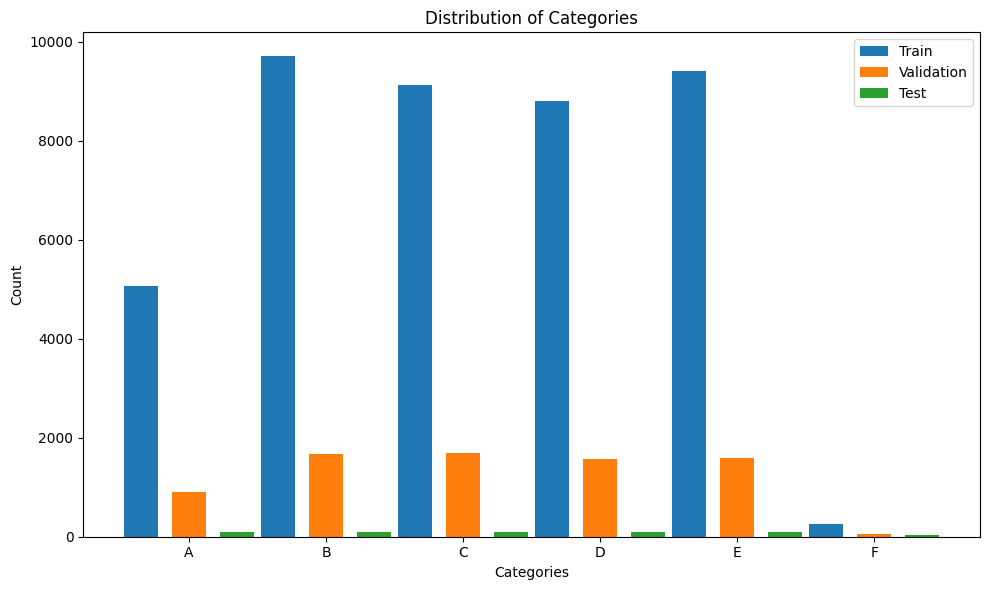

In [ ]:
# Calculate the width and spacing for the bars
bar_width = 0.25
spacing = 0.1

# Calculate the x-axis positions for each category
train_x = np.arange(len(train_category_values))
val_x = train_x + bar_width + spacing
test_x = val_x + bar_width + spacing

# Plot the distribution of categories
plt.figure(figsize=(10, 6))
plt.bar(train_x, train_category_counts, width=bar_width, label='Train')
plt.bar(val_x, val_category_counts, width=bar_width, label='Validation')
plt.bar(test_x, test_category_counts, width=bar_width, label='Test')
plt.xlabel('Categories')
plt.ylabel('Count')
plt.title('Distribution of Categories')
plt.xticks(val_x, train_category_values)  # Set x-axis labels
plt.legend()
plt.tight_layout()  # Adjust spacing between subplots
plt.show()

Categories looks evenly splitted between training, test and validation sets.

#### Split in Prediction and Train/Validation Set

In [ ]:
x_train = np.zeros((train_shape, input_length))
y_train = np.zeros((train_shape, prediction_length))
x_val = np.zeros((val_shape, input_length))
y_val = np.zeros((val_shape, prediction_length))
for i in range(train_shape):
  x_train[i] = train_data[i, range(0,window)[:input_length]]
  y_train[i] = train_data[i, range(0,window)[-prediction_length:]]
for i in range(val_shape):
  x_val[i] = val_data[i, range(0,window)[:input_length]]
  y_val[i] = val_data[i, range(0,window)[-prediction_length:]]

In [ ]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape

((42356, 200), (42356, 18), (7475, 200), (7475, 18))

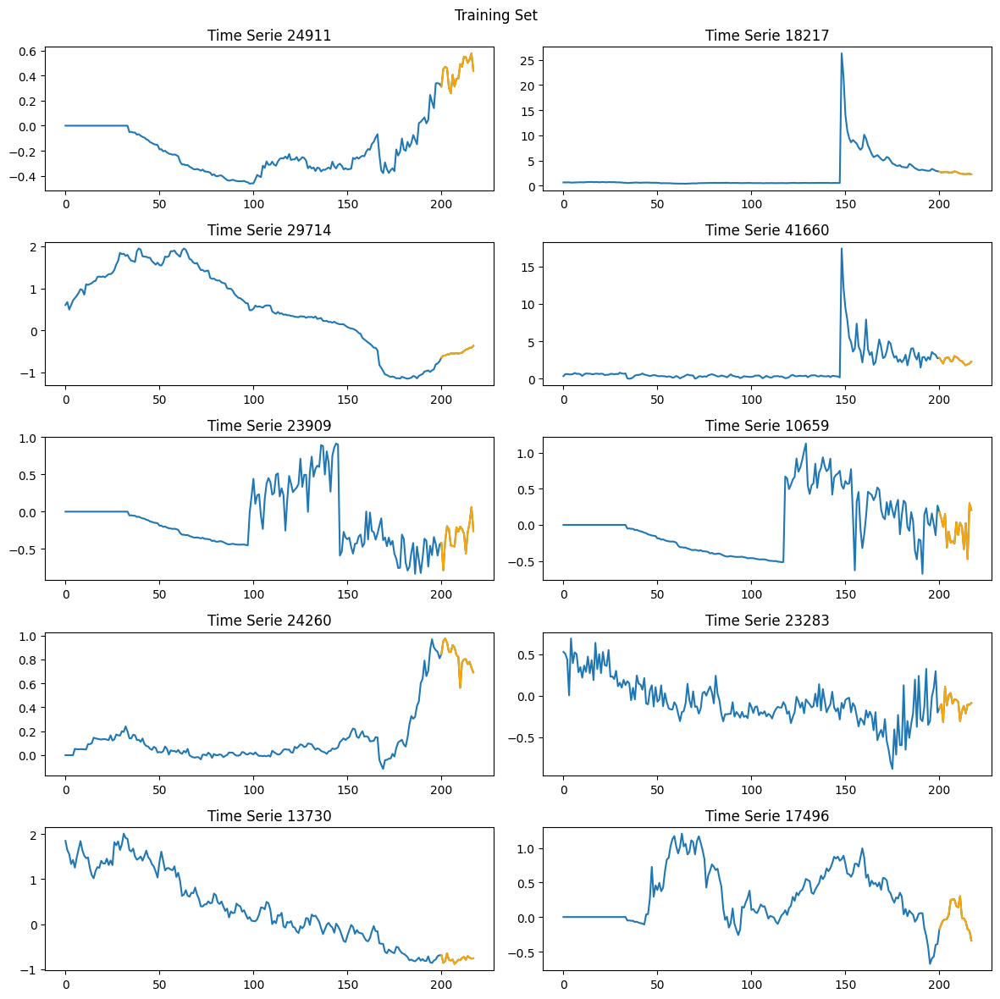

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([train_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(train_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_train[row_index], y_train[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_train[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Training Set")
plt.tight_layout()
plt.show()

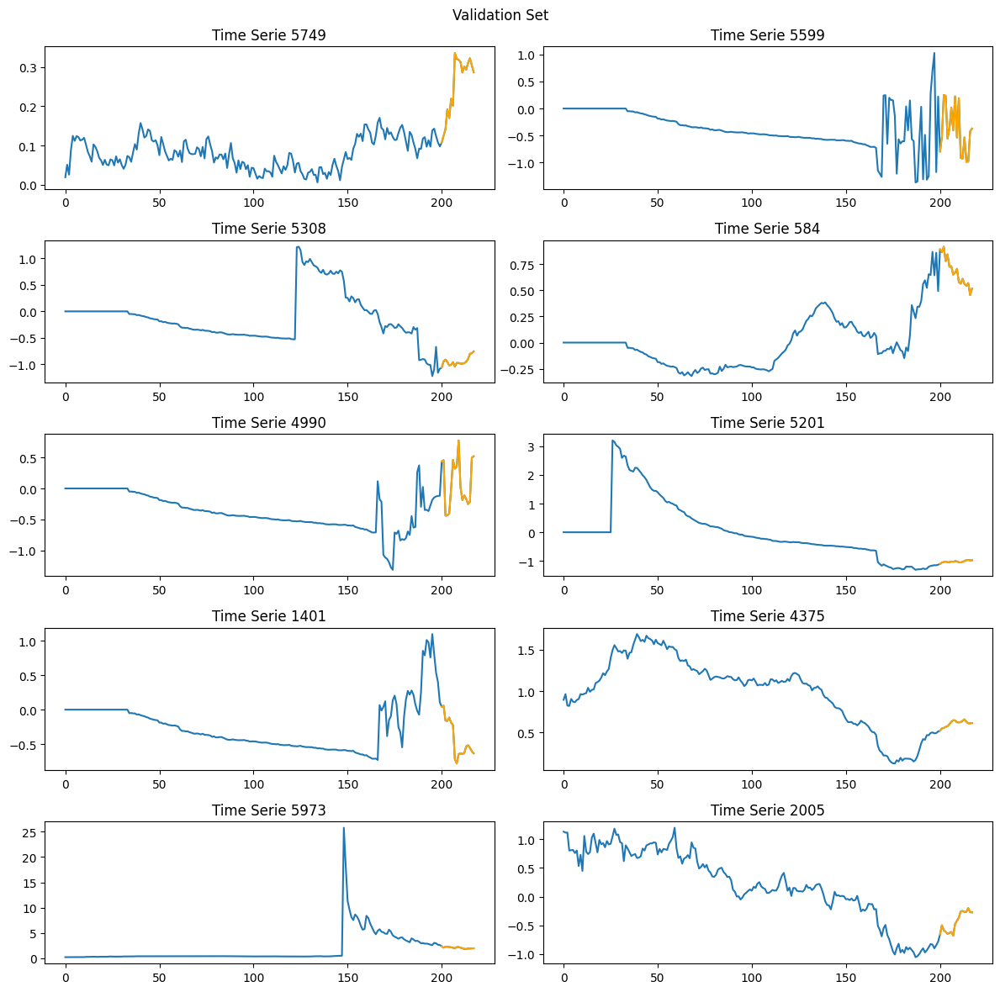

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([val_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(val_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_val[row_index], y_val[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_val[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Validation Set")
plt.tight_layout()
plt.show()

## Save Data

In [ ]:
# Save arrays to file
np.savez(f'Stride_{stride}_NORM_Data.npz', x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val, x_test=x_test, y_test=y_test)

# Final Training Data

We removed short sequences (all those sequences shorter than 218 (200 for x_test and 18 for predictions)) and amplified sequences with stride 218 till the end of the valid period, in order to remove completely the zero paddings.

## Remove Short Time Series

In [ ]:
standard_length = 200 + 18

In [ ]:
short_indexes = []
long_indexes = []

for i,period in enumerate(valid_periods):
  temp = period[1] - period[0]
  if temp <= standard_length:
    short_indexes.append(i)
  else:
    long_indexes.append(i)


short_samples = len(short_indexes)
long_samples = len(long_indexes)
print("Number of time series shorter than 218 timestamps:", short_samples)
print("Number of time series longer than 218 timestamps:", long_samples)

Number of time series shorter than 218 timestamps: 28198
Number of time series longer than 218 timestamps: 19802


In [ ]:
short_series = np.zeros((short_samples, standard_length))
for i,j in enumerate(short_indexes):
  short_series[i] = training_data[j, range(0,max_period)[-standard_length:]]
train_categories = categories[short_indexes]

In [ ]:
short_series.shape

(28198, 218)

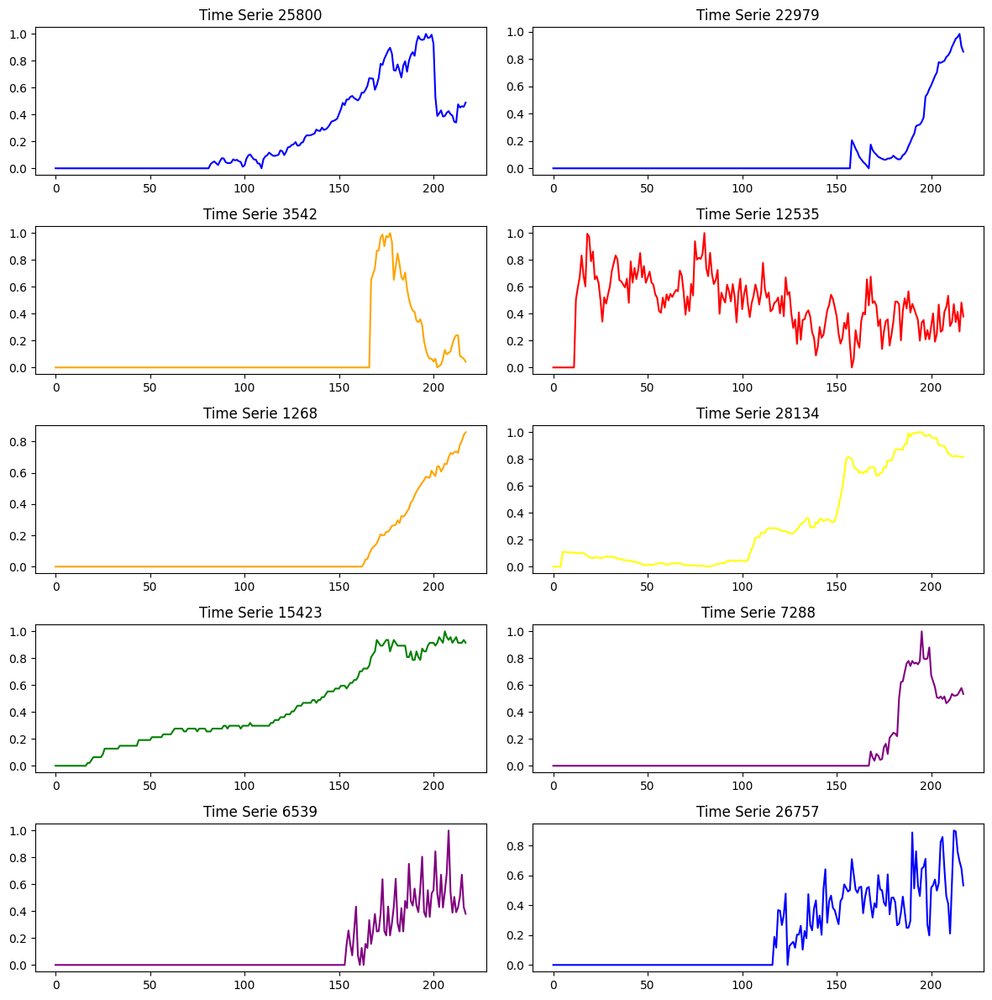

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(short_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(short_series[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

In [ ]:
initial_dim = len(training_data)
training_data = training_data[~np.isin(np.arange(initial_dim), short_indexes)]
valid_periods = valid_periods[~np.isin(np.arange(initial_dim), short_indexes)]
categories = categories[~np.isin(np.arange(initial_dim), short_indexes)]

## Split Data

In [ ]:
window = 200 + 18
stride = int(window / 1)
prediction_length = 18
input_length = 200

In [ ]:
# Get the unique categories
unique_categories = np.unique(categories)
unique_categories

array(['A', 'B', 'C', 'D', 'E', 'F'], dtype='<U1')

### Test Set

The number of time series per category used for testing (except for F category that is underrepresented).

In [ ]:
test_dimension = 100

For testing purpose we preferred to consider only those time series without zero padding, so all those containing more than 218 timestamps.

We also preferred to avoid using too long time series because we are going to amplify the data by using a certain stride and we tought that maybe it will create some correlation with the training data.

So test data contains all those time series that are complete and that are not going to be amplified.

In [ ]:
test_series = []
for i,period in enumerate(valid_periods):
  temp = period[1] - period[0]
  if temp >= window and temp <= window*2:
    test_series.append(i)

test_samples = len(test_series)
print(f"Uncorrelated and complete data are {test_samples} time series")

Uncorrelated and complete data are 17976 time series


In [ ]:
# Initialize an empty list to store the concatenated arrays
test_series_reduced = []

# Iterate over each unique category
for cat in unique_categories:
    # Get the indices where the category matches in the 'test_series' array
    indices = np.where(cat == categories[test_series])[0][:test_dimension].astype(int)

    # Append the obtained array to the 'concatenated_array'
    test_series_reduced.extend(indices)

# Convert the list to a numpy array if needed
test_series_reduced = np.array(test_series_reduced)

In [ ]:
# Access values from test_series at indices in test_series_reduced
selected_test_series = np.array([test_series[index] for index in test_series_reduced])

In [ ]:
test_size = selected_test_series.shape[0]
print(test_size)

539


We obtained 539 test time series (100 per each category from A to E and 39 for category F).

In [ ]:
test_raw_data = training_data[selected_test_series]
test_periods = valid_periods[selected_test_series]
test_categories = categories[selected_test_series]

In [ ]:
test_raw_data.shape

(539, 2776)

Generated 539 time series for testing purpose (over the initial 48000).

Plotting these test time series.

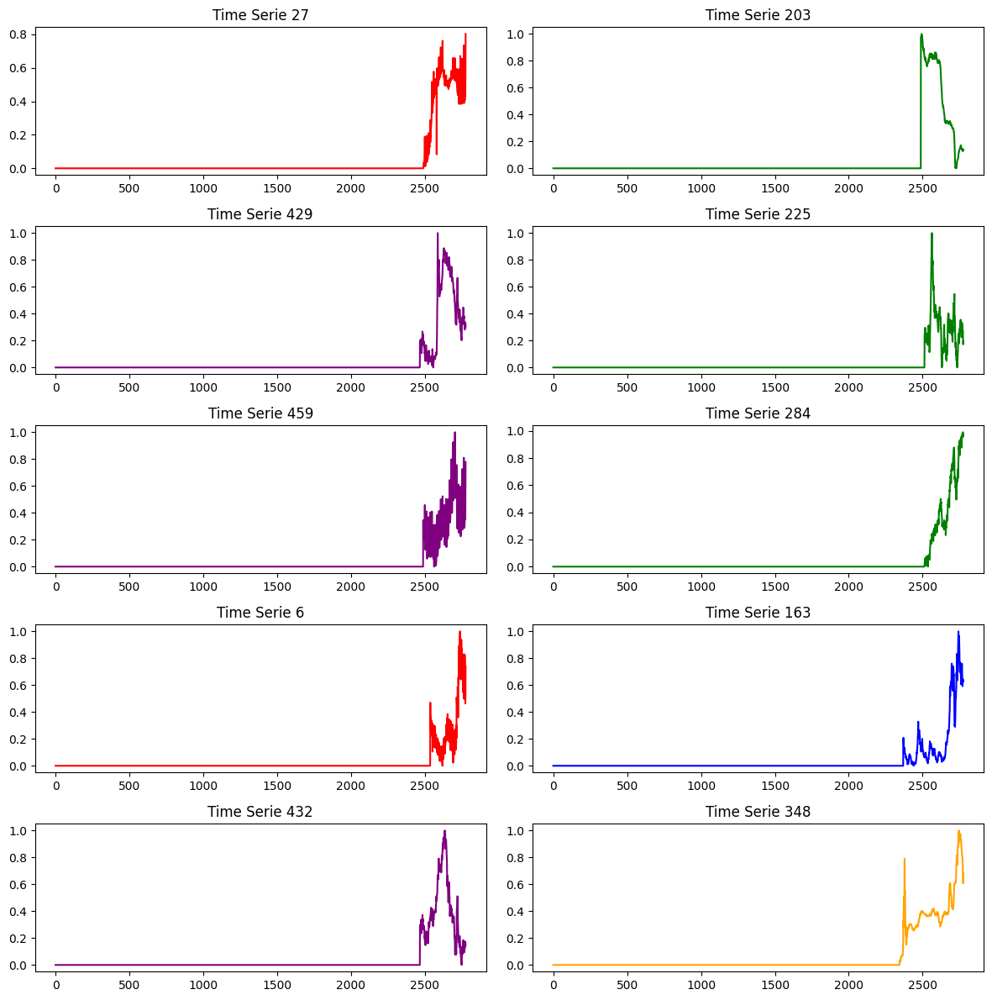

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_raw_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Reducing test series lenght to 218 as standard length for testing.

In [ ]:
test_data = np.zeros((test_size, window))
for i in range(test_size):
  test_data[i] = test_raw_data[i,-window:]

Plotting the reshaped test time series.

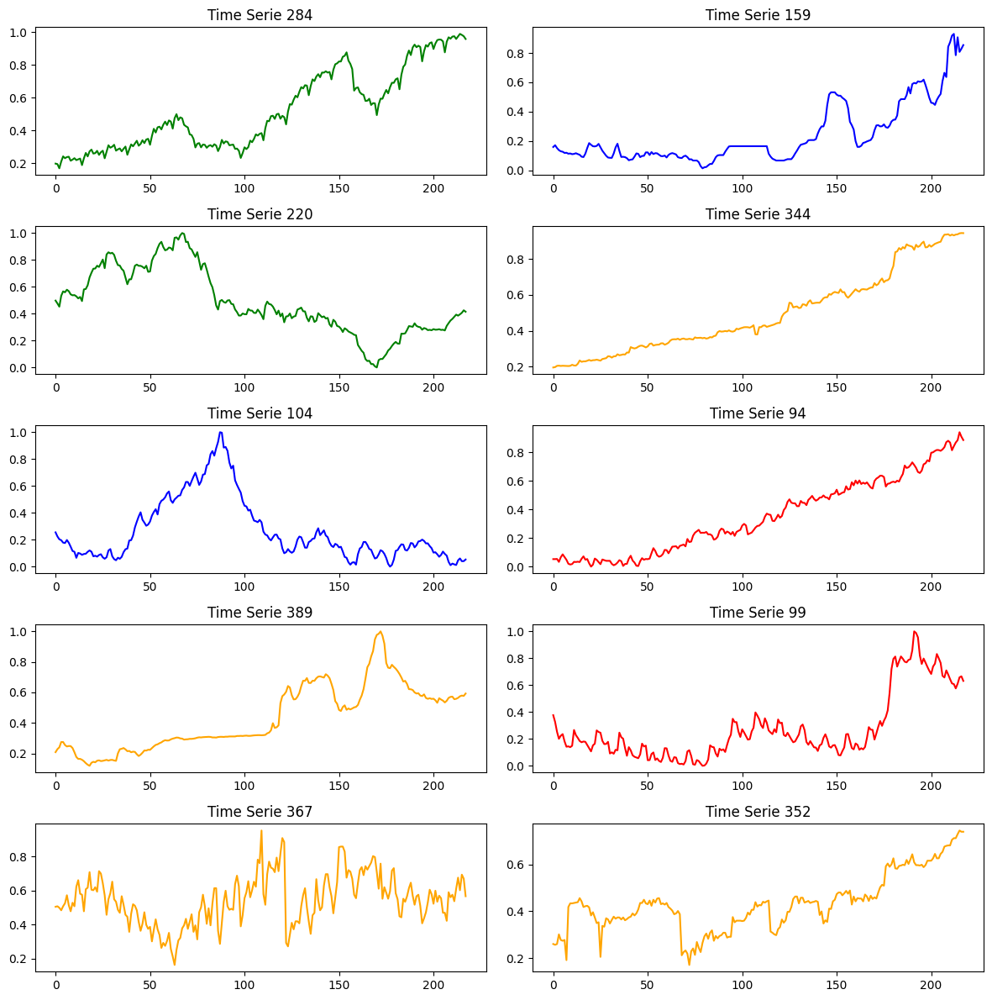

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Split the test and the predictions into 2 numpy arrays.

In [ ]:
x_test = np.zeros((test_size, input_length))
y_test = np.zeros((test_size, prediction_length))
for i in range(test_size):
  x_test[i] = test_data[i, range(0,window)[:input_length]]
  y_test[i] = test_data[i, range(0,window)[-prediction_length:]]

In [ ]:
x_test.shape, y_test.shape

((539, 200), (539, 18))

Plot the test set with predictions in orange (x_test and y_test).

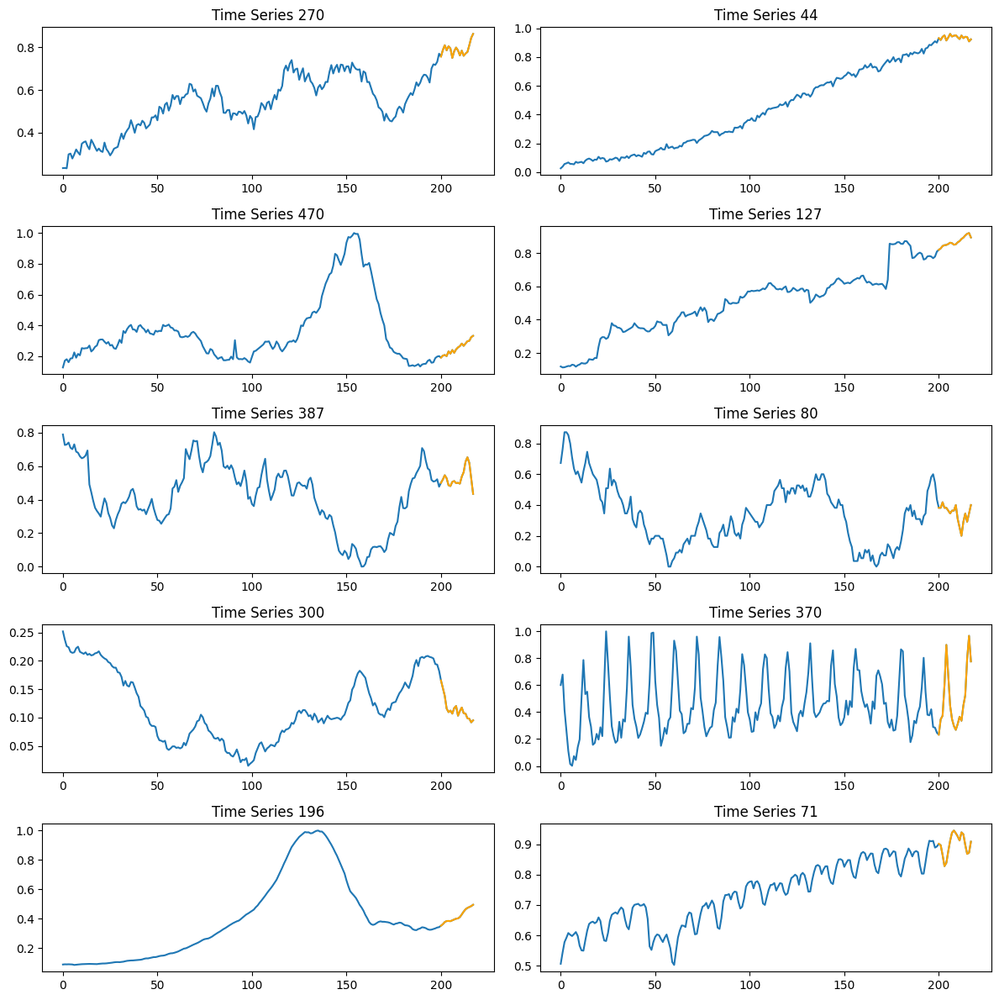

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.full((test_size, 200), np.nan)

random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row, col = divmod(i, 2)
    x_concat = np.concatenate((x_test[row_index], y_test[row_index]))
    y_concat = np.concatenate((empty[row_index], y_test[row_index]))

    axs[row, col].plot(x_concat)
    axs[row, col].plot(y_concat, color='orange')
    axs[row, col].set_title(f'Time Series {row_index}')

plt.tight_layout()
plt.show()

### Training Set

In [ ]:
x_train_data = training_data[~np.isin(np.arange(len(training_data)), test_series_reduced)]
x_train_periods = valid_periods[~np.isin(np.arange(len(training_data)), test_series_reduced)]
x_train_categories = categories[~np.isin(np.arange(len(training_data)), test_series_reduced)]

In [ ]:
short_train_series = []
long_train_series = []

for i,period in enumerate(x_train_periods):
  temp = period[1] - period[0]
  if temp <= standard_length:
    short_train_series.append(i)
  else:
    long_train_series.append(i)


short_samples = len(short_train_series)
long_samples = len(long_train_series)
print("Number of time series shorter than 218 timestamps:", short_samples)
print("Number of time series longer than 218 timestamps:", long_samples)

Number of time series shorter than 218 timestamps: 0
Number of time series longer than 218 timestamps: 19263


#### Shorter Time Series

In [ ]:
train_short_series = np.zeros((short_samples, standard_length))
for i,j in enumerate(short_train_series):
  train_short_series[i] = x_train_data[j, range(0,max_period)[-standard_length:]]
train_short_categories = x_train_categories[short_train_series]

In [ ]:
train_short_series.shape[0]

0

All short series have been removed.

#### Longer Time Series

In [ ]:
stride = 218

In [ ]:
counter = 0
for i in long_train_series:
  j = 1
  for j in range(max_period):
    if x_train_periods[i][0] < max_period - standard_length - j * stride:
      counter += 1
    else:
      break
print(counter)

21610


In [ ]:
train_long_series = np.zeros((counter, standard_length))
train_long_categories = np.zeros((counter)).astype('str')

count = 0

for i in long_train_series:
  j = 1
  for j in range(max_period):
    if x_train_periods[i][0] < max_period - standard_length - j * stride:
      train_long_series[count] = x_train_data[i, range(0,max_period - j * stride)[-standard_length:]]
      train_long_categories[count] = x_train_categories[i]
      count += 1
    else:
      break

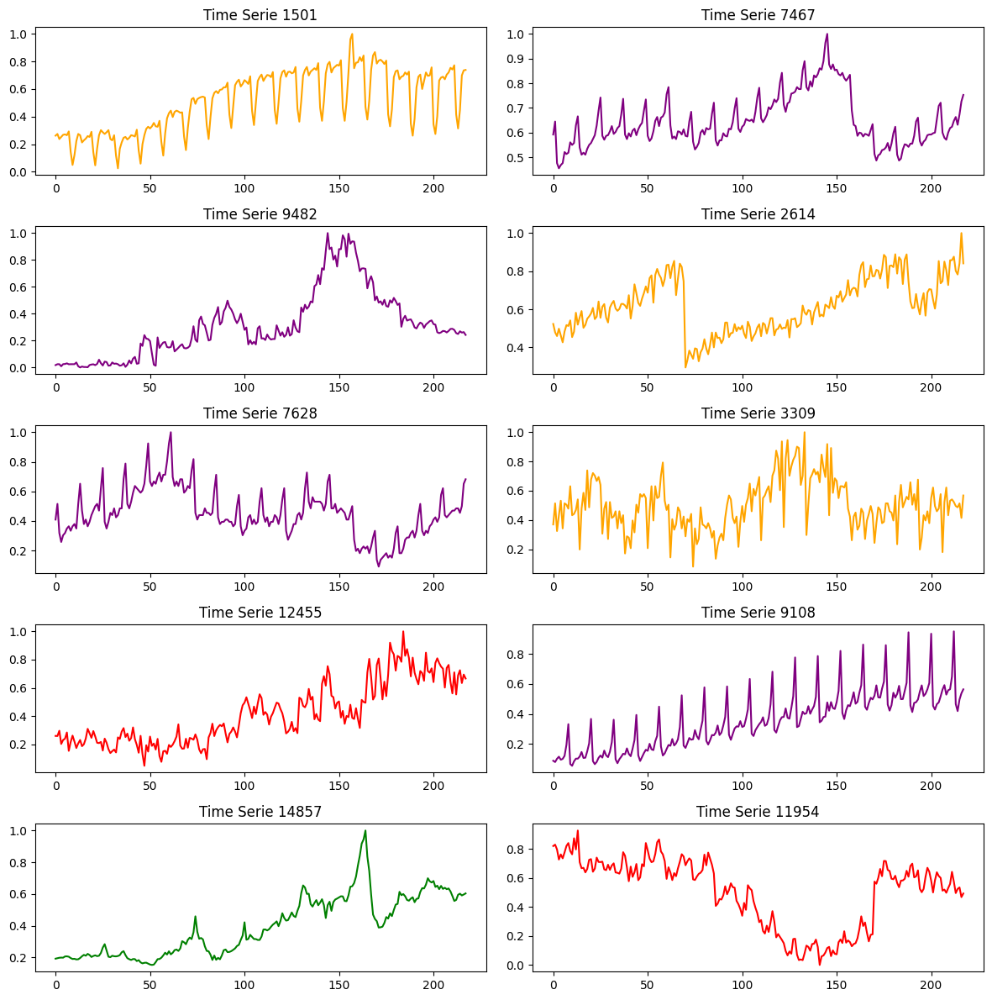

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(long_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_long_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(train_long_series[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

### Train and Validation Split

Split the initial data into training, test and validation sets.

In [ ]:
# Split the data and labels into train and validation sets
train_data, val_data, train_categories, val_categories = train_test_split(train_long_series, train_long_categories, test_size=0.15, random_state=42)
train_shape = train_data.shape[0]
test_shape = x_test.shape[0]
val_shape = val_data.shape[0]
print("Shapes:")
print(f" Train: {train_shape} \n Test: {test_shape} \n Validation: {val_shape}")

Shapes:
 Train: 18368 
 Test: 539 
 Validation: 3242


Analyse the distribution of category in the sets.

In [ ]:
# Count the occurrences of the categories
train_category_values, train_category_counts = np.unique(train_categories, return_counts=True)
test_category_values, test_category_counts = np.unique(test_categories, return_counts=True)
val_category_values, val_category_counts = np.unique(val_categories, return_counts=True)

# Print the counts
print("TRAIN:")
for value, count in zip(train_category_values, train_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("VALIDATION:")
for value, count in zip(val_category_values, val_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("TEST:")
for value, count in zip(test_category_values, test_category_counts):
    print(f"Train category: {value}, Count: {count}")

TRAIN:
Train category: A, Count: 3363
Train category: B, Count: 2710
Train category: C, Count: 3684
Train category: D, Count: 4912
Train category: E, Count: 3617
Train category: F, Count: 82
VALIDATION:
Train category: A, Count: 606
Train category: B, Count: 469
Train category: C, Count: 676
Train category: D, Count: 843
Train category: E, Count: 632
Train category: F, Count: 16
TEST:
Train category: A, Count: 100
Train category: B, Count: 100
Train category: C, Count: 100
Train category: D, Count: 100
Train category: E, Count: 100
Train category: F, Count: 39


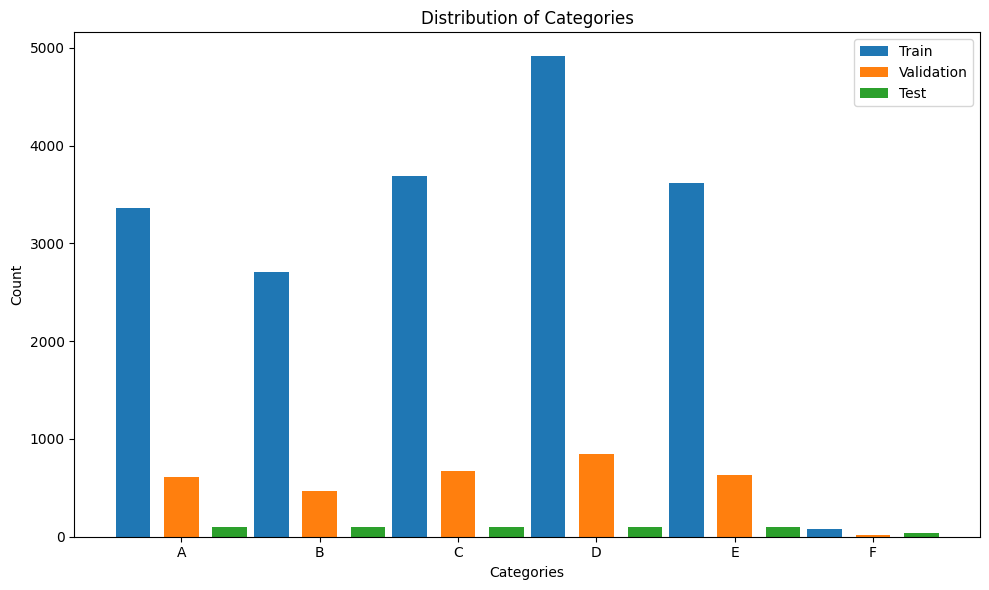

In [ ]:
# Calculate the width and spacing for the bars
bar_width = 0.25
spacing = 0.1

# Calculate the x-axis positions for each category
train_x = np.arange(len(train_category_values))
val_x = train_x + bar_width + spacing
test_x = val_x + bar_width + spacing

# Plot the distribution of categories
plt.figure(figsize=(10, 6))
plt.bar(train_x, train_category_counts, width=bar_width, label='Train')
plt.bar(val_x, val_category_counts, width=bar_width, label='Validation')
plt.bar(test_x, test_category_counts, width=bar_width, label='Test')
plt.xlabel('Categories')
plt.ylabel('Count')
plt.title('Distribution of Categories')
plt.xticks(val_x, train_category_values)  # Set x-axis labels
plt.legend()
plt.tight_layout()  # Adjust spacing between subplots
plt.show()

Categories looks evenly splitted between training, test and validation sets.

#### Split in Prediction and Train/Validation Set

In [ ]:
x_train = np.zeros((train_shape, input_length))
y_train = np.zeros((train_shape, prediction_length))
x_val = np.zeros((val_shape, input_length))
y_val = np.zeros((val_shape, prediction_length))
for i in range(train_shape):
  x_train[i] = train_data[i, range(0,standard_length)[:input_length]]
  y_train[i] = train_data[i, range(0,standard_length)[-prediction_length:]]
for i in range(val_shape):
  x_val[i] = val_data[i, range(0,standard_length)[:input_length]]
  y_val[i] = val_data[i, range(0,standard_length)[-prediction_length:]]

In [ ]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape

((18368, 200), (18368, 18), (3242, 200), (3242, 18))

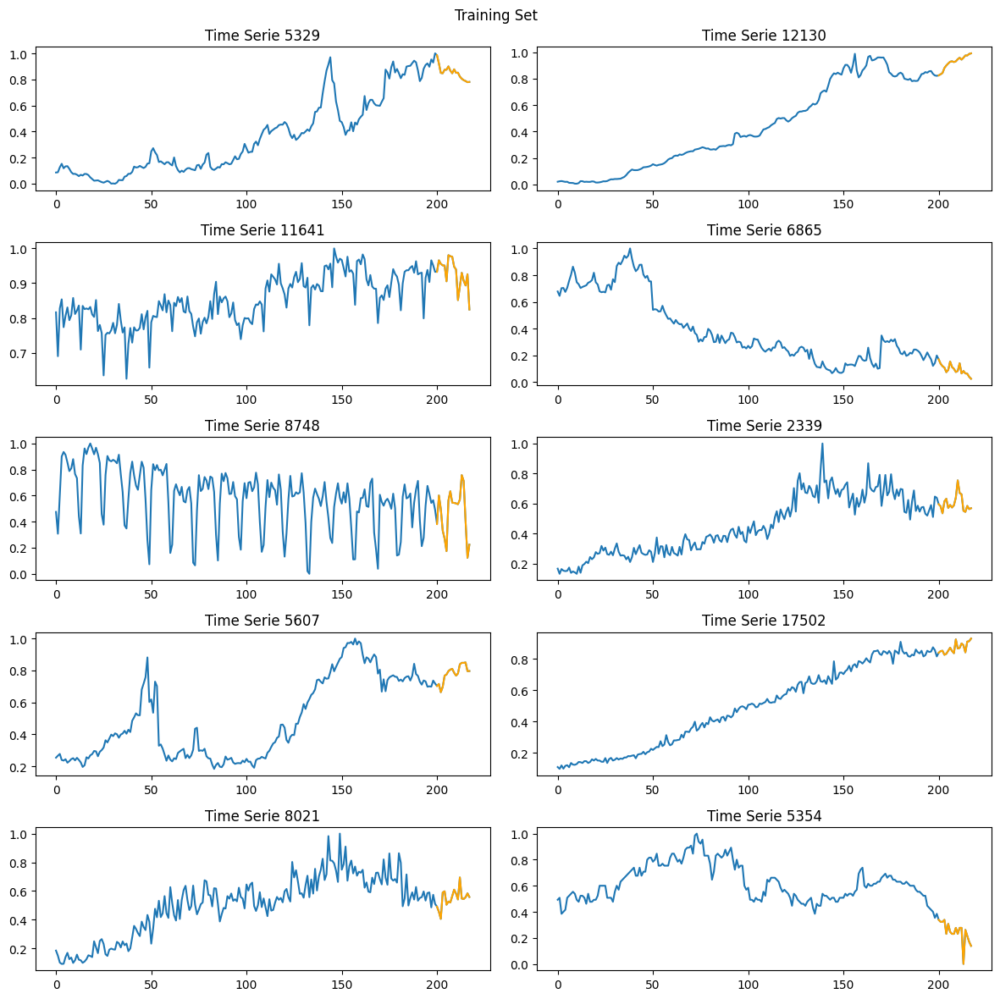

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([train_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(train_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_train[row_index], y_train[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_train[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Training Set")
plt.tight_layout()
plt.show()

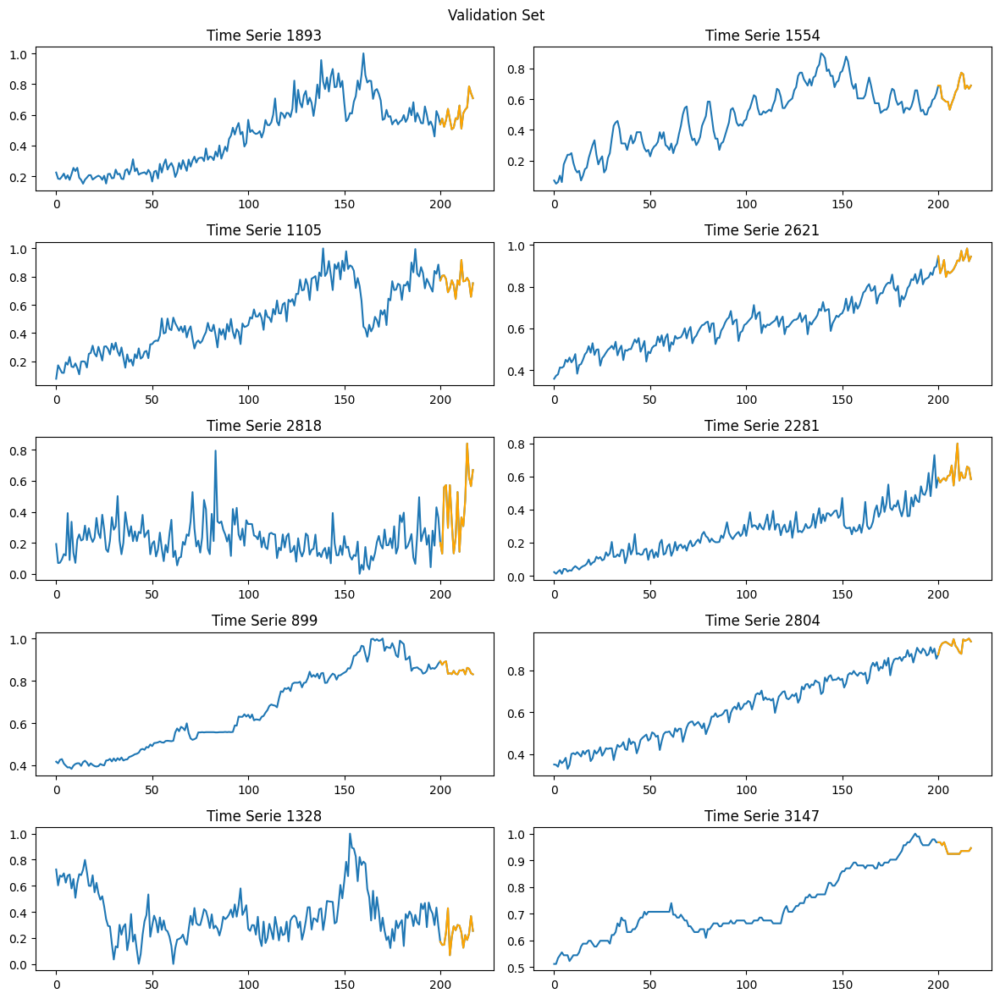

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([val_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(val_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_val[row_index], y_val[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_val[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Validation Set")
plt.tight_layout()
plt.show()

## Save Data

In [ ]:
# Save arrays to file
np.savez('Stride_218_NO-Zero_padding.npz', x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val, x_test=x_test, y_test=y_test)

#Stationary Data

We tried to see the task from another prespective, we made data stationary and changed the task in some sort of "deltas predictions". This approach showed interesting results in identifying prominent temporal patterns but lack of flexibility in unusual time series and in particoular it is strongly dependent on the first prediction since all other deltas predicted depend on it.

These data are used to train the model in section "Stationary Data" of the notebook "MODELS".

In [ ]:
# Load arrays from file
data = np.load('Stride_218_float32.npz')

# Access the loaded arrays
x_train, y_train, x_val, y_val, x_test, y_test = data['x_train'], data['y_train'], data['x_val'], data['y_val'], data['x_test'], data['y_test']

In [ ]:
# Calculate differences and add a small constant before applying log transformation
dd_x_train = np.diff(x_train, axis=1)
dd_y_train = np.diff(y_train, axis=1)
dd_x_val = np.diff(x_val, axis=1)
dd_y_val = np.diff(y_val, axis=1)
dd_x_test = np.diff(x_test, axis=1)
dd_y_test = np.diff(y_test, axis=1)

# Calculate the difference between the first element of y_train and the last element of x_train
new_element = y_train[:, 0] - x_train[:, -1]
# Insert the new_element at position 0 in dd_y_train
dd_y_train = np.insert(dd_y_train, 0, new_element, axis=1)
# Calculate the difference between the first element of y_val and the last element of x_val
new_element = y_val[:, 0] - x_val[:, -1]
# Insert the new_element at position 0 in dd_y_val
dd_y_val = np.insert(dd_y_val, 0, new_element, axis=1)
# Calculate the difference between the first element of y_test and the last element of x_test
new_element = y_test[:, 0] - x_test[:, -1]
# Insert the new_element at position 0 in dd_y_test
dd_y_test = np.insert(dd_y_test, 0, new_element, axis=1)

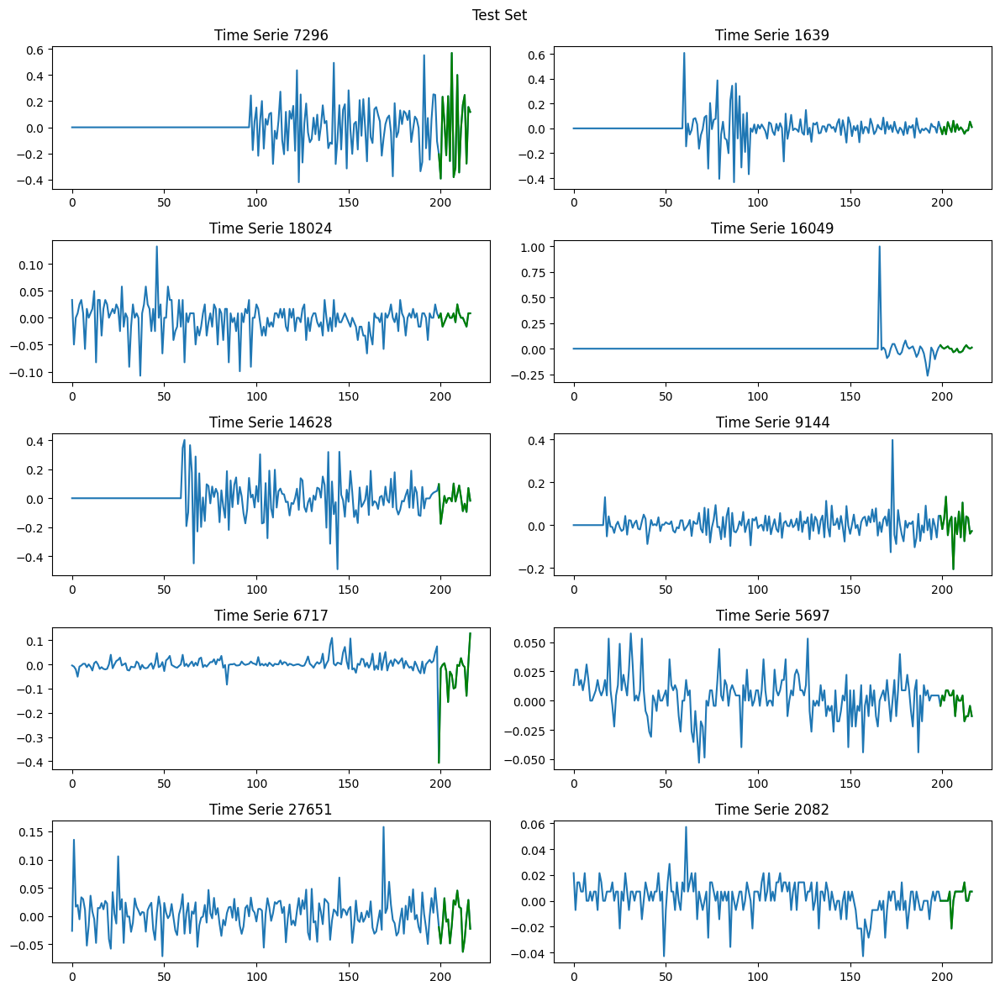

In [ ]:
# Create the figure and axes
figure, axes = plt.subplots(5, 2, figsize=(12, 12))

# Create an array filled with NaN values
empty = np.full((dd_x_train.shape[0], 199), np.nan)

# Generate 2 random row indices
random_rows = random.sample(range(dd_x_train.shape[0]), 10)

# Iterate through subplot grid
for i, ax in enumerate(axes.flatten()):
    row_index = random_rows[i]

    # Plot the original, green, and red lines with different line styles
    ax.plot(np.concatenate((dd_x_train[row_index], dd_y_train[row_index])))
    ax.plot(np.concatenate((empty[row_index], dd_y_train[row_index])), color='green')

    # Set the title
    ax.set_title(f'Time Serie {row_index}')

# Set the suptitle, adjust layout, and show the plot
plt.suptitle("Test Set")
plt.tight_layout()
plt.show()

In [ ]:
# Save arrays to file
np.savez('Stationary_Data.npz', x_train=dd_x_train, y_train=dd_y_train, x_val=dd_x_val, y_val=dd_y_val, x_test=dd_x_test, y_test=dd_y_test)

# Relevant Patterns Data

Extract only relevant patterns from the training data (1 for each of the time series longer than 218).

Remove sequences shorter than 218 and the zero paddings.

## Remove Short Time Series

In [ ]:
standard_length = 200 + 18

In [ ]:
short_indexes = []
long_indexes = []

for i,period in enumerate(valid_periods):
  temp = period[1] - period[0]
  if temp <= standard_length:
    short_indexes.append(i)
  else:
    long_indexes.append(i)


short_samples = len(short_indexes)
long_samples = len(long_indexes)
print("Number of time series shorter than 218 timestamps:", short_samples)
print("Number of time series longer than 218 timestamps:", long_samples)

Number of time series shorter than 218 timestamps: 28198
Number of time series longer than 218 timestamps: 19802


In [ ]:
short_series = np.zeros((short_samples, standard_length))
for i,j in enumerate(short_indexes):
  short_series[i] = training_data[j, range(0,max_period)[-standard_length:]]
train_categories = categories[short_indexes]

In [ ]:
short_series.shape

(28198, 218)

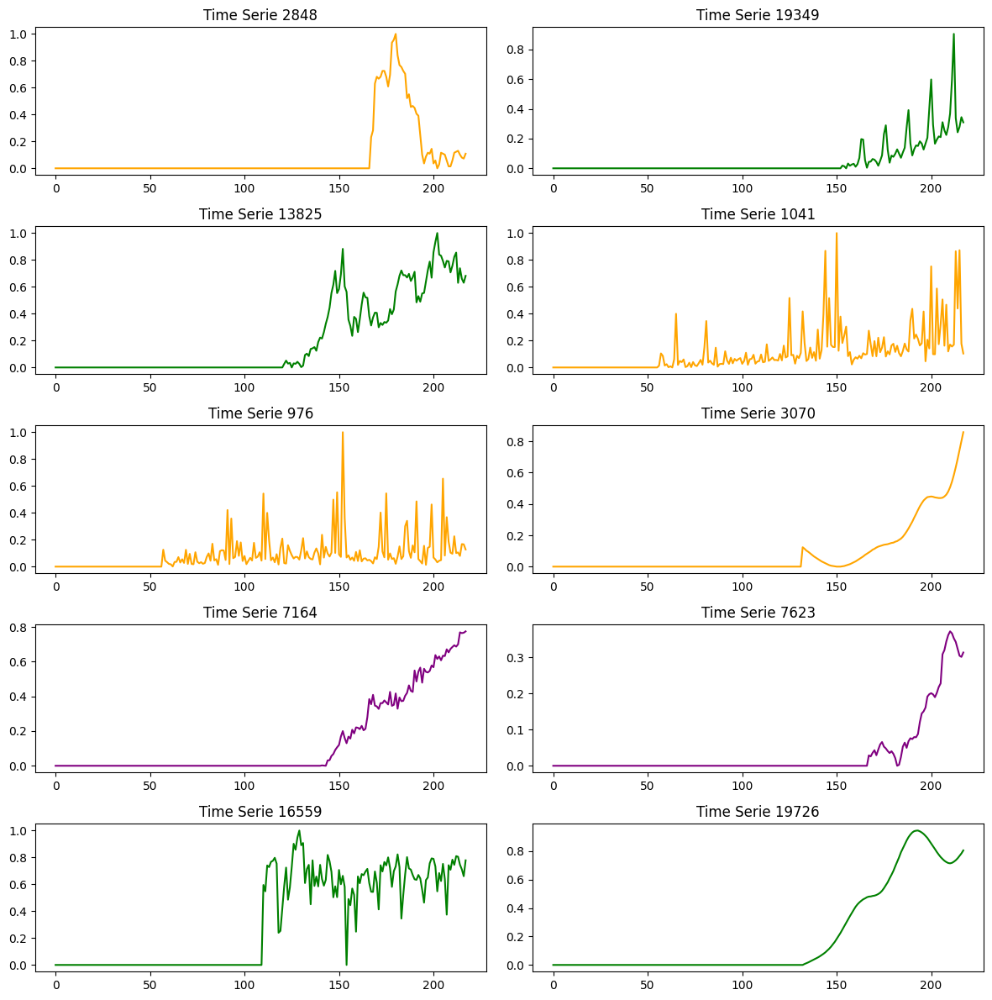

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(short_samples), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = train_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(short_series[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

In [ ]:
initial_dim = len(training_data)
training_data = training_data[~np.isin(np.arange(initial_dim), short_indexes)]
valid_periods = valid_periods[~np.isin(np.arange(initial_dim), short_indexes)]
categories = categories[~np.isin(np.arange(initial_dim), short_indexes)]

## Extract Relevant Patterns

In [ ]:
time_series_data = training_data

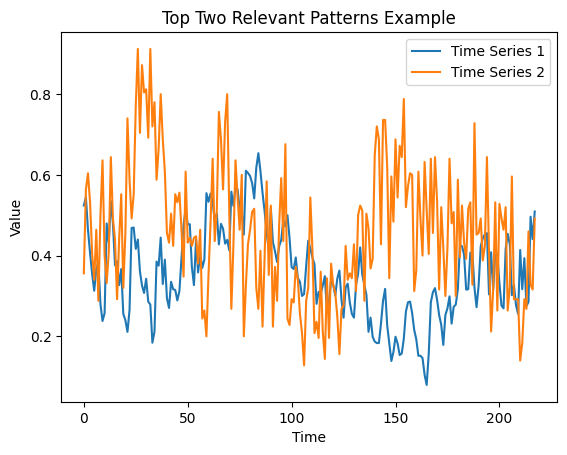

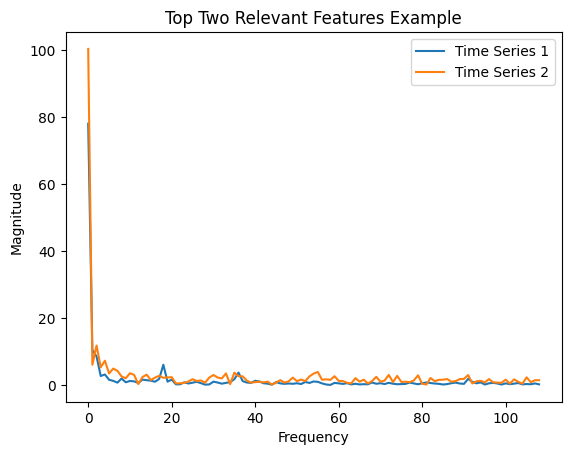

(19802, 327)


In [ ]:
window_size = 218

# Function to extract the top two relevant patterns using FFT
def extract_top_patterns(data, valid_periods, window_size=218, top_patterns=1):
    all_top_patterns = []

    for i in range(data.shape[0]):
        series = data[i, valid_periods[i,0]:valid_periods[i,1]]

        top_patterns_for_series = []

        # Apply a rolling window of size window_size
        for j in range(0, len(series) - window_size + 1):
            windowed_data = series[j : j + window_size]

            # Apply FFT to the windowed data
            fft_result = np.fft.fft(windowed_data)
            magnitude_spectrum = np.abs(fft_result)

            # Extract the most relevant features (e.g., frequencies with high magnitude)
            relevant_features = magnitude_spectrum[:window_size // 2]

            # Store the time series and features
            pattern = np.hstack((windowed_data, relevant_features))

            # Check if the list of top patterns is not full or if the current pattern has higher magnitude
            if len(top_patterns_for_series) < top_patterns or np.max(relevant_features) > np.max(top_patterns_for_series, axis=0)[-1]:
                # Append the relevant time series and features to the list
                top_patterns_for_series.append(pattern)

                # Sort the list by magnitude in descending order
                top_patterns_for_series = sorted(top_patterns_for_series, key=lambda x: np.max(x[window_size:]))

                # Keep only the top two patterns
                top_patterns_for_series = top_patterns_for_series[-top_patterns:]

        # Append the top patterns for the current time series
        all_top_patterns.extend(top_patterns_for_series)

    return np.array(all_top_patterns)

# Extract top two relevant patterns
top_patterns = extract_top_patterns(time_series_data, valid_periods)

# Visualize the top two patterns for a sample time series
for i, pattern in enumerate(top_patterns[:2]):
    sample_time_series = pattern[:window_size]
    sample_features = pattern[window_size:]

    # Plot the time series
    plt.plot(sample_time_series, label=f'Time Series {i + 1}')

plt.title("Top Two Relevant Patterns Example")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.show()

# Visualize the corresponding features
for i, pattern in enumerate(top_patterns[:2]):
    sample_features = pattern[window_size:]

    # Plot the features
    plt.plot(sample_features, label=f'Time Series {i + 1}')

plt.title("Top Two Relevant Features Example")
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.legend()
plt.show()

print(top_patterns.shape)

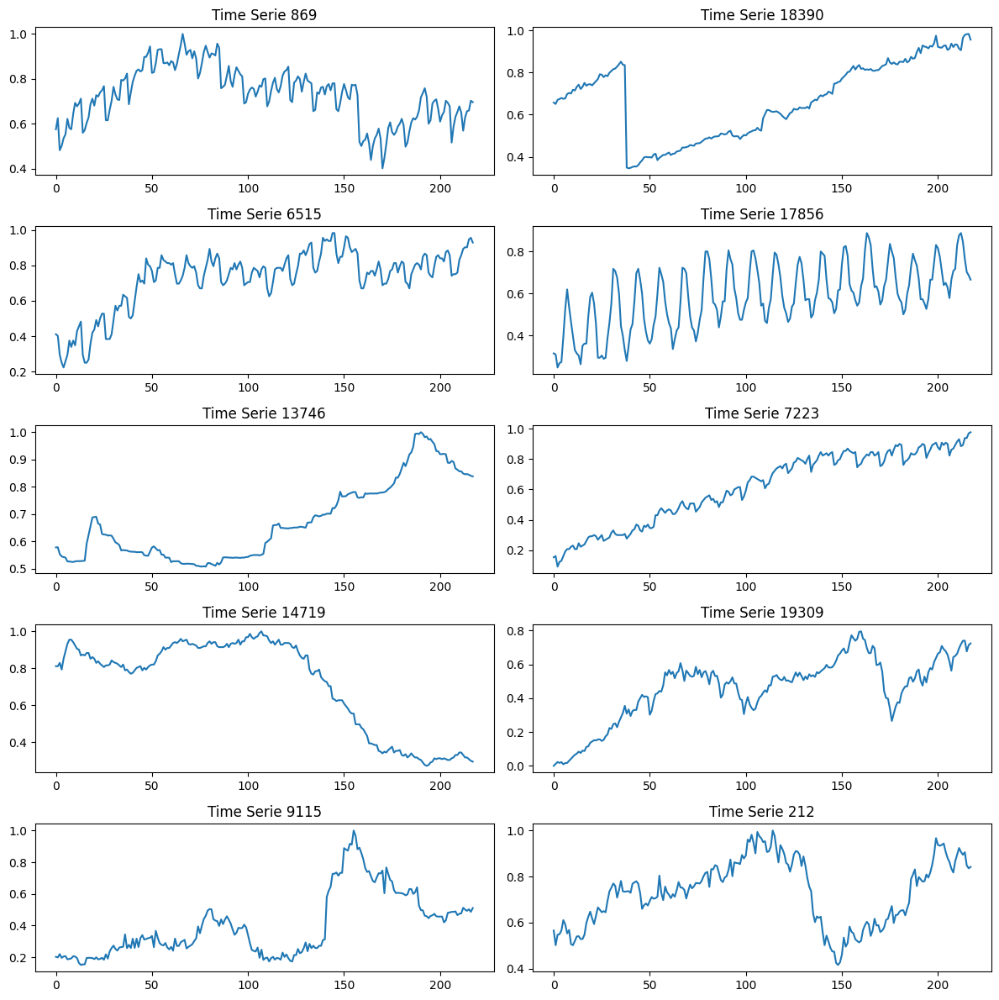

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(top_patterns.shape[0]), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(top_patterns[row_index,:window_size])
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

In [ ]:
training_data = top_patterns[:,:window_size]
training_data.shape

(19802, 218)

## Split Data

In [ ]:
window = 200 + 18
stride = int(window / 1)
prediction_length = 18
input_length = 200

In [ ]:
# Get the unique categories
unique_categories = np.unique(categories)
unique_categories

array(['A', 'B', 'C', 'D', 'E', 'F'], dtype='<U1')

### Test Set

The number of time series per category used for testing (except for F category that is underrepresented).

In [ ]:
test_dimension = 100

For testing purpose we preferred to consider only those time series without zero padding, so all those containing more than 218 timestamps.

We also preferred to avoid using too long time series because we are going to amplify the data by using a certain stride and we tought that maybe it will create some correlation with the training data.

So test data contains all those time series that are complete and that are not going to be amplified.

In [ ]:
test_series = []
for i,period in enumerate(valid_periods):
  temp = period[1] - period[0]
  if temp >= window and temp <= window*2:
    test_series.append(i)

test_samples = len(test_series)
print(f"Uncorrelated and complete data are {test_samples} time series")

Uncorrelated and complete data are 17976 time series


In [ ]:
# Initialize an empty list to store the concatenated arrays
test_series_reduced = []

# Iterate over each unique category
for cat in unique_categories:
    # Get the indices where the category matches in the 'test_series' array
    indices = np.where(cat == categories[test_series])[0][:test_dimension].astype(int)

    # Append the obtained array to the 'concatenated_array'
    test_series_reduced.extend(indices)

# Convert the list to a numpy array if needed
test_series_reduced = np.array(test_series_reduced)

In [ ]:
# Access values from test_series at indices in test_series_reduced
selected_test_series = np.array([test_series[index] for index in test_series_reduced])

In [ ]:
test_size = selected_test_series.shape[0]
print(test_size)

539


We obtained 539 test time series (100 per each category from A to E and 39 for category F).

In [ ]:
test_raw_data = training_data[selected_test_series]
test_periods = valid_periods[selected_test_series]
test_categories = categories[selected_test_series]

In [ ]:
test_raw_data.shape

(539, 218)

Generated 539 time series for testing purpose (over the initial 48000).

Plotting these test time series.

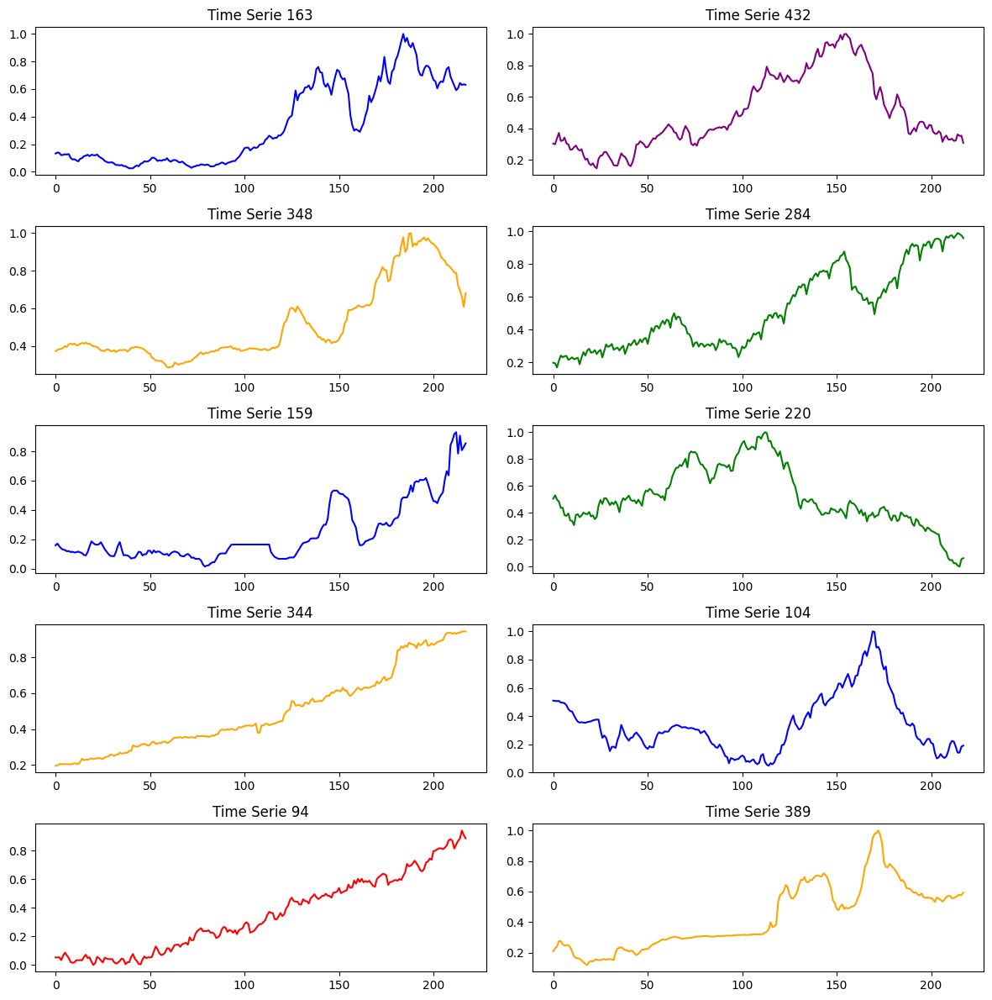

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_raw_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Reducing test series lenght to 218 as standard length for testing.

In [ ]:
test_data = np.zeros((test_size, window))
for i in range(test_size):
  test_data[i] = test_raw_data[i,-window:]

Plotting the reshaped test time series.

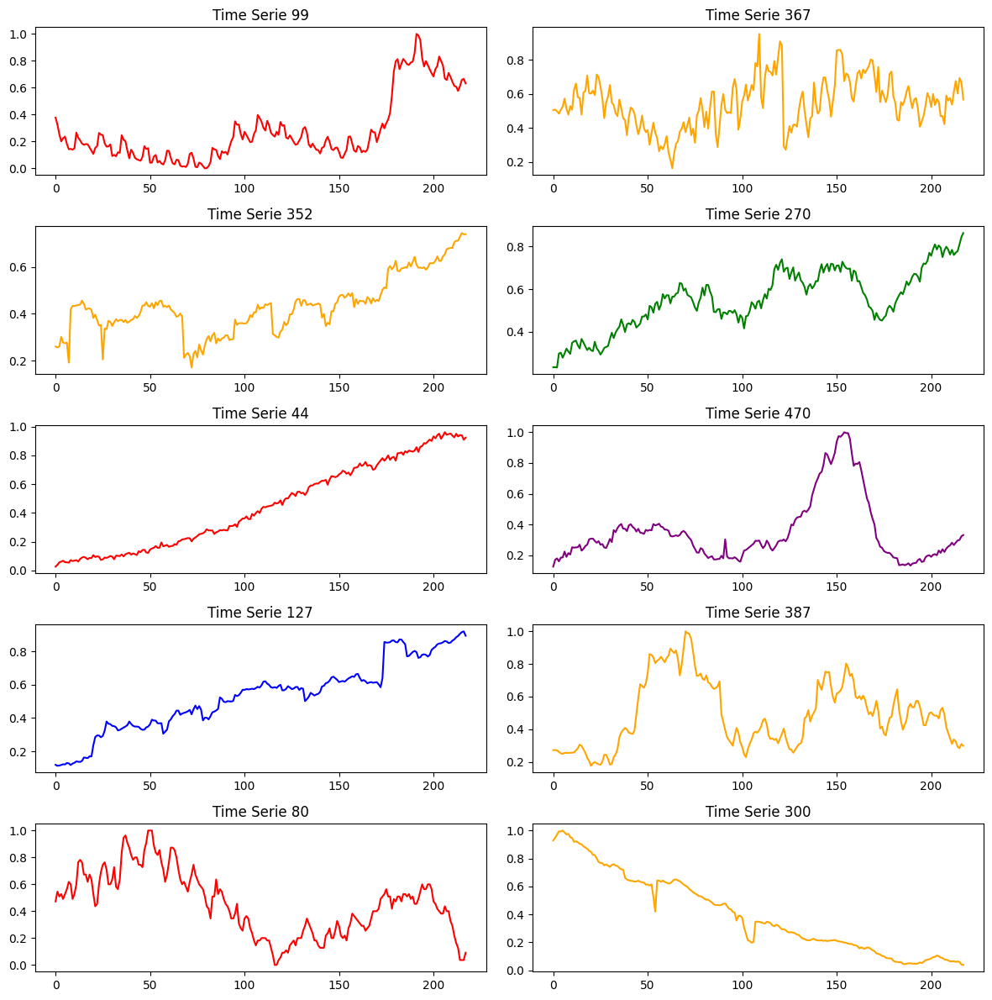

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Generate 10 random row indices
random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    category = test_categories[row_index]
    color = category_colors.get(category)
    axs[row, col].plot(test_data[row_index], color=color)
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.tight_layout()
plt.show()

Split the test and the predictions into 2 numpy arrays.

In [ ]:
x_test = np.zeros((test_size, input_length))
y_test = np.zeros((test_size, prediction_length))
for i in range(test_size):
  x_test[i] = test_data[i, range(0,window)[:input_length]]
  y_test[i] = test_data[i, range(0,window)[-prediction_length:]]

In [ ]:
x_test.shape, y_test.shape

((539, 200), (539, 18))

Plot the test set with predictions in orange (x_test and y_test).

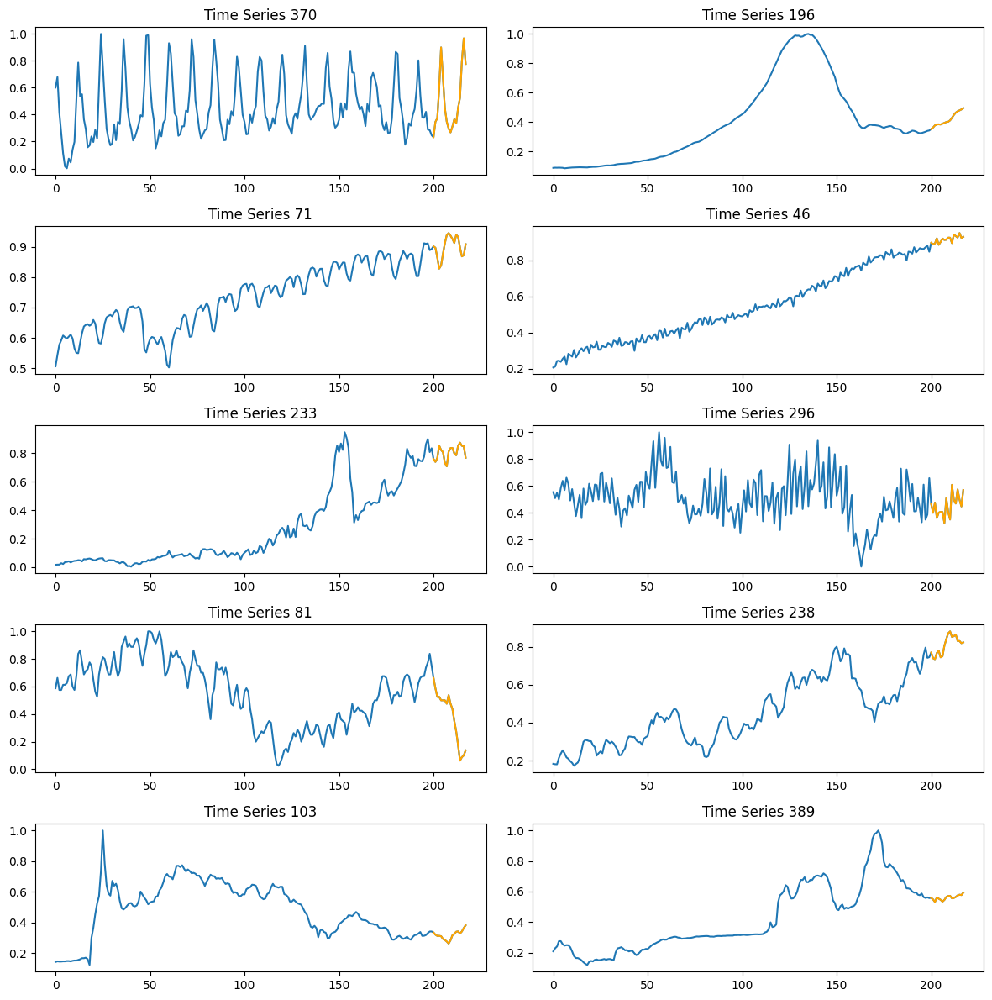

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.full((test_size, 200), np.nan)

random_rows = random.sample(range(test_size), 10)

for i, row_index in enumerate(random_rows):
    row, col = divmod(i, 2)
    x_concat = np.concatenate((x_test[row_index], y_test[row_index]))
    y_concat = np.concatenate((empty[row_index], y_test[row_index]))

    axs[row, col].plot(x_concat)
    axs[row, col].plot(y_concat, color='orange')
    axs[row, col].set_title(f'Time Series {row_index}')

plt.tight_layout()
plt.show()

### Training Set

In [ ]:
x_train_data = training_data[~np.isin(np.arange(len(training_data)), test_series_reduced)]
x_train_periods = valid_periods[~np.isin(np.arange(len(training_data)), test_series_reduced)]
x_train_categories = categories[~np.isin(np.arange(len(training_data)), test_series_reduced)]

In [ ]:
short_train_series = []
long_train_series = []

for i,period in enumerate(x_train_periods):
  temp = period[1] - period[0]
  if temp <= standard_length:
    short_train_series.append(i)
  else:
    long_train_series.append(i)


short_samples = len(short_train_series)
long_samples = len(long_train_series)
print("Number of time series shorter than 218 timestamps:", short_samples)
print("Number of time series longer than 218 timestamps:", long_samples)

Number of time series shorter than 218 timestamps: 0
Number of time series longer than 218 timestamps: 19263


### Train and Validation Split

Split the initial data into training, test and validation sets.

In [ ]:
# Split the data and labels into train and validation sets
train_data, val_data, train_categories, val_categories = train_test_split(x_train_data, x_train_categories, test_size=0.15, random_state=42)
train_shape = train_data.shape[0]
test_shape = x_test.shape[0]
val_shape = val_data.shape[0]
print("Shapes:")
print(f" Train: {train_shape} \n Test: {test_shape} \n Validation: {val_shape}")

Shapes:
 Train: 16373 
 Test: 539 
 Validation: 2890


Analyse the distribution of category in the sets.

In [ ]:
# Count the occurrences of the categories
train_category_values, train_category_counts = np.unique(train_categories, return_counts=True)
test_category_values, test_category_counts = np.unique(test_categories, return_counts=True)
val_category_values, val_category_counts = np.unique(val_categories, return_counts=True)

# Print the counts
print("TRAIN:")
for value, count in zip(train_category_values, train_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("VALIDATION:")
for value, count in zip(val_category_values, val_category_counts):
    print(f"Train category: {value}, Count: {count}")
print("TEST:")
for value, count in zip(test_category_values, test_category_counts):
    print(f"Train category: {value}, Count: {count}")

TRAIN:
Train category: A, Count: 3171
Train category: B, Count: 2394
Train category: C, Count: 3014
Train category: D, Count: 4398
Train category: E, Count: 3340
Train category: F, Count: 56
VALIDATION:
Train category: A, Count: 559
Train category: B, Count: 396
Train category: C, Count: 547
Train category: D, Count: 743
Train category: E, Count: 636
Train category: F, Count: 9
TEST:
Train category: A, Count: 100
Train category: B, Count: 100
Train category: C, Count: 100
Train category: D, Count: 100
Train category: E, Count: 100
Train category: F, Count: 39


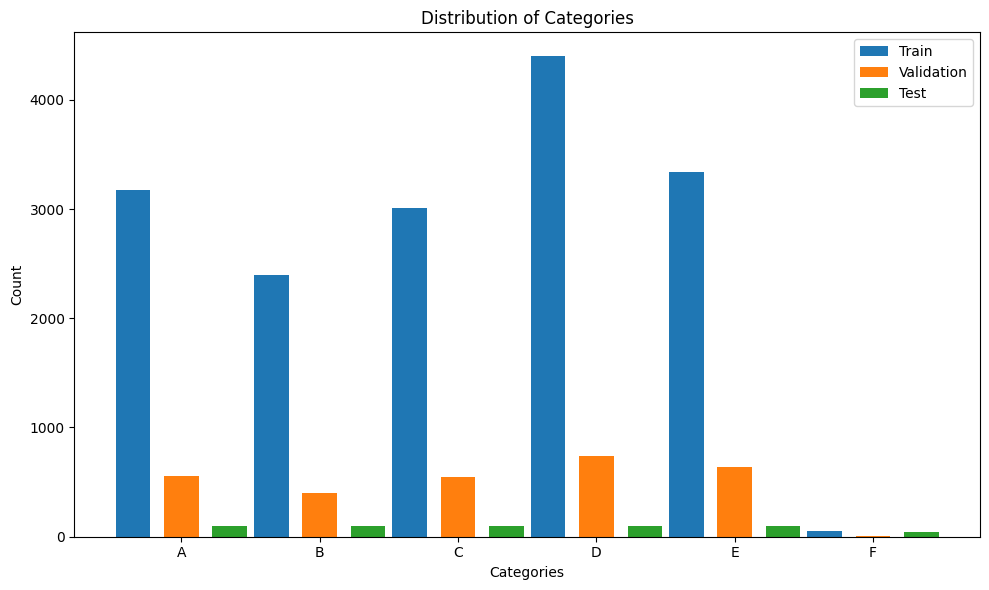

In [ ]:
# Calculate the width and spacing for the bars
bar_width = 0.25
spacing = 0.1

# Calculate the x-axis positions for each category
train_x = np.arange(len(train_category_values))
val_x = train_x + bar_width + spacing
test_x = val_x + bar_width + spacing

# Plot the distribution of categories
plt.figure(figsize=(10, 6))
plt.bar(train_x, train_category_counts, width=bar_width, label='Train')
plt.bar(val_x, val_category_counts, width=bar_width, label='Validation')
plt.bar(test_x, test_category_counts, width=bar_width, label='Test')
plt.xlabel('Categories')
plt.ylabel('Count')
plt.title('Distribution of Categories')
plt.xticks(val_x, train_category_values)  # Set x-axis labels
plt.legend()
plt.tight_layout()  # Adjust spacing between subplots
plt.show()

Categories looks evenly splitted between training, test and validation sets.

#### Split in Prediction and Train/Validation Set

In [ ]:
x_train = np.zeros((train_shape, input_length))
y_train = np.zeros((train_shape, prediction_length))
x_val = np.zeros((val_shape, input_length))
y_val = np.zeros((val_shape, prediction_length))
for i in range(train_shape):
  x_train[i] = train_data[i, range(0,standard_length)[:input_length]]
  y_train[i] = train_data[i, range(0,standard_length)[-prediction_length:]]
for i in range(val_shape):
  x_val[i] = val_data[i, range(0,standard_length)[:input_length]]
  y_val[i] = val_data[i, range(0,standard_length)[-prediction_length:]]

In [ ]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape

((16373, 200), (16373, 18), (2890, 200), (2890, 18))

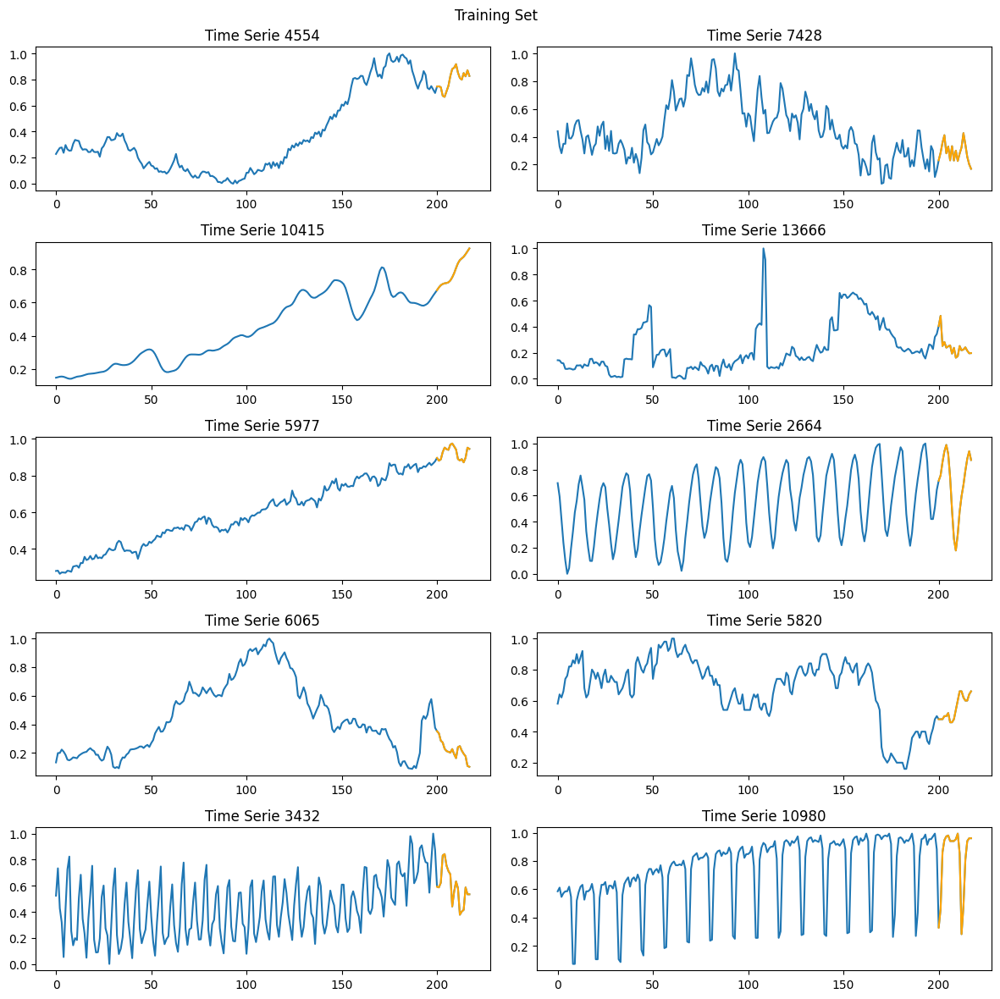

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([train_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(train_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_train[row_index], y_train[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_train[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Training Set")
plt.tight_layout()
plt.show()

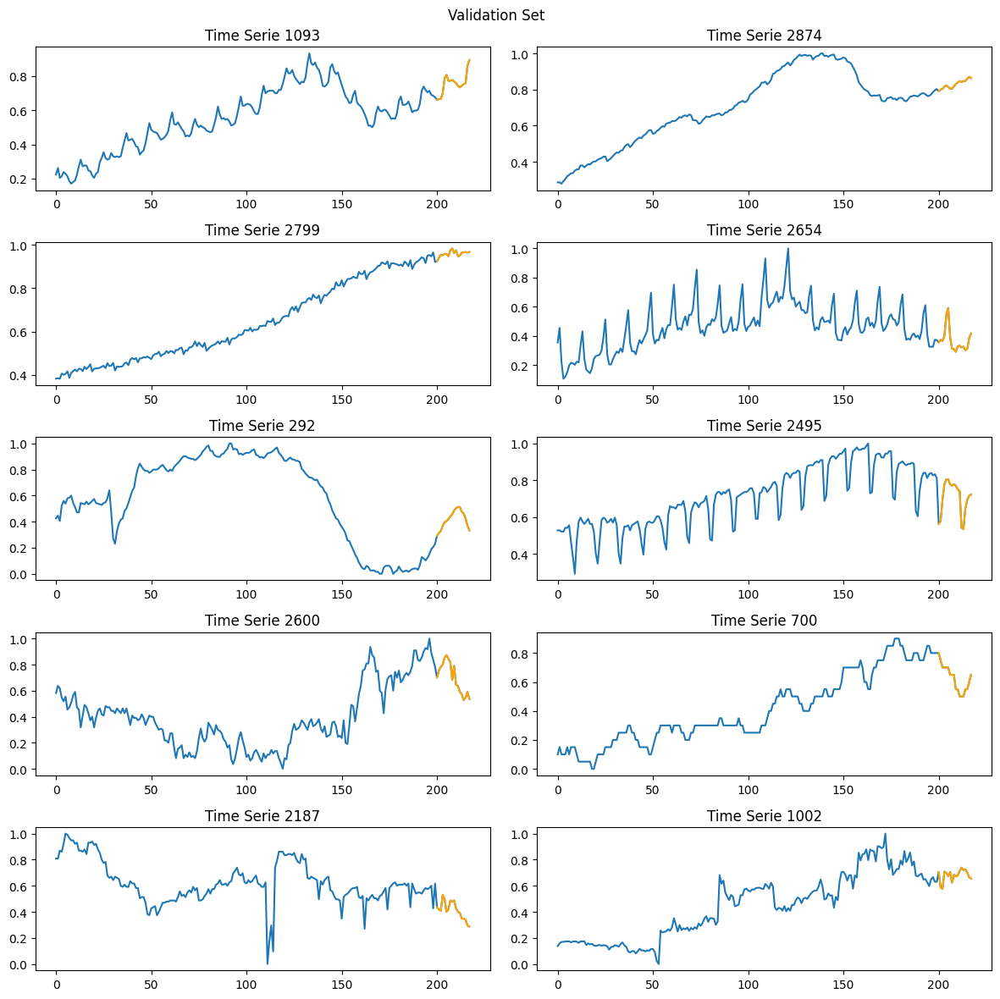

In [ ]:
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

empty = np.zeros([val_shape, 200])
empty[empty == 0] = np.nan  # Set empty values to NaN

# Generate 10 random row indices
random_rows = random.sample(range(val_shape), 10)

for i, row_index in enumerate(random_rows):
    row = i // 2
    col = i % 2
    axs[row, col].plot(np.concatenate((x_val[row_index], y_val[row_index])))
    axs[row, col].plot(np.concatenate((empty[row_index], y_val[row_index])), color='orange')
    axs[row, col].set_title(f'Time Serie {row_index}')

plt.suptitle("Validation Set")
plt.tight_layout()
plt.show()

## Save Data

In [ ]:
# Save arrays to file
np.savez('Relevant_Patterns.npz', x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val, x_test=x_test, y_test=y_test)